In [1]:
%reload_ext autoreload
%autoreload
%matplotlib inline
import torch


In [2]:
from fastai import *
from fastai.vision import *
from fastai.vision.gan import *
from fastai.callbacks import *
import os
from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
pd.set_option('display.max_columns', 50)

In [3]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

In [4]:
path = Path('text_detection')
path_hr = Path('generated_images/without_text')
path_lr = Path('generated_images/with_text')
path_without = Path('data_malik/without_text')
path_with = Path('data_malik/with_text')
path_flpred = Path('flpred')
bboxarray = pd.read_csv('data_malik/boundingBoxes.csv')
bs = 64

In [5]:
def findLargest(boxarray):
    largestx = 0
    largesty = 0
    for idx, bbox in boxarray:
        if (bbox.xmax - bbox.xmin) > largestx:
            largestx = (bbox.xmax - bbox.xmin)
        if (bbox.ymax - bbox.ymin) > largesty:
            largesty = (bbox.ymax - bbox.ymin)
    return (largestx, largesty)
        

In [6]:
def minfits(tl):
    left, top = (0,0)
    if((tl[0] -20) >= 0):
        left = tl[0] -20
    if((tl[1] -20) >= 0):
        top = tl[1] -20
    return left, top

def maxfits(br):
    right, bottom = (1024,1024)
    if((br[0] +20) <= 1024):
        right = br[0] +20
    if((br[1] +20) <= 1024):
        bottom = br[1] +20
    return right, bottom

In [7]:
from PIL import Image, ImageOps, ImageDraw

def paddz(img, expected_size):
    width, height = img.size
    if(width < expected_size):
        if(width > height):
            diff = expected_size-width
            img = img.resize((expected_size, (diff+height)))
            img = ImageOps.pad(img, (expected_size,expected_size), Image.BILINEAR, None)
        elif(height > width):
            diff = expected_size-height
            img = img.resize(((diff+width), expected_size))
            img = ImageOps.pad(img, (expected_size,expected_size), Image.BILINEAR, None)
    else:
        img = img.resize((expected_size, height), Image.BILINEAR)
    return img

def remove_pad(img, original_w, original_h):
    width, height = img.size
    if(width > original_w):
        if(original_w > original_h):
            diff = 128 - original_w
            newheight = original_h + diff
            pad = (128 - newheight)/2
            if((128-newheight)%2 == 1):
                img = img.crop((0, pad, 128, (128-pad) - 1 ))
            else:
                img = img.crop((0, pad, 128, 128-pad))
            img = img.resize((original_w, original_h), Image.LANCZOS)
        elif(original_h > original_w):
            diff = 128 - original_h
            newheight = original_w + diff
            pad = 128 - newheight
            img = img.crop((pad, 0, 128-pad, 128))
            img = img.resize((original_w, original_h), Image.LANCZOS)
        else:
            img = img.resize((original_w, original_h), Image.LANCZOS)
    else:
        pad = math.ceil((128-original_h)/2)
        img = img.crop((0, pad, 128, 128-pad))
        img = img.resize((original_w, original_h), Image.LANCZOS)    
   
    return img

In [8]:
import math
def extract(img, tl, br):
    im = Image.open(img)
    left, top = minfits(tl)
    right, bottom = maxfits(br)
    cropped = im.crop((left, top, right, bottom))
    
    cropped = paddz(cropped, 128)

    return cropped


def insert(img1, img2, tl, br ):
  
    crop = Image.open(img1)
  
    left, top = minfits(tl)
    right, bottom = maxfits(br)
    
    crop = remove_pad(crop, (right-left), (bottom-top))
    
    
    full_image = img2
    
    full_image.paste(crop, (left, top, right, bottom))

    return full_image


In [101]:
import glob
with_text = []
without_text = []
for img in sorted(glob.glob("data_malik/with_text/*.png")):
    with_text.append(img)
for img in sorted(glob.glob("data_malik/without_text/*.png")):
    without_text.append(img)


In [102]:
def run_extract(text, notext, boxes):
    nameCounter = 0
    imgIdx = 0
    prev = "00000000.png"
    for index, row in boxes.iterrows():
        img = extract(text[imgIdx], (row.xmin, row.ymin), (row.xmax, row.ymax))
        img1 = extract(notext[imgIdx], (row.xmin, row.ymin), (row.xmax, row.ymax))
        if(row.filename ==prev):
            nameCounter = nameCounter+1
        else:
            nameCounter = 1
            imgIdx = imgIdx+1
        
        img.save(path_lr/(row.filename[:-4] + "-" + str(nameCounter) + ".png"))
        img1.save(path_hr/(row.filename[:-4] + "-" + str(nameCounter) + ".png"))
        
        prev = row.filename
        
       

In [103]:
bboxarray.tail()

,class,filename,filename_source,height,imageheight,imagewidth,name,width,x,xmax,xmin,y,ymax,ymin
109614,text,00008776.png,fff1cc9c-3895-43be-84e1-a7aaef21002b.dcm,5,1024,1024,FM n7DY,34,786,820,752,959,965,954
109615,text,00008776.png,fff1cc9c-3895-43be-84e1-a7aaef21002b.dcm,7,1024,1024,auZ_cgöU x5S/yIsöVE,93,835,929,742,942,950,935
109616,text,00008776.png,fff1cc9c-3895-43be-84e1-a7aaef21002b.dcm,7,1024,1024,lg,8,750,759,742,923,930,916
109617,text,00008776.png,fff1cc9c-3895-43be-84e1-a7aaef21002b.dcm,7,1024,1024,-lözfOAkUm7Z66jbL_i,93,836,929,743,904,912,897
109618,text,00008776.png,fff1cc9c-3895-43be-84e1-a7aaef21002b.dcm,5,1024,1024,FEw,14,497,511,483,665,671,660


In [104]:
bboxarray = bboxarray.sort_values(by=['filename'])

In [105]:
bboxarray = bboxarray.reset_index(drop=True)

In [106]:
bboxarray.head()

,class,filename,filename_source,height,imageheight,imagewidth,name,width,x,xmax,xmin,y,ymax,ymin
0,text,00000000.png,ab559a68-0d0c-43db-beb3-bd3885b787a1.dcm,5,1024,1024,Zu,8,31,40,23,942,948,937
1,text,00000000.png,ab559a68-0d0c-43db-beb3-bd3885b787a1.dcm,5,1024,1024,p,3,388,392,385,715,721,710
2,text,00000000.png,ab559a68-0d0c-43db-beb3-bd3885b787a1.dcm,7,1024,1024,QXqQ,19,790,809,771,945,952,938
3,text,00000000.png,ab559a68-0d0c-43db-beb3-bd3885b787a1.dcm,8,1024,1024,Tå26_9d øL,49,820,869,771,965,974,957
4,text,00000000.png,ab559a68-0d0c-43db-beb3-bd3885b787a1.dcm,6,1024,1024,L.TKrT.3å2RV,59,73,132,14,52,59,46


In [ ]:
run_extract(with_text, without_text, bboxarray)

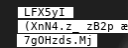

In [114]:
img = open_image(path_lr/'00009999-1.png')
img

In [ ]:
img.resize([128,128])

In [ ]:
img.resize((51,57))

In [9]:
arch = models.resnet34

In [10]:
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [21]:
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr/x.name)
           .transform(size=size, tfm_y=True, resize_method=ResizeMethod.PAD)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [22]:
bs,size = 64,128
data = get_data(bs, size)

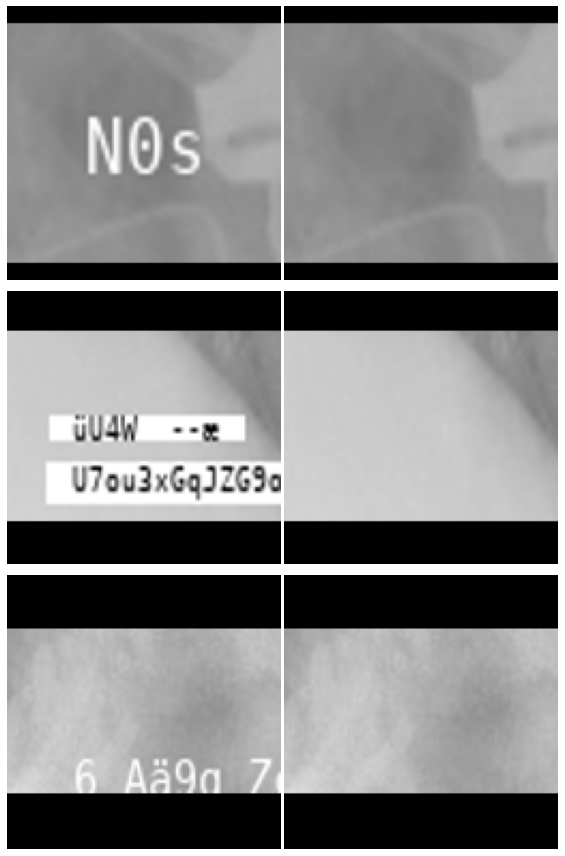

In [23]:
data.show_batch(3)

In [24]:
t = data.valid_ds[0][1].data
t = torch.stack([t,t])

In [25]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [26]:
gram_matrix(t)

tensor([[[0.0032, 0.0032, 0.0032],
         [0.0032, 0.0032, 0.0032],
         [0.0032, 0.0032, 0.0032]],

        [[0.0032, 0.0032, 0.0032],
         [0.0032, 0.0032, 0.0032],
         [0.0032, 0.0032, 0.0032]]])

In [27]:
base_loss = F.l1_loss

In [28]:
from fastai.utils.mem import *

from torchvision.models import vgg16_bn
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [29]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

In [30]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [31]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])
wd = 1e-3


In [32]:
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics, self_attention=True,
                     blur=True, norm_type=NormType.Weight)
gc.collect();

In [33]:
learn.lr_find()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 3.98E-04
Min loss divided by 10: 4.37E-02


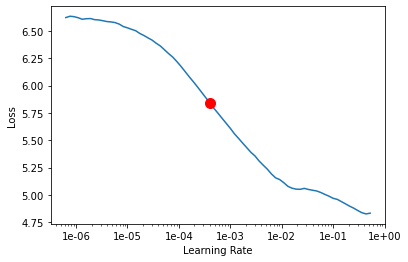

In [34]:
learn.recorder.plot(suggestion=True)

In [35]:
min_grad_lr = slice(1e-04,1e-03)

learn.fit_one_cycle(4, min_grad_lr, pct_start=0.9)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.749523,1.680542,0.108698,0.167453,0.210214,0.032662,0.438170,0.700957,0.022387,27:19
1,1.192865,1.177520,0.060723,0.122467,0.159682,0.026046,0.292149,0.497687,0.018766,27:08
2,1.048543,0.996960,0.050222,0.104748,0.138531,0.023214,0.236320,0.427047,0.016877,27:00
3,0.666183,0.639360,0.028993,0.072986,0.097093,0.018488,0.135629,0.271625,0.014547,26:55


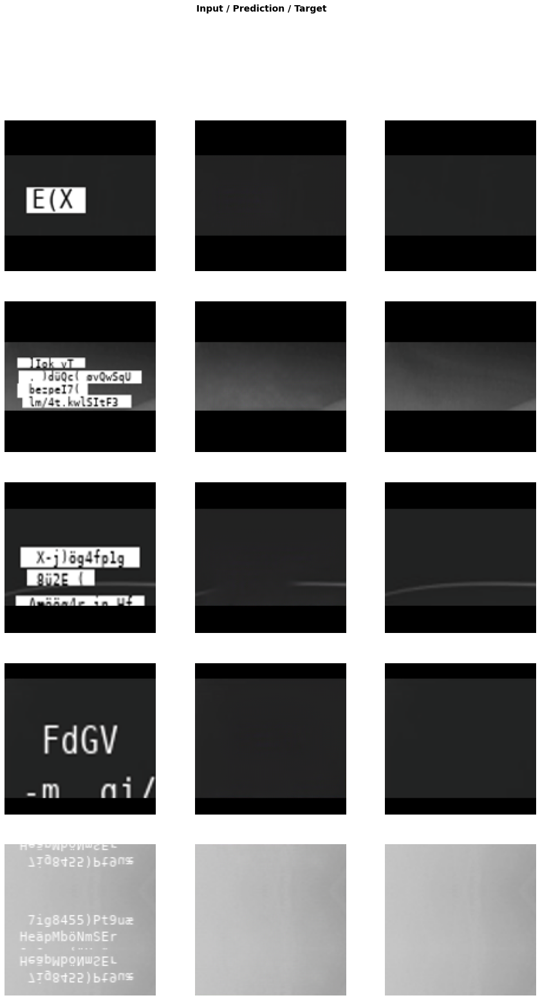

In [36]:
learn.show_results(rows=5, imgsize=5)

In [37]:
learn.fit_one_cycle(6, min_grad_lr)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.723299,0.734371,0.038191,0.076644,0.105795,0.019308,0.152678,0.326772,0.014982,26:54
1,0.712111,0.711357,0.041048,0.076018,0.103007,0.019171,0.159191,0.298176,0.014747,26:52
2,0.610694,0.577931,0.027768,0.066025,0.089131,0.017359,0.115348,0.248506,0.013795,26:51
3,0.525369,0.533444,0.024958,0.061671,0.083370,0.016422,0.104977,0.228930,0.013114,26:50
4,0.467243,0.472434,0.020179,0.056347,0.075696,0.015380,0.091263,0.201051,0.012517,26:51
5,0.443640,0.463934,0.019756,0.055544,0.074542,0.015240,0.089326,0.197085,0.012440,26:51


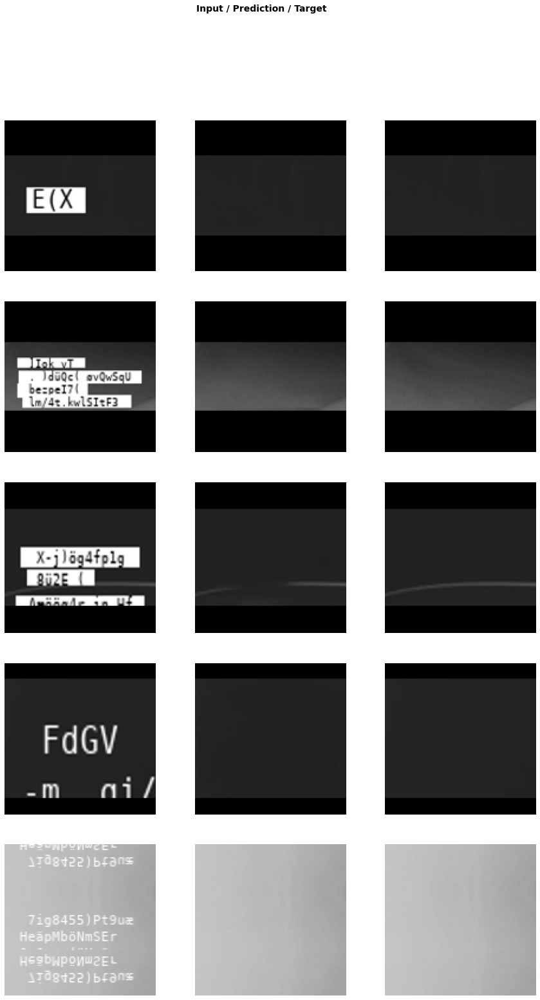

In [38]:
learn.show_results(rows=5, imgsize=5)

In [39]:
learn.unfreeze()

In [40]:
learn.lr_find()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 6.31E-07
Min loss divided by 10: 9.12E-08


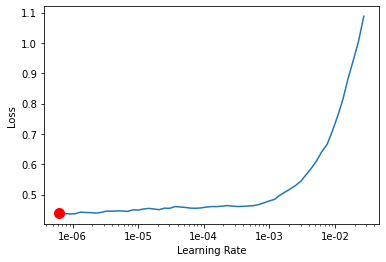

In [41]:
learn.recorder.plot(suggestion=True)

In [42]:
learn.fit_one_cycle(10, learn.recorder.min_grad_lr)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.446492,0.465070,0.019984,0.055699,0.074714,0.015280,0.089514,0.197412,0.012466,27:48
1,0.445401,0.463736,0.019675,0.055554,0.074553,0.015239,0.089219,0.197060,0.012436,27:48
2,0.452289,0.462946,0.019676,0.055489,0.074426,0.015228,0.089082,0.196616,0.012430,27:48
3,0.443144,0.462819,0.019677,0.055426,0.074411,0.015231,0.088996,0.196640,0.012438,27:48
4,0.453243,0.462383,0.019478,0.055419,0.074338,0.015212,0.089029,0.196484,0.012423,27:47
5,0.443032,0.462187,0.019513,0.055446,0.074316,0.015210,0.088960,0.196322,0.012421,27:47
6,0.437406,0.461879,0.019454,0.055488,0.074322,0.015203,0.088840,0.196161,0.012412,27:48
7,0.435813,0.461171,0.019391,0.055383,0.074227,0.015187,0.088688,0.195892,0.012402,27:48
8,0.443592,0.461385,0.019459,0.055350,0.074233,0.015200,0.088739,0.195994,0.012411,27:47
9,0.445814,0.461304,0.019434,0.055365,0.074218,0.015186,0.088737,0.195960,0.012404,27:47


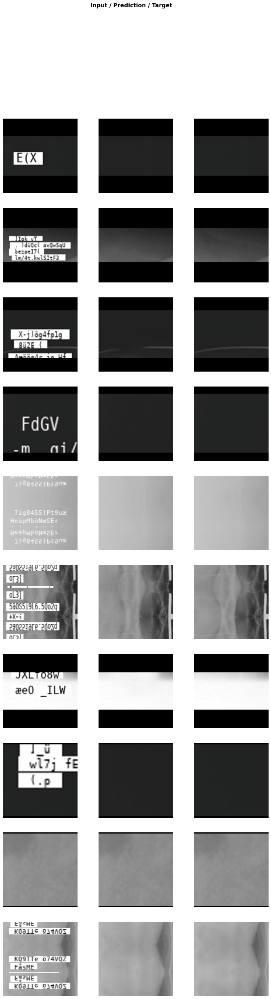

In [43]:
learn.show_results(rows=10)

In [44]:
learn.validate()

[0.4613044]

In [47]:
learn.export(Path('selfattent.pkl'))

In [14]:
learn = load_learner(Path())

In [53]:
path_lr = Path('selfattent/extracts/')
def pred_extract(text, boxes):
    nameCounter = 0
    imgIdx = 0
    prev = "00000000.png"
    for index, row in boxes.iterrows():
        img = extract(text[imgIdx], (row.xmin, row.ymin), (row.xmax, row.ymax))
        if(row.filename ==prev):
            nameCounter = nameCounter+1
        else:
            nameCounter = 1
            imgIdx = imgIdx+1
        img.save(path_lr/(row.filename[:-4] + "-" + str(nameCounter) + ".png"))
        
        prev = row.filename
        
       

In [49]:
predboxes = pd.read_csv('test_data_malik/boundingBoxes.csv')
predpath = Path('test_data_malik/with_text')

In [50]:
predboxes = predboxes.sort_values(by=['filename'])
predboxes = predboxes.reset_index(drop=True)

In [51]:
predboxes.head(20)

,class,filename,filename_source,height,imageheight,imagewidth,name,width,x,xmax,xmin,y,ymax,ymin
0,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,zhY3øV f,34,797,832,763,936,942,931
1,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,Ex,8,270,278,262,768,773,763
2,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,øPUKBEP,31,793,824,762,954,960,949
3,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,CS,8,780,788,772,992,997,987
4,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,7,1024,1024,UpUvT/AV3_,44,69,114,25,944,951,937
5,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,qxkYiaIxFVcYL0lm,71,96,167,25,961,968,955
6,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,o3zN U0-NT3 )V,66,91,158,25,980,986,974
7,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,7,1024,1024,3(ån]Mü.,33,796,830,763,973,980,966
8,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,r12KyJJ,29,43,72,14,49,56,43
9,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,PQny0g yIü,43,56,100,13,33,40,27


In [54]:
import glob
with_text = []
for img in sorted(glob.glob("test_data_malik/with_text/*.png")):
    with_text.append(img)

pred_extract(with_text, predboxes)

In [55]:
import natsort
preds = []
for img in natsort.natsorted(os.listdir('selfattent/extracts/')):
    img = "selfattent/extracts/" + img
    preds.append(img)

In [56]:
def save_preds(data):
    for pic in data:
        img = open_image(pic)
        pred, pred_ioidx, probs = learn.predict(img)
        pred.save(pic.replace('extracts', 'predictions'))

In [57]:
save_preds(preds)

In [58]:
import natsort
predictions = []
images = []
for img in natsort.natsorted(os.listdir('selfattent/predictions/')):
    img = "selfattent/predictions/" + img
    predictions.append(img)
for img in natsort.natsorted(os.listdir('test_data_malik/with_text')):
    img = "test_data_malik/with_text/" + img
    images.append(img)

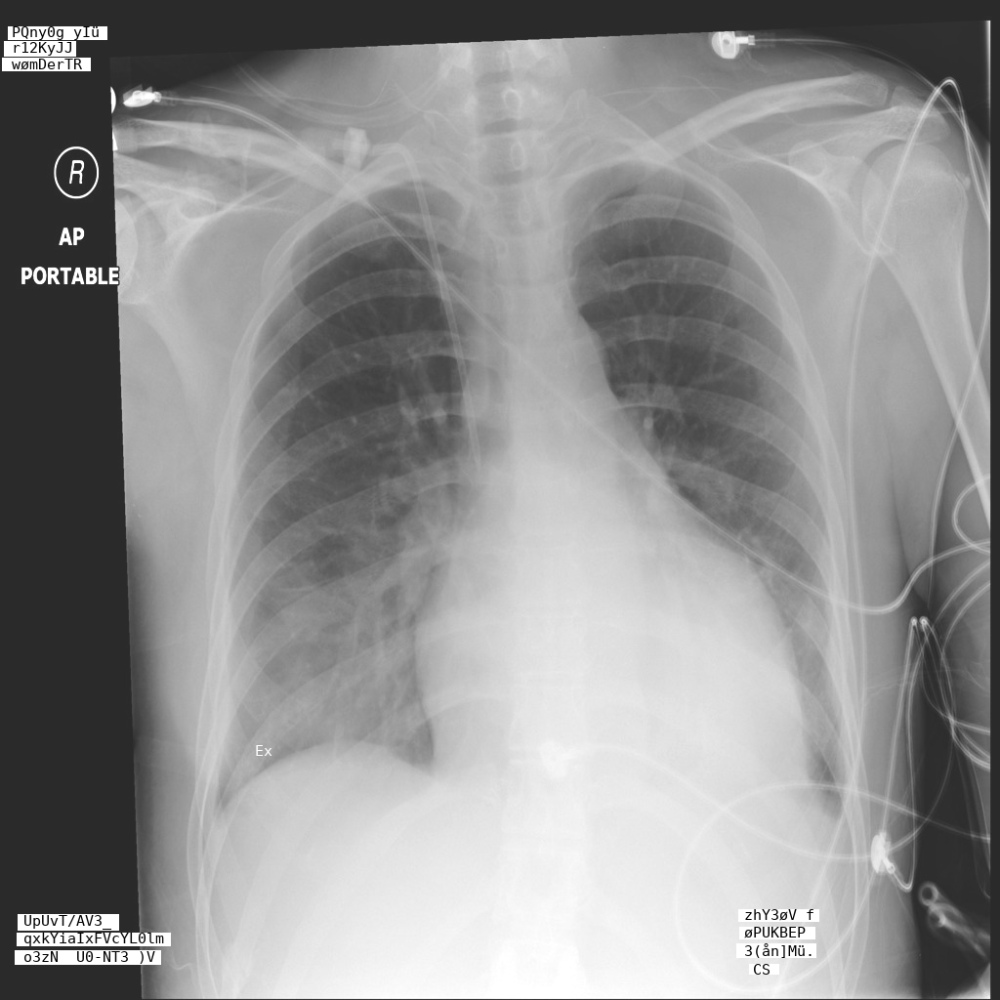

In [59]:
open_image(images[0])

In [60]:
predboxes.head(20)

,class,filename,filename_source,height,imageheight,imagewidth,name,width,x,xmax,xmin,y,ymax,ymin
0,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,zhY3øV f,34,797,832,763,936,942,931
1,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,Ex,8,270,278,262,768,773,763
2,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,øPUKBEP,31,793,824,762,954,960,949
3,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,5,1024,1024,CS,8,780,788,772,992,997,987
4,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,7,1024,1024,UpUvT/AV3_,44,69,114,25,944,951,937
5,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,qxkYiaIxFVcYL0lm,71,96,167,25,961,968,955
6,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,o3zN U0-NT3 )V,66,91,158,25,980,986,974
7,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,7,1024,1024,3(ån]Mü.,33,796,830,763,973,980,966
8,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,r12KyJJ,29,43,72,14,49,56,43
9,text,00000000.png,d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm,6,1024,1024,PQny0g yIü,43,56,100,13,33,40,27


In [61]:
savepath = Path('selfattent/final/')
def run_insert(box, image, boxes):
    prev = "00000000.png"
    imgIdx = 0
    img = Image.open('test_data_malik/with_text/00000000.png')
    for index, row in boxes.iterrows():
        print(row)
        if index == boxes.index[-1]:
            img.save("selfattent/final/" + row.filename)
        else:
            if(row.filename !=prev):
                img.save("selfattent/final/" + prev)
                imgIdx = imgIdx + 1
                img = insert(box[index], Image.open(image[imgIdx]), (row.xmin, row.ymin), (row.xmax, row.ymax) )
            else:
                img = insert(box[index], img, (row.xmin, row.ymin), (row.xmax, row.ymax))
            
            prev = row.filename

In [62]:
run_insert(predictions, images, predboxes)

class                                                  text
filename                                       00000000.png
filename_source    d0084f80-ab8a-4c87-b6f0-ead404d29f28.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                               zhY3øV f
width                                                    34
x                                                       797
xmax                                                    832
xmin                                                    763
y                                                       936
ymax                                                    942
ymin                                                    931
Name: 0, dtype: object
class                                                  text
filename                                       00000000.png
filename_source  

class                                                  text
filename                                       00000001.png
filename_source    7c8f2458-3d40-4810-b57c-1f149c2c4d3c.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            Tbi9R_cG2- 
width                                                    43
x                                                        73
xmax                                                    117
xmin                                                     30
y                                                       965
ymax                                                    972
ymin                                                    958
Name: 12, dtype: object
class                                                  text
filename                                       00000001.png
filename_source 

class                                                  text
filename                                       00000002.png
filename_source    e60359fa-6387-4391-ba02-59e9969ddb07.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     8æ
width                                                     4
x                                                        32
xmax                                                     37
xmin                                                     28
y                                                       954
ymax                                                    957
ymin                                                    952
Name: 27, dtype: object
class                                                  text
filename                                       00000002.png
filename_source 

class                                                  text
filename                                       00000004.png
filename_source    0d5bc737-03de-4bb8-98a1-45b7180c3e0f.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            yN WaMjnnD5
width                                                    27
x                                                        56
xmax                                                     83
xmin                                                     29
y                                                       988
ymax                                                    992
ymin                                                    984
Name: 46, dtype: object
class                                                  text
filename                                       00000004.png
filename_source 

class                                                  text
filename                                       00000005.png
filename_source    c554f3ed-e207-4c36-95da-dc6b2bb1dba9.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     øæ
width                                                     9
x                                                        40
xmax                                                     50
xmin                                                     31
y                                                       972
ymax                                                    977
ymin                                                    967
Name: 57, dtype: object
class                                                  text
filename                                       00000005.png
filename_source 

class                                                  text
filename                                       00000007.png
filename_source    1748e4e2-5c73-4794-81fe-2c5fe4af8cdd.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      D
width                                                     2
x                                                       434
xmax                                                    437
xmin                                                    432
y                                                       797
ymax                                                    801
ymin                                                    794
Name: 72, dtype: object
class                                                  text
filename                                       00000007.png
filename_source 

class                                                  text
filename                                       00000009.png
filename_source    300ed981-36a5-438d-9120-e63f500947be.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                PaVLBm 
width                                                    14
x                                                       763
xmax                                                    778
xmin                                                    749
y                                                       986
ymax                                                    989
ymin                                                    984
Name: 85, dtype: object
class                                                  text
filename                                       00000009.png
filename_source 

class                                                  text
filename                                       00000010.png
filename_source    06e48d8a-93d5-40c6-b6be-f04378117ac8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                               Kd1ahnTl
width                                                    34
x                                                        62
xmax                                                     97
xmin                                                     28
y                                                       991
ymax                                                    996
ymin                                                    986
Name: 96, dtype: object
class                                                  text
filename                                       00000010.png
filename_source 

class                                                  text
filename                                       00000011.png
filename_source    9cd163df-3b96-4dd3-be8f-222d6954b167.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             v6OAy.UCM0
width                                                    44
x                                                        59
xmax                                                    104
xmin                                                     15
y                                                        82
ymax                                                     89
ymin                                                     76
Name: 109, dtype: object
class                                                  text
filename                                       00000011.png
filename_source

class                                                  text
filename                                       00000012.png
filename_source    bb6164ee-9b30-4b94-85ca-5f9d94b2ce4a.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        PxPXpy6evMQ6yDE
width                                                    66
x                                                       796
xmax                                                    863
xmin                                                    730
y                                                        46
ymax                                                     53
ymin                                                     40
Name: 120, dtype: object
class                                                  text
filename                                       00000012.png
filename_source

class                                                  text
filename                                       00000013.png
filename_source    658a2896-6f1b-41b8-bf00-c737fec7c969.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         ø aZ2 .pæeWCUB
width                                                    69
x                                                       803
xmax                                                    872
xmin                                                    734
y                                                       930
ymax                                                    937
ymin                                                    923
Name: 130, dtype: object
class                                                  text
filename                                       00000013.png
filename_source

class                                                  text
filename                                       00000015.png
filename_source    b88918d9-41ef-4a44-b7f6-0540b84e1038.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                 LbY-TF
width                                                    14
x                                                        39
xmax                                                     54
xmin                                                     25
y                                                       977
ymax                                                    980
ymin                                                    974
Name: 146, dtype: object
class                                                  text
filename                                       00000015.png
filename_source

class                                                  text
filename                                       00000017.png
filename_source    f08041f0-be4c-4893-858c-99465834cc0a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              h_URölwfD
width                                                    22
x                                                       799
xmax                                                    821
xmin                                                    777
y                                                       986
ymax                                                    990
ymin                                                    982
Name: 162, dtype: object
class                                                  text
filename                                       00000017.png
filename_source

class                                                  text
filename                                       00000018.png
filename_source    f4172404-7b38-4faa-b69d-8d96b7acfb38.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                     uu
width                                                     4
x                                                        28
xmax                                                     33
xmin                                                     24
y                                                       989
ymax                                                    991
ymin                                                    988
Name: 172, dtype: object
class                                                  text
filename                                       00000018.png
filename_source

class                                                  text
filename                                       00000019.png
filename_source    8371e6c0-0c0b-4676-b247-597e7c04260c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             Xc8QjöSkAN
width                                                    24
x                                                       750
xmax                                                    775
xmin                                                    726
y                                                        38
ymax                                                     42
ymin                                                     34
Name: 183, dtype: object
class                                                  text
filename                                       00000019.png
filename_source

class                                                  text
filename                                       00000020.png
filename_source    341dac0d-2d30-4442-adfc-5ee3cd7fb8ef.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     P8dly 1PR1RvjGAstD
width                                                    88
x                                                       812
xmax                                                    901
xmin                                                    724
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 194, dtype: object
class                                                  text
filename                                       00000020.png
filename_source

class                                                  text
filename                                       00000021.png
filename_source    46742c7c-75ab-499f-9fa3-2a99915e6738.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              _ Bä-tküD
width                                                    30
x                                                        58
xmax                                                     89
xmin                                                     28
y                                                       929
ymax                                                    935
ymin                                                    924
Name: 204, dtype: object
class                                                  text
filename                                       00000021.png
filename_source

class                                                  text
filename                                       00000022.png
filename_source    f4290e1f-6a3b-4691-8e1c-5d721b045964.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    s] 
width                                                     4
x                                                       732
xmax                                                    736
xmin                                                    728
y                                                        66
ymax                                                     69
ymin                                                     63
Name: 216, dtype: object
class                                                  text
filename                                       00000022.png
filename_source

class                                                  text
filename                                       00000023.png
filename_source    eaefa668-e01c-4729-8c02-56dd413c6f1e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      ]
width                                                     1
x                                                       594
xmax                                                    595
xmin                                                    593
y                                                       595
ymax                                                    598
ymin                                                    592
Name: 227, dtype: object
class                                                  text
filename                                       00000024.png
filename_source

class                                                  text
filename                                       00000025.png
filename_source    99ba79c5-7837-4f2b-9aef-b388830b3c4f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       aB0P98ICUUxTBeJ2
width                                                    78
x                                                        94
xmax                                                    173
xmin                                                     16
y                                                        28
ymax                                                     34
ymin                                                     23
Name: 243, dtype: object
class                                                  text
filename                                       00000025.png
filename_source

class                                                  text
filename                                       00000026.png
filename_source    4b482568-3c90-4abd-b5d7-421abdc24bfc.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                1ljE]k]
width                                                    16
x                                                        35
xmax                                                     52
xmin                                                     19
y                                                        48
ymax                                                     52
ymin                                                     44
Name: 255, dtype: object
class                                                  text
filename                                       00000026.png
filename_source

class                                                  text
filename                                       00000027.png
filename_source    477bf2ae-880d-411e-bd24-7c69fe0808ac.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            xwr-tx4A2gö
width                                                    27
x                                                        39
xmax                                                     66
xmin                                                     12
y                                                        39
ymax                                                     43
ymin                                                     36
Name: 270, dtype: object
class                                                  text
filename                                       00000027.png
filename_source

class                                                  text
filename                                       00000028.png
filename_source    c7cea557-31d9-42a6-8177-4a0e4b8ec7c4.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        0gtQcwl.7m(æ]mT
width                                                    67
x                                                        85
xmax                                                    152
xmin                                                     18
y                                                        48
ymax                                                     55
ymin                                                     42
Name: 281, dtype: object
class                                                  text
filename                                       00000028.png
filename_source

class                                                  text
filename                                       00000029.png
filename_source    d0bd2dd5-7cff-49f8-8d51-60c36ef78024.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             æKpv-ø  kY
width                                                    49
x                                                       787
xmax                                                    837
xmin                                                    738
y                                                        34
ymax                                                     41
ymin                                                     27
Name: 293, dtype: object
class                                                  text
filename                                       00000029.png
filename_source

class                                                  text
filename                                       00000031.png
filename_source    728a07c1-31e8-4167-ad19-ddd7b96ad14c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                 Göö]bd
width                                                    20
x                                                        51
xmax                                                     71
xmin                                                     31
y                                                       960
ymax                                                    965
ymin                                                    956
Name: 316, dtype: object
class                                                  text
filename                                       00000031.png
filename_source

class                                                  text
filename                                       00000032.png
filename_source    75476d93-08ae-4a2e-a5f2-167b772313ea.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   d4mf
width                                                    13
x                                                       748
xmax                                                    761
xmin                                                    735
y                                                        43
ymax                                                     47
ymin                                                     39
Name: 329, dtype: object
class                                                  text
filename                                       00000032.png
filename_source

class                                                  text
filename                                       00000034.png
filename_source    854fee36-d54c-4cde-904d-ab77f5e2e091.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                               r0 bF_7ü
width                                                    34
x                                                        67
xmax                                                    101
xmin                                                     33
y                                                       969
ymax                                                    976
ymin                                                    962
Name: 347, dtype: object
class                                                  text
filename                                       00000034.png
filename_source

class                                                  text
filename                                       00000035.png
filename_source    d9b76cc0-f23b-4a92-8cba-08627b829b87.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      6åpJx  nGx3O1QPg/
width                                                    75
x                                                       106
xmax                                                    182
xmin                                                     31
y                                                       983
ymax                                                    991
ymin                                                    976
Name: 360, dtype: object
class                                                  text
filename                                       00000035.png
filename_source

class                                                  text
filename                                       00000037.png
filename_source    efca1796-561c-4131-9a5d-19efe15f7e85.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        /YC PP Q1Y zhTü
width                                                    74
x                                                        95
xmax                                                    169
xmin                                                     21
y                                                       978
ymax                                                    985
ymin                                                    972
Name: 379, dtype: object
class                                                  text
filename                                       00000037.png
filename_source

class                                                  text
filename                                       00000038.png
filename_source    89eb08f2-d43e-44b4-ae17-91e75114e9bb.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                        ZJc)æESv2Tkcü.W
width                                                    37
x                                                       766
xmax                                                    803
xmin                                                    729
y                                                       994
ymax                                                    997
ymin                                                    991
Name: 392, dtype: object
class                                                  text
filename                                       00000038.png
filename_source

class                                                  text
filename                                       00000040.png
filename_source    641ead6c-0e54-4a5f-a3c3-e49d137ce16e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         -I9/v7B5iFø Z9
width                                                    47
x                                                        65
xmax                                                    113
xmin                                                     18
y                                                        51
ymax                                                     56
ymin                                                     47
Name: 412, dtype: object
class                                                  text
filename                                       00000040.png
filename_source

class                                                  text
filename                                       00000042.png
filename_source    52578c7e-3299-432a-920d-10ebbb427041.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         m UG4w ]NnfS g
width                                                    48
x                                                       780
xmax                                                    828
xmin                                                    732
y                                                       944
ymax                                                    949
ymin                                                    939
Name: 432, dtype: object
class                                                  text
filename                                       00000042.png
filename_source

class                                                  text
filename                                       00000043.png
filename_source    71b0ce4b-d1dc-4e08-9e22-be77adec71c1.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                  .dHD)
width                                                    19
x                                                        49
xmax                                                     68
xmin                                                     30
y                                                       986
ymax                                                    992
ymin                                                    980
Name: 447, dtype: object
class                                                  text
filename                                       00000043.png
filename_source

class                                                  text
filename                                       00000044.png
filename_source    71ecae41-9818-4f71-a2c6-9e237efca012.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             )LPYcNHFAr
width                                                    34
x                                                       799
xmax                                                    833
xmin                                                    765
y                                                       948
ymax                                                    953
ymin                                                    944
Name: 457, dtype: object
class                                                  text
filename                                       00000044.png
filename_source

class                                                  text
filename                                       00000046.png
filename_source    9ed655dd-cc93-4bde-be51-804bac051f25.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                      v
width                                                     3
x                                                       249
xmax                                                    252
xmin                                                    246
y                                                       384
ymax                                                    387
ymin                                                    382
Name: 472, dtype: object
class                                                  text
filename                                       00000046.png
filename_source

class                                                  text
filename                                       00000048.png
filename_source    5327cb57-3eb9-4d76-8a1d-3dc5f5334043.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            01FlpppSm.O
width                                                    37
x                                                        48
xmax                                                     86
xmin                                                     11
y                                                        39
ymax                                                     44
ymin                                                     34
Name: 488, dtype: object
class                                                  text
filename                                       00000048.png
filename_source

class                                                  text
filename                                       00000049.png
filename_source    3748c51e-06c7-488e-97be-dac0614f5c17.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            )x8Huu]x)äH
width                                                    26
x                                                       760
xmax                                                    787
xmin                                                    734
y                                                        33
ymax                                                     36
ymin                                                     30
Name: 500, dtype: object
class                                                  text
filename                                       00000049.png
filename_source

class                                                  text
filename                                       00000051.png
filename_source    f2f6de7e-9fbe-4016-9c43-7031e6382baf.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     Rw
width                                                     4
x                                                       232
xmax                                                    237
xmin                                                    228
y                                                       788
ymax                                                    791
ymin                                                    786
Name: 518, dtype: object
class                                                  text
filename                                       00000051.png
filename_source

class                                                  text
filename                                       00000052.png
filename_source    0b8f8765-0406-447c-b873-7ac5ce8884aa.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    I7yZVTMP8sipkPOUoFQ
width                                                    93
x                                                       821
xmax                                                    915
xmin                                                    728
y                                                       105
ymax                                                    112
ymin                                                     98
Name: 531, dtype: object
class                                                  text
filename                                       00000052.png
filename_source

class                                                  text
filename                                       00000053.png
filename_source    5c69e1bc-d3a6-43bf-a8e7-b5ff368f331f.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     r_
width                                                     4
x                                                       812
xmax                                                    816
xmin                                                    808
y                                                      1000
ymax                                                   1003
ymin                                                    998
Name: 548, dtype: object
class                                                  text
filename                                       00000053.png
filename_source

class                                                  text
filename                                       00000054.png
filename_source    99a1a344-cb16-44ea-9d2a-a9daddbddd26.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            )dy)MæW.Zv7
width                                                    47
x                                                        63
xmax                                                    111
xmin                                                     16
y                                                        29
ymax                                                     36
ymin                                                     23
Name: 561, dtype: object
class                                                  text
filename                                       00000054.png
filename_source

class                                                  text
filename                                       00000056.png
filename_source    33c88ecb-1aee-45d1-ab06-1ecd6eea7ae2.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       cfGIQi]Y]X1KqMfw
width                                                    79
x                                                        99
xmax                                                    178
xmin                                                     20
y                                                        35
ymax                                                     42
ymin                                                     28
Name: 577, dtype: object
class                                                  text
filename                                       00000056.png
filename_source

class                                                  text
filename                                       00000057.png
filename_source    5e7e89b8-3c68-42de-99af-a4aa10a9e8d1.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           OINwzF9Gw.Zc
width                                                    41
x                                                       785
xmax                                                    826
xmin                                                    744
y                                                       985
ymax                                                    989
ymin                                                    982
Name: 591, dtype: object
class                                                  text
filename                                       00000057.png
filename_source

class                                                  text
filename                                       00000059.png
filename_source    56fa1b60-7a14-43d3-bfab-f326cef6253a.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           äozLmzGr0Fj1
width                                                    58
x                                                       824
xmax                                                    883
xmin                                                    766
y                                                       925
ymax                                                    932
ymin                                                    918
Name: 608, dtype: object
class                                                  text
filename                                       00000059.png
filename_source

class                                                  text
filename                                       00000060.png
filename_source    e906563b-e1a2-4596-98a9-7ee4e3a5c1f4.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    jJf
width                                                     7
x                                                       731
xmax                                                    738
xmin                                                    724
y                                                        61
ymax                                                     65
ymin                                                     57
Name: 618, dtype: object
class                                                  text
filename                                       00000060.png
filename_source

class                                                  text
filename                                       00000062.png
filename_source    c2d5032a-d589-4c4f-a071-74f3899b3968.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             oöNnZex ä9
width                                                    34
x                                                        64
xmax                                                     98
xmin                                                     30
y                                                       989
ymax                                                    993
ymin                                                    986
Name: 638, dtype: object
class                                                  text
filename                                       00000062.png
filename_source

class                                                  text
filename                                       00000064.png
filename_source    4b561094-0f23-4040-801f-2dede46354cd.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           æq m( SgMq Q
width                                                    53
x                                                        73
xmax                                                    127
xmin                                                     20
y                                                        30
ymax                                                     37
ymin                                                     24
Name: 664, dtype: object
class                                                  text
filename                                       00000064.png
filename_source

class                                                  text
filename                                       00000065.png
filename_source    bf03a2bd-06c1-4061-8a4c-f1f037a6b5ea.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           åHjwoom]dz6m
width                                                    41
x                                                       835
xmax                                                    877
xmin                                                    794
y                                                       956
ymax                                                    962
ymin                                                    951
Name: 677, dtype: object
class                                                  text
filename                                       00000065.png
filename_source

class                                                  text
filename                                       00000066.png
filename_source    e7975e46-ac5c-4225-ba05-6e0b5b1ba917.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      kTOwQ3A  vNwkä_ r
width                                                    84
x                                                       114
xmax                                                    198
xmin                                                     30
y                                                       974
ymax                                                    982
ymin                                                    967
Name: 689, dtype: object
class                                                  text
filename                                       00000066.png
filename_source

class                                                  text
filename                                       00000067.png
filename_source    e794dbb2-5075-4cd3-98f1-e9876e4f7a04.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      45jbpYHø8F]BlNXOh
width                                                    58
x                                                        84
xmax                                                    143
xmin                                                     26
y                                                       965
ymax                                                    970
ymin                                                    960
Name: 701, dtype: object
class                                                  text
filename                                       00000067.png
filename_source

class                                                  text
filename                                       00000068.png
filename_source    0456cd35-da6b-459a-8ca6-47af176000c3.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    däMJe oöDwb55-RcDp8
width                                                    47
x                                                       777
xmax                                                    824
xmin                                                    730
y                                                        50
ymax                                                     54
ymin                                                     46
Name: 711, dtype: object
class                                                  text
filename                                       00000068.png
filename_source

class                                                  text
filename                                       00000069.png
filename_source    8c9a86b2-45c2-4435-acd0-2eb1c7dcf73f.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               )bw112R1
width                                                    26
x                                                       762
xmax                                                    789
xmin                                                    736
y                                                        56
ymax                                                     61
ymin                                                     52
Name: 721, dtype: object
class                                                  text
filename                                       00000069.png
filename_source

class                                                  text
filename                                       00000070.png
filename_source    d5d46405-ff85-46fa-9c3b-2c21ad366f76.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    ckr
width                                                    12
x                                                       754
xmax                                                    767
xmin                                                    742
y                                                        98
ymax                                                    103
ymin                                                     93
Name: 732, dtype: object
class                                                  text
filename                                       00000070.png
filename_source

class                                                  text
filename                                       00000071.png
filename_source    bd0b7f64-8ae8-48c7-8753-aa128fd773ec.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  RjxWC
width                                                    12
x                                                        42
xmax                                                     54
xmin                                                     30
y                                                       977
ymax                                                    981
ymin                                                    973
Name: 752, dtype: object
class                                                  text
filename                                       00000071.png
filename_source

class                                                  text
filename                                       00000072.png
filename_source    cb398b60-eb34-40f4-aac9-5e179d5c02e4.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                l.ö)Run
width                                                    17
x                                                        31
xmax                                                     48
xmin                                                     14
y                                                        32
ymax                                                     35
ymin                                                     29
Name: 767, dtype: object
class                                                  text
filename                                       00000072.png
filename_source

class                                                  text
filename                                       00000073.png
filename_source    74e1565d-450a-4e60-b9c2-fce5d2a4fbdb.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                   sjDz
width                                                    16
x                                                       762
xmax                                                    779
xmin                                                    746
y                                                       943
ymax                                                    950
ymin                                                    937
Name: 783, dtype: object
class                                                  text
filename                                       00000073.png
filename_source

class                                                  text
filename                                       00000074.png
filename_source    45f51ef1-9ee9-42c7-abc0-45669cdc86ca.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    g V
width                                                     7
x                                                        19
xmax                                                     26
xmin                                                     12
y                                                        36
ymax                                                     40
ymin                                                     33
Name: 797, dtype: object
class                                                  text
filename                                       00000074.png
filename_source

class                                                  text
filename                                       00000075.png
filename_source    28dfbd38-b24a-4cfb-a355-34c226dd2aa2.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         uaRwCT53IYWj]g
width                                                    61
x                                                        90
xmax                                                    152
xmin                                                     29
y                                                       954
ymax                                                    961
ymin                                                    948
Name: 811, dtype: object
class                                                  text
filename                                       00000075.png
filename_source

class                                                  text
filename                                       00000076.png
filename_source    bb54e10c-1397-4913-ab11-7a8484e6b959.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                sPü2Tø0
width                                                    33
x                                                       756
xmax                                                    790
xmin                                                    723
y                                                        30
ymax                                                     36
ymin                                                     24
Name: 822, dtype: object
class                                                  text
filename                                       00000076.png
filename_source

class                                                  text
filename                                       00000077.png
filename_source    c6357f07-1044-4fd2-89bd-00642ee23feb.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    iuä
width                                                    12
x                                                       762
xmax                                                    774
xmin                                                    750
y                                                       977
ymax                                                    982
ymin                                                    972
Name: 832, dtype: object
class                                                  text
filename                                       00000077.png
filename_source

class                                                  text
filename                                       00000078.png
filename_source    edfa02f9-6832-4f91-8b9c-018d3536332c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         qBlyNxz(s4cKK)
width                                                    34
x                                                       807
xmax                                                    841
xmin                                                    773
y                                                       950
ymax                                                    954
ymin                                                    946
Name: 843, dtype: object
class                                                  text
filename                                       00000078.png
filename_source

class                                                  text
filename                                       00000079.png
filename_source    37ae5f8b-8504-479e-bdbd-58dc6158f0f6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     WBö3Sü8sye8QJ.er e
width                                                    62
x                                                        83
xmax                                                    145
xmin                                                     21
y                                                        32
ymax                                                     37
ymin                                                     28
Name: 855, dtype: object
class                                                  text
filename                                       00000079.png
filename_source

class                                                  text
filename                                       00000081.png
filename_source    bc544ab1-9e98-419a-8638-6bbfce8f7357.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             (fV)s-Hf 7
width                                                    33
x                                                        54
xmax                                                     87
xmin                                                     21
y                                                        44
ymax                                                     49
ymin                                                     40
Name: 875, dtype: object
class                                                  text
filename                                       00000081.png
filename_source

class                                                  text
filename                                       00000082.png
filename_source    4edd32a5-7960-41f5-a68a-df4744f3fe21.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  Fn  ]
width                                                    15
x                                                       739
xmax                                                    755
xmin                                                    724
y                                                        30
ymax                                                     35
ymin                                                     26
Name: 885, dtype: object
class                                                  text
filename                                       00000082.png
filename_source

class                                                  text
filename                                       00000083.png
filename_source    48e79fd1-8194-47f1-9e54-d26af27cb1b0.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     Cw
width                                                     8
x                                                       803
xmax                                                    811
xmin                                                    795
y                                                       948
ymax                                                    953
ymin                                                    943
Name: 900, dtype: object
class                                                  text
filename                                       00000083.png
filename_source

class                                                  text
filename                                       00000085.png
filename_source    cb93c944-b0a6-43be-8d11-62e1cbd25612.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    gS 
width                                                     9
x                                                        27
xmax                                                     36
xmin                                                     18
y                                                        28
ymax                                                     35
ymin                                                     21
Name: 919, dtype: object
class                                                  text
filename                                       00000085.png
filename_source

class                                                  text
filename                                       00000086.png
filename_source    b0c8314a-a3f5-4d1a-aa52-516c06a757ca.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                  7FXA6
width                                                    12
x                                                       751
xmax                                                    763
xmin                                                    739
y                                                        35
ymax                                                     38
ymin                                                     33
Name: 936, dtype: object
class                                                  text
filename                                       00000086.png
filename_source

class                                                  text
filename                                       00000088.png
filename_source    997b0ed4-33d5-4f64-8884-9950391e981a.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        yLKZOQgalö7wNü 
width                                                    69
x                                                        99
xmax                                                    168
xmin                                                     30
y                                                       941
ymax                                                    948
ymin                                                    934
Name: 956, dtype: object
class                                                  text
filename                                       00000088.png
filename_source

class                                                  text
filename                                       00000089.png
filename_source    79397fb3-fbe9-4b1d-baec-a934f2825e25.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        Lk_l xmNl48mC(æ
width                                                    51
x                                                        83
xmax                                                    135
xmin                                                     32
y                                                       974
ymax                                                    980
ymin                                                    969
Name: 972, dtype: object
class                                                  text
filename                                       00000089.png
filename_source

class                                                  text
filename                                       00000090.png
filename_source    0088be53-27f2-4c30-882b-a73a3a5c8c71.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                     8)a7IGg cb]rAEeLmå
width                                                    88
x                                                       115
xmax                                                    204
xmin                                                     27
y                                                       958
ymax                                                    966
ymin                                                    950
Name: 985, dtype: object
class                                                  text
filename                                       00000090.png
filename_source

class                                                  text
filename                                       00000091.png
filename_source    5a884330-8bda-4ec7-a502-677150e3d5f7.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     )DSOF8Xø)9XrögDwq_
width                                                    44
x                                                        58
xmax                                                    102
xmin                                                     14
y                                                        42
ymax                                                     46
ymin                                                     38
Name: 1002, dtype: object
class                                                  text
filename                                       00000091.png
filename_sourc

class                                                  text
filename                                       00000092.png
filename_source    37f70220-545f-4f86-bace-61f4bf052e6e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      h
width                                                     3
x                                                       261
xmax                                                    264
xmin                                                    258
y                                                       465
ymax                                                    470
ymin                                                    460
Name: 1019, dtype: object
class                                                  text
filename                                       00000092.png
filename_sourc

class                                                  text
filename                                       00000094.png
filename_source    972128de-cda3-4ede-a5a1-61c05bfe49b2.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                (få4aæX
width                                                    33
x                                                        54
xmax                                                     87
xmin                                                     21
y                                                        46
ymax                                                     54
ymin                                                     39
Name: 1039, dtype: object
class                                                  text
filename                                       00000094.png
filename_sourc

class                                                  text
filename                                       00000095.png
filename_source    31764d54-ea3b-434f-bae2-8c579ed13799.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                  5nY7ø
width                                                    24
x                                                        52
xmax                                                     76
xmin                                                     28
y                                                       961
ymax                                                    967
ymin                                                    955
Name: 1053, dtype: object
class                                                  text
filename                                       00000095.png
filename_sourc

class                                                  text
filename                                       00000096.png
filename_source    4adb5025-fc0c-4bc2-9505-5d273fdfd56e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                   YZwu
width                                                    13
x                                                       751
xmax                                                    764
xmin                                                    738
y                                                        40
ymax                                                     44
ymin                                                     37
Name: 1065, dtype: object
class                                                  text
filename                                       00000096.png
filename_sourc

class                                                  text
filename                                       00000098.png
filename_source    8914e26a-095b-46a6-b4eb-858e6f75f5e6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     1p) æHbc y_FD2uYFr
width                                                    44
x                                                        59
xmax                                                    104
xmin                                                     15
y                                                        30
ymax                                                     34
ymin                                                     26
Name: 1086, dtype: object
class                                                  text
filename                                       00000098.png
filename_sourc

class                                                  text
filename                                       00000099.png
filename_source    8af8df8b-d98b-4e5b-a025-891708527dc7.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    ezø
width                                                    13
x                                                        43
xmax                                                     56
xmin                                                     30
y                                                       990
ymax                                                    995
ymin                                                    986
Name: 1096, dtype: object
class                                                  text
filename                                       00000099.png
filename_sourc

class                                                  text
filename                                       00000101.png
filename_source    7d305045-ed6f-4c84-b749-28ef87968805.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                    Døl
width                                                    13
x                                                       427
xmax                                                    441
xmin                                                    414
y                                                       627
ymax                                                    633
ymin                                                    621
Name: 1114, dtype: object
class                                                  text
filename                                       00000101.png
filename_sourc

class                                                  text
filename                                       00000103.png
filename_source    c95a1770-d740-4f50-b4a6-8e4a53ff9767.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                          /P edCv  /Usx
width                                                    32
x                                                        48
xmax                                                     80
xmin                                                     16
y                                                        28
ymax                                                     32
ymin                                                     25
Name: 1130, dtype: object
class                                                  text
filename                                       00000103.png
filename_sourc

class                                                  text
filename                                       00000104.png
filename_source    125a4350-c49f-4056-bfc1-d016c68a1159.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                d3S l7b
width                                                    23
x                                                        45
xmax                                                     69
xmin                                                     22
y                                                       990
ymax                                                    994
ymin                                                    986
Name: 1143, dtype: object
class                                                  text
filename                                       00000104.png
filename_sourc

class                                                  text
filename                                       00000106.png
filename_source    5b1b89b6-59e7-4275-b68a-5c0c4704d668.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                   Wqc8
width                                                     9
x                                                       743
xmax                                                    753
xmin                                                    734
y                                                        33
ymax                                                     37
ymin                                                     30
Name: 1160, dtype: object
class                                                  text
filename                                       00000106.png
filename_sourc

class                                                  text
filename                                       00000107.png
filename_source    7a5b8476-3a3f-4b43-a23d-524384981214.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            å_ QøQ]08_(
width                                                    37
x                                                        50
xmax                                                     87
xmin                                                     13
y                                                        31
ymax                                                     37
ymin                                                     25
Name: 1171, dtype: object
class                                                  text
filename                                       00000107.png
filename_sourc

class                                                  text
filename                                       00000109.png
filename_source    cef9680b-63dd-4716-a47d-0410a783e781.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                  SK-Iv
width                                                    12
x                                                        33
xmax                                                     45
xmin                                                     21
y                                                        28
ymax                                                     31
ymin                                                     26
Name: 1192, dtype: object
class                                                  text
filename                                       00000109.png
filename_sourc

class                                                  text
filename                                       00000110.png
filename_source    99432aa3-8d61-4ff2-a79a-f0a0218d6fa2.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       0qz-OKXåi0QXc3nx
width                                                    39
x                                                       856
xmax                                                    896
xmin                                                    817
y                                                       969
ymax                                                    973
ymin                                                    965
Name: 1204, dtype: object
class                                                  text
filename                                       00000110.png
filename_sourc

class                                                  text
filename                                       00000112.png
filename_source    becefa4b-f719-48c6-a903-85e391e026a4.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                 wrfKq_
width                                                    29
x                                                        48
xmax                                                     78
xmin                                                     19
y                                                        88
ymax                                                     96
ymin                                                     81
Name: 1221, dtype: object
class                                                  text
filename                                       00000112.png
filename_sourc

class                                                  text
filename                                       00000114.png
filename_source    bd56f37d-5561-40f9-bd09-1363786eab67.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              Rq8H33æmv
width                                                    31
x                                                       755
xmax                                                    786
xmin                                                    724
y                                                        28
ymax                                                     33
ymin                                                     24
Name: 1232, dtype: object
class                                                  text
filename                                       00000114.png
filename_sourc

class                                                  text
filename                                       00000115.png
filename_source    9ee07fd5-612d-4a33-89a6-12fa8ce9bb48.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 Y k]-b
width                                                    29
x                                                        57
xmax                                                     86
xmin                                                     28
y                                                       955
ymax                                                    962
ymin                                                    949
Name: 1242, dtype: object
class                                                  text
filename                                       00000115.png
filename_sourc

class                                                  text
filename                                       00000116.png
filename_source    81bcc055-58d9-498d-8363-27caf7ff4084.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           k1OvjX nl-WE
width                                                    40
x                                                        71
xmax                                                    112
xmin                                                     31
y                                                       997
ymax                                                   1002
ymin                                                    992
Name: 1260, dtype: object
class                                                  text
filename                                       00000116.png
filename_sourc

class                                                  text
filename                                       00000117.png
filename_source    d4a11137-89d8-4859-90ce-920aeb2ab53b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                       XCPü8ö S CV7dvxu
width                                                    39
x                                                       833
xmax                                                    873
xmin                                                    794
y                                                       981
ymax                                                    984
ymin                                                    978
Name: 1272, dtype: object
class                                                  text
filename                                       00000117.png
filename_sourc

class                                                  text
filename                                       00000118.png
filename_source    4c665597-adbc-4583-9d9a-20cc0d8d00d0.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     KC
width                                                     7
x                                                       790
xmax                                                    798
xmin                                                    783
y                                                       976
ymax                                                    981
ymin                                                    971
Name: 1286, dtype: object
class                                                  text
filename                                       00000118.png
filename_sourc

class                                                  text
filename                                       00000119.png
filename_source    e77695ba-e8fd-4a68-af5b-3f05ff226987.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                  Gc 9å
width                                                    24
x                                                        52
xmax                                                     76
xmin                                                     28
y                                                       962
ymax                                                    969
ymin                                                    956
Name: 1299, dtype: object
class                                                  text
filename                                       00000119.png
filename_sourc

class                                                  text
filename                                       00000120.png
filename_source    a58cff2a-ad04-47aa-a93b-66091b5b584f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    cN_
width                                                    13
x                                                        42
xmax                                                     55
xmin                                                     29
y                                                       904
ymax                                                    911
ymin                                                    897
Name: 1309, dtype: object
class                                                  text
filename                                       00000120.png
filename_sourc

class                                                  text
filename                                       00000121.png
filename_source    4852ff69-c93b-442a-8359-90fd09c6bb1d.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     Ro
width                                                     4
x                                                       376
xmax                                                    381
xmin                                                    372
y                                                       369
ymax                                                    372
ymin                                                    367
Name: 1320, dtype: object
class                                                  text
filename                                       00000121.png
filename_sourc

class                                                  text
filename                                       00000122.png
filename_source    cdff09a5-ca16-4391-863b-ae2cc6946018.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     zx)TlzCtyv7KKawüOP
width                                                    44
x                                                        67
xmax                                                    112
xmin                                                     23
y                                                       978
ymax                                                    982
ymin                                                    974
Name: 1335, dtype: object
class                                                  text
filename                                       00000122.png
filename_sourc

class                                                  text
filename                                       00000123.png
filename_source    e78f8480-f3d3-4409-bd28-5f6d905fadef.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  3kW9r
width                                                    17
x                                                       745
xmax                                                    762
xmin                                                    728
y                                                        64
ymax                                                     68
ymin                                                     60
Name: 1345, dtype: object
class                                                  text
filename                                       00000123.png
filename_sourc

class                                                  text
filename                                       00000124.png
filename_source    00f08de1-517e-4652-a04f-d1dc9ee48593.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      ErJ/aO4WKOg nQD_ 
width                                                    79
x                                                        98
xmax                                                    177
xmin                                                     19
y                                                        44
ymax                                                     52
ymin                                                     37
Name: 1359, dtype: object
class                                                  text
filename                                       00000124.png
filename_sourc

class                                                  text
filename                                       00000126.png
filename_source    35ef8c74-74d5-49ae-8b45-98d349344628.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         fl4)RYhjbKX/ze
width                                                    47
x                                                        69
xmax                                                    117
xmin                                                     22
y                                                       979
ymax                                                    984
ymin                                                    974
Name: 1379, dtype: object
class                                                  text
filename                                       00000126.png
filename_sourc

class                                                  text
filename                                       00000127.png
filename_source    54d407f3-084b-42ff-a00e-74a5d61b3c06.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     Wn
width                                                     4
x                                                        31
xmax                                                     36
xmin                                                     27
y                                                       991
ymax                                                    994
ymin                                                    989
Name: 1393, dtype: object
class                                                  text
filename                                       00000127.png
filename_sourc

class                                                  text
filename                                       00000128.png
filename_source    0ae12060-f38f-43ad-8a88-a06322f920ab.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             lQeN2sA öL
width                                                    44
x                                                        64
xmax                                                    108
xmin                                                     20
y                                                        77
ymax                                                     83
ymin                                                     71
Name: 1407, dtype: object
class                                                  text
filename                                       00000128.png
filename_sourc

class                                                  text
filename                                       00000129.png
filename_source    6a05b709-7bd4-4cde-8702-3f2f6058cf59.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     GU
width                                                     4
x                                                       728
xmax                                                    733
xmin                                                    724
y                                                        53
ymax                                                     56
ymin                                                     51
Name: 1423, dtype: object
class                                                  text
filename                                       00000129.png
filename_sourc

class                                                  text
filename                                       00000130.png
filename_source    fee03015-e202-4e2e-b72e-2a72f0052fc6.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        .TsdpV1.Bys2Imv
width                                                    72
x                                                       105
xmax                                                    178
xmin                                                     33
y                                                       982
ymax                                                    989
ymin                                                    975
Name: 1437, dtype: object
class                                                  text
filename                                       00000130.png
filename_sourc

class                                                  text
filename                                       00000132.png
filename_source    bb9a72f0-c455-471a-a511-ae90d0215adb.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       s bfjYKq)vNa1wRs
width                                                    54
x                                                        78
xmax                                                    133
xmin                                                     24
y                                                       989
ymax                                                    994
ymin                                                    984
Name: 1451, dtype: object
class                                                  text
filename                                       00000132.png
filename_sourc

class                                                  text
filename                                       00000133.png
filename_source    1ba69712-0536-4311-a59d-81bd618aac1e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           fbøSförf/tEe
width                                                    29
x                                                        46
xmax                                                     76
xmin                                                     17
y                                                        28
ymax                                                     32
ymin                                                     25
Name: 1464, dtype: object
class                                                  text
filename                                       00000133.png
filename_sourc

class                                                  text
filename                                       00000134.png
filename_source    f3a8dd37-68a7-439e-8511-92f264205a75.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           Xqdl9 Y9j2)k
width                                                    59
x                                                        72
xmax                                                    132
xmin                                                     13
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 1478, dtype: object
class                                                  text
filename                                       00000134.png
filename_sourc

class                                                  text
filename                                       00000135.png
filename_source    b95d6d86-2496-4736-ae1c-f300a254cc38.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                      /
width                                                     2
x                                                       761
xmax                                                    764
xmin                                                    759
y                                                       681
ymax                                                    685
ymin                                                    677
Name: 1491, dtype: object
class                                                  text
filename                                       00000135.png
filename_sourc

class                                                  text
filename                                       00000137.png
filename_source    41d319b8-f243-4464-b0ec-b283fa696fa7.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              A aEä0vLj
width                                                    30
x                                                        58
xmax                                                     88
xmin                                                     28
y                                                       967
ymax                                                    972
ymin                                                    962
Name: 1511, dtype: object
class                                                  text
filename                                       00000137.png
filename_sourc

class                                                  text
filename                                       00000138.png
filename_source    4df0c53d-49b6-4181-85d3-a564d4ca57d1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           aefuqT4aGod.
width                                                    28
x                                                        40
xmax                                                     69
xmin                                                     12
y                                                        28
ymax                                                     32
ymin                                                     24
Name: 1524, dtype: object
class                                                  text
filename                                       00000138.png
filename_sourc

class                                                  text
filename                                       00000139.png
filename_source    b0788a2f-3edc-467b-85df-768481a02b67.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             6 2BIZk9 e
width                                                    34
x                                                       760
xmax                                                    794
xmin                                                    726
y                                                        47
ymax                                                     51
ymin                                                     43
Name: 1539, dtype: object
class                                                  text
filename                                       00000139.png
filename_sourc

class                                                  text
filename                                       00000141.png
filename_source    7251ef83-6754-4576-b1fd-01265e2cbc39.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                       tkThpEG lILS CVå
width                                                    78
x                                                       102
xmax                                                    181
xmin                                                     24
y                                                        51
ymax                                                     59
ymin                                                     43
Name: 1562, dtype: object
class                                                  text
filename                                       00000141.png
filename_sourc

class                                                  text
filename                                       00000143.png
filename_source    2af433f9-69ad-4a61-8717-327b3280cf96.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           XüjHäim æee/
width                                                    59
x                                                        75
xmax                                                    134
xmin                                                     16
y                                                        26
ymax                                                     33
ymin                                                     19
Name: 1578, dtype: object
class                                                  text
filename                                       00000143.png
filename_sourc

class                                                  text
filename                                       00000144.png
filename_source    63f71157-7db6-476f-b320-ba2fcbe2543f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    Rd2Køä)röLH ZäFcHpö
width                                                    93
x                                                       116
xmax                                                    210
xmin                                                     23
y                                                       996
ymax                                                   1003
ymin                                                    989
Name: 1593, dtype: object
class                                                  text
filename                                       00000144.png
filename_sourc

class                                                  text
filename                                       00000146.png
filename_source    0b8ba576-7734-4192-ba1b-5618dd257f6b.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                      r
width                                                     1
x                                                       397
xmax                                                    399
xmin                                                    396
y                                                       552
ymax                                                    554
ymin                                                    551
Name: 1606, dtype: object
class                                                  text
filename                                       00000146.png
filename_sourc

class                                                  text
filename                                       00000147.png
filename_source    cffd1abd-4098-4857-8b58-23b25c701e79.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     öZü7k/1ZH9)IfyLøaZ
width                                                    89
x                                                       822
xmax                                                    911
xmin                                                    733
y                                                        89
ymax                                                     96
ymin                                                     82
Name: 1618, dtype: object
class                                                  text
filename                                       00000147.png
filename_sourc

class                                                  text
filename                                       00000148.png
filename_source    46e2061d-5941-4bc4-88f3-08a254aec4ce.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     ojeZUvYW9Kö yXøc0 
width                                                    75
x                                                        97
xmax                                                    173
xmin                                                     22
y                                                       948
ymax                                                    955
ymin                                                    942
Name: 1629, dtype: object
class                                                  text
filename                                       00000148.png
filename_sourc

class                                                  text
filename                                       00000150.png
filename_source    d351291d-f276-4368-baf9-1c8258b0a632.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               61F2wL3u
width                                                    27
x                                                        52
xmax                                                     79
xmin                                                     25
y                                                        56
ymax                                                     60
ymin                                                     53
Name: 1644, dtype: object
class                                                  text
filename                                       00000150.png
filename_sourc

class                                                  text
filename                                       00000152.png
filename_source    b0d3f19f-10f9-487b-9cf8-8c2d6dc5d746.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    Ri-
width                                                    11
x                                                       744
xmax                                                    756
xmin                                                    733
y                                                        32
ymax                                                     37
ymin                                                     27
Name: 1665, dtype: object
class                                                  text
filename                                       00000152.png
filename_sourc

class                                                  text
filename                                       00000154.png
filename_source    bad1434a-747f-4671-9f1d-794de63b30a1.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      zu_6V(_uSZRhS3eör
width                                                    58
x                                                       855
xmax                                                    914
xmin                                                    797
y                                                       948
ymax                                                    954
ymin                                                    943
Name: 1691, dtype: object
class                                                  text
filename                                       00000154.png
filename_sourc

class                                                  text
filename                                       00000155.png
filename_source    4fe88adf-6295-4047-852d-b4f7a0a4a74b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    U)t
width                                                     9
x                                                       230
xmax                                                    240
xmin                                                    221
y                                                       325
ymax                                                    330
ymin                                                    321
Name: 1705, dtype: object
class                                                  text
filename                                       00000155.png
filename_sourc

class                                                  text
filename                                       00000157.png
filename_source    e63c36fd-cbdd-4eab-8e6f-e38b89a0d474.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 ö73 X7
width                                                    25
x                                                        52
xmax                                                     78
xmin                                                     27
y                                                       949
ymax                                                    954
ymin                                                    944
Name: 1721, dtype: object
class                                                  text
filename                                       00000157.png
filename_sourc

class                                                  text
filename                                       00000158.png
filename_source    60ef9ee9-8d6a-410b-8640-4a68710f41ef.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         .TH)yoæå/SSüDu
width                                                    47
x                                                        67
xmax                                                    114
xmin                                                     20
y                                                        27
ymax                                                     33
ymin                                                     22
Name: 1739, dtype: object
class                                                  text
filename                                       00000158.png
filename_sourc

class                                                  text
filename                                       00000159.png
filename_source    d6ef3c16-9f2e-4ebd-b106-0d1f61cc3ad4.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 N4 säb
width                                                    26
x                                                        49
xmax                                                     75
xmin                                                     23
y                                                       997
ymax                                                   1002
ymin                                                    992
Name: 1756, dtype: object
class                                                  text
filename                                       00000159.png
filename_sourc

class                                                  text
filename                                       00000161.png
filename_source    e80a7eb1-664c-45de-91cd-8689e2590930.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                      VtHsMJf6Zut QQ7bå
width                                                    42
x                                                        60
xmax                                                    102
xmin                                                     18
y                                                        36
ymax                                                     40
ymin                                                     33
Name: 1774, dtype: object
class                                                  text
filename                                       00000161.png
filename_sourc

class                                                  text
filename                                       00000163.png
filename_source    3530e106-65da-474c-b3d8-b024a0b3a81a.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 VYå zü
width                                                    26
x                                                       761
xmax                                                    787
xmin                                                    735
y                                                       988
ymax                                                    994
ymin                                                    982
Name: 1792, dtype: object
class                                                  text
filename                                       00000163.png
filename_sourc

class                                                  text
filename                                       00000165.png
filename_source    c567f729-5fe5-49d5-8d6b-db785786032e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          1O4QhIEGKPNhæ
width                                                    44
x                                                        57
xmax                                                    102
xmin                                                     13
y                                                        46
ymax                                                     51
ymin                                                     42
Name: 1817, dtype: object
class                                                  text
filename                                       00000165.png
filename_sourc

class                                                  text
filename                                       00000166.png
filename_source    fee51f1f-1143-4609-ad3f-baefbfbdc1f1.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          _pVLuV7iyZG4O
width                                                    64
x                                                        82
xmax                                                    146
xmin                                                     18
y                                                        79
ymax                                                     87
ymin                                                     72
Name: 1827, dtype: object
class                                                  text
filename                                       00000166.png
filename_sourc

class                                                  text
filename                                       00000168.png
filename_source    a55004e9-3474-4aa8-a929-0cc99df4609f.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                   )(6w
width                                                     9
x                                                       747
xmax                                                    756
xmin                                                    738
y                                                        35
ymax                                                     38
ymin                                                     32
Name: 1841, dtype: object
class                                                  text
filename                                       00000168.png
filename_sourc

class                                                  text
filename                                       00000170.png
filename_source    83b91807-5f6e-4938-b9c4-b8ce8b64cbf4.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      N)wJiWN iivbyfgzs
width                                                    42
x                                                       829
xmax                                                    871
xmin                                                    787
y                                                       973
ymax                                                    977
ymin                                                    969
Name: 1859, dtype: object
class                                                  text
filename                                       00000170.png
filename_sourc

class                                                  text
filename                                       00000171.png
filename_source    5bbd21a8-cae8-41c1-b140-fe05fcd669a6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        ø 0ö5- u2N6Gl2X
width                                                    52
x                                                       773
xmax                                                    825
xmin                                                    721
y                                                        29
ymax                                                     34
ymin                                                     25
Name: 1874, dtype: object
class                                                  text
filename                                       00000171.png
filename_sourc

class                                                  text
filename                                       00000173.png
filename_source    c996a703-cbc1-4847-b204-4f5506a2ef16.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     El/TT-vUQ WX4k XMx
width                                                    80
x                                                       109
xmax                                                    189
xmin                                                     29
y                                                       976
ymax                                                    982
ymin                                                    970
Name: 1884, dtype: object
class                                                  text
filename                                       00000173.png
filename_sourc

class                                                  text
filename                                       00000174.png
filename_source    73c48214-24be-4f07-9d5b-f3774de98ddb.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     uY
width                                                     8
x                                                       799
xmax                                                    807
xmin                                                    791
y                                                       446
ymax                                                    451
ymin                                                    441
Name: 1896, dtype: object
class                                                  text
filename                                       00000174.png
filename_sourc

class                                                  text
filename                                       00000176.png
filename_source    3c3d0e93-09f0-4be5-9fc9-5f0f3efda96b.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     w6
width                                                     4
x                                                        18
xmax                                                     23
xmin                                                     14
y                                                        33
ymax                                                     36
ymin                                                     31
Name: 1909, dtype: object
class                                                  text
filename                                       00000176.png
filename_sourc

class                                                  text
filename                                       00000177.png
filename_source    328335a7-1521-4a38-bf82-34db1d2e7de2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     8 
width                                                     3
x                                                       740
xmax                                                    744
xmin                                                    737
y                                                        25
ymax                                                     31
ymin                                                     20
Name: 1925, dtype: object
class                                                  text
filename                                       00000177.png
filename_sourc

class                                                  text
filename                                       00000179.png
filename_source    ffabea71-fba0-49ff-a038-2b1dac9971b7.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     jVHQU4AW yöäp.Z5Db
width                                                    88
x                                                       886
xmax                                                    975
xmin                                                    798
y                                                       995
ymax                                                   1002
ymin                                                    988
Name: 1945, dtype: object
class                                                  text
filename                                       00000179.png
filename_sourc

class                                                  text
filename                                       00000181.png
filename_source    180f5079-9805-4482-973c-f043aaeb2035.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            äAp 6sA7jbP
width                                                    27
x                                                       816
xmax                                                    843
xmin                                                    789
y                                                       977
ymax                                                    981
ymin                                                    973
Name: 1962, dtype: object
class                                                  text
filename                                       00000181.png
filename_sourc

class                                                  text
filename                                       00000182.png
filename_source    e4f2f4ca-796e-4adc-8bdb-4d1dc2155f1c.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        qb7G)]nb0STü6öP
width                                                    66
x                                                        87
xmax                                                    154
xmin                                                     21
y                                                        48
ymax                                                     55
ymin                                                     42
Name: 1973, dtype: object
class                                                  text
filename                                       00000182.png
filename_sourc

class                                                  text
filename                                       00000183.png
filename_source    eade2cca-dc25-404f-85a9-3da7772c2b7e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  wj qN
width                                                    16
x                                                       749
xmax                                                    766
xmin                                                    733
y                                                        35
ymax                                                     40
ymin                                                     30
Name: 1985, dtype: object
class                                                  text
filename                                       00000183.png
filename_sourc

class                                                  text
filename                                       00000184.png
filename_source    f8cab9e0-ac0e-4f61-a888-19561e6a73af.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                    cb]
width                                                    12
x                                                       748
xmax                                                    761
xmin                                                    736
y                                                       992
ymax                                                    999
ymin                                                    986
Name: 2000, dtype: object
class                                                  text
filename                                       00000184.png
filename_sourc

class                                                  text
filename                                       00000185.png
filename_source    e0e367c5-e92d-40ce-a141-94591d3b4ac6.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                     os
width                                                     4
x                                                       370
xmax                                                    375
xmin                                                    366
y                                                       363
ymax                                                    365
ymin                                                    362
Name: 2011, dtype: object
class                                                  text
filename                                       00000185.png
filename_sourc

class                                                  text
filename                                       00000187.png
filename_source    8d1ed81a-a903-4144-a7e6-e01115c440e4.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             PN]V-ADFf.
width                                                    32
x                                                       771
xmax                                                    804
xmin                                                    739
y                                                        44
ymax                                                     49
ymin                                                     40
Name: 2028, dtype: object
class                                                  text
filename                                       00000187.png
filename_sourc

class                                                  text
filename                                       00000189.png
filename_source    76c9e6e4-9cb5-4475-89cf-23b20b0be522.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                1xXåUHü
width                                                    33
x                                                        53
xmax                                                     87
xmin                                                     20
y                                                        70
ymax                                                     77
ymin                                                     64
Name: 2045, dtype: object
class                                                  text
filename                                       00000189.png
filename_sourc

class                                                  text
filename                                       00000190.png
filename_source    6e73017c-4e3a-499b-a597-4a797bb179de.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             2 WJOovt4ü
width                                                    34
x                                                        46
xmax                                                     80
xmin                                                     12
y                                                        44
ymax                                                     48
ymin                                                     41
Name: 2056, dtype: object
class                                                  text
filename                                       00000190.png
filename_sourc

class                                                  text
filename                                       00000191.png
filename_source    e7b3b69e-aa81-4f62-8c7f-24c3a2d5cf69.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                    m9Xth7Waz)Px4-RLrLS
width                                                    85
x                                                       107
xmax                                                    192
xmin                                                     22
y                                                       993
ymax                                                    999
ymin                                                    987
Name: 2066, dtype: object
class                                                  text
filename                                       00000191.png
filename_sourc

class                                                  text
filename                                       00000193.png
filename_source    83b505f3-e034-45c5-9a45-fcd262562277.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             7t/yAæ-ULü
width                                                    24
x                                                       802
xmax                                                    827
xmin                                                    778
y                                                       951
ymax                                                    955
ymin                                                    948
Name: 2086, dtype: object
class                                                  text
filename                                       00000193.png
filename_sourc

class                                                  text
filename                                       00000194.png
filename_source    36b750d4-ac1c-4301-addb-bb00f6edad82.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                     dltJdPw ]I1ö)WxV32
width                                                    44
x                                                        62
xmax                                                    107
xmin                                                     18
y                                                        33
ymax                                                     36
ymin                                                     30
Name: 2099, dtype: object
class                                                  text
filename                                       00000194.png
filename_sourc

class                                                  text
filename                                       00000195.png
filename_source    38499212-089b-4dd1-acb7-c92d9bf977a0.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     .M
width                                                     7
x                                                       382
xmax                                                    390
xmin                                                    375
y                                                       283
ymax                                                    289
ymin                                                    278
Name: 2112, dtype: object
class                                                  text
filename                                       00000195.png
filename_sourc

class                                                  text
filename                                       00000196.png
filename_source    5a4e67d2-ce41-426c-a695-b98fb6e0a276.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    BO.
width                                                     8
x                                                        25
xmax                                                     34
xmin                                                     17
y                                                        77
ymax                                                     81
ymin                                                     74
Name: 2123, dtype: object
class                                                  text
filename                                       00000196.png
filename_sourc

class                                                  text
filename                                       00000197.png
filename_source    9d7122f2-9b37-41cb-92f5-b4954ba23b6c.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        a kicMVUZu]VL_b
width                                                    67
x                                                       796
xmax                                                    863
xmin                                                    729
y                                                        27
ymax                                                     34
ymin                                                     20
Name: 2140, dtype: object
class                                                  text
filename                                       00000197.png
filename_sourc

class                                                  text
filename                                       00000198.png
filename_source    7926adbf-0b36-45c4-8d4f-a8e5159ae5bb.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    -O)
width                                                     6
x                                                       413
xmax                                                    419
xmin                                                    407
y                                                       559
ymax                                                    562
ymin                                                    556
Name: 2155, dtype: object
class                                                  text
filename                                       00000198.png
filename_sourc

class                                                  text
filename                                       00000200.png
filename_source    363fb4cd-363a-42eb-8a44-7bc088a57f69.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                 RIniTr
width                                                    20
x                                                       785
xmax                                                    806
xmin                                                    765
y                                                       957
ymax                                                    961
ymin                                                    953
Name: 2180, dtype: object
class                                                  text
filename                                       00000200.png
filename_sourc

class                                                  text
filename                                       00000202.png
filename_source    4d839a29-e065-431c-8cdc-9277432c966f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     bR
width                                                     9
x                                                       818
xmax                                                    827
xmin                                                    809
y                                                       991
ymax                                                    997
ymin                                                    986
Name: 2197, dtype: object
class                                                  text
filename                                       00000202.png
filename_sourc

class                                                  text
filename                                       00000203.png
filename_source    199a835e-3ce7-4efe-acd1-a9455726486b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      1LK8äo Xe h1N.üb9
width                                                    58
x                                                       865
xmax                                                    923
xmin                                                    807
y                                                       966
ymax                                                    970
ymin                                                    962
Name: 2210, dtype: object
class                                                  text
filename                                       00000203.png
filename_sourc

class                                                  text
filename                                       00000204.png
filename_source    67b322d7-88d3-457f-ae58-66d416684a6b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               5oR e2_F
width                                                    19
x                                                       749
xmax                                                    769
xmin                                                    730
y                                                        65
ymax                                                     69
ymin                                                     62
Name: 2228, dtype: object
class                                                  text
filename                                       00000204.png
filename_sourc

class                                                  text
filename                                       00000206.png
filename_source    3ae849f7-9df9-4a5c-843f-7539837fadb6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         n9æywk7]rj3/ 5
width                                                    34
x                                                        49
xmax                                                     84
xmin                                                     15
y                                                        27
ymax                                                     31
ymin                                                     23
Name: 2241, dtype: object
class                                                  text
filename                                       00000206.png
filename_sourc

class                                                  text
filename                                       00000207.png
filename_source    3e8eea71-b36a-49a9-8fbc-47749ee2c641.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             zVfyåVBöNz
width                                                    43
x                                                       771
xmax                                                    815
xmin                                                    728
y                                                        50
ymax                                                     58
ymin                                                     43
Name: 2257, dtype: object
class                                                  text
filename                                       00000207.png
filename_sourc

class                                                  text
filename                                       00000208.png
filename_source    f1c1c792-af12-4b8a-bc67-317347a7e8d8.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                       v6YMnk9(ebMt(SHE
width                                                    71
x                                                        98
xmax                                                    170
xmin                                                     27
y                                                       993
ymax                                                    999
ymin                                                    987
Name: 2268, dtype: object
class                                                  text
filename                                       00000208.png
filename_sourc

class                                                  text
filename                                       00000210.png
filename_source    431af61b-bbf6-4c35-842c-4a0679a7738b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                             rsmMUüEuDY
width                                                    43
x                                                       831
xmax                                                    875
xmin                                                    788
y                                                       961
ymax                                                    966
ymin                                                    956
Name: 2291, dtype: object
class                                                  text
filename                                       00000210.png
filename_sourc

class                                                  text
filename                                       00000211.png
filename_source    9b1923c9-e84c-446f-aa50-f0c6bc673954.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                     Q 
width                                                     4
x                                                       605
xmax                                                    609
xmin                                                    601
y                                                       433
ymax                                                    439
ymin                                                    427
Name: 2303, dtype: object
class                                                  text
filename                                       00000211.png
filename_sourc

class                                                  text
filename                                       00000212.png
filename_source    826361cd-08ae-49c4-b535-25a4f14026f8.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         g K7RX il4väLW
width                                                    69
x                                                       800
xmax                                                    870
xmin                                                    731
y                                                        31
ymax                                                     38
ymin                                                     24
Name: 2313, dtype: object
class                                                  text
filename                                       00000212.png
filename_sourc

class                                                  text
filename                                       00000213.png
filename_source    f12cf3f7-3b60-4870-adce-ef2de600ea6f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                   (Asj
width                                                    14
x                                                        40
xmax                                                     55
xmin                                                     26
y                                                       894
ymax                                                    901
ymin                                                    888
Name: 2325, dtype: object
class                                                  text
filename                                       00000213.png
filename_sourc

class                                                  text
filename                                       00000214.png
filename_source    b3f23c40-45c2-4289-b68b-9e367441a9a0.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               PPOV GBE
width                                                    26
x                                                        45
xmax                                                     72
xmin                                                     19
y                                                        26
ymax                                                     30
ymin                                                     23
Name: 2339, dtype: object
class                                                  text
filename                                       00000214.png
filename_sourc

class                                                  text
filename                                       00000215.png
filename_source    f67d2434-0c18-441e-9ed4-66af65f511f7.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            jAPQKWLDopv
width                                                    48
x                                                       787
xmax                                                    836
xmin                                                    739
y                                                        48
ymax                                                     55
ymin                                                     42
Name: 2354, dtype: object
class                                                  text
filename                                       00000215.png
filename_sourc

class                                                  text
filename                                       00000217.png
filename_source    ec00dc74-d8c5-4044-bb7c-61ce11615e96.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                    FäZnwvhqæg31gh VjLC
width                                                    65
x                                                        93
xmax                                                    158
xmin                                                     28
y                                                       945
ymax                                                    950
ymin                                                    940
Name: 2376, dtype: object
class                                                  text
filename                                       00000217.png
filename_sourc

class                                                  text
filename                                       00000218.png
filename_source    8f3a0298-d18f-412b-bf37-89387c64ab41.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             y9UöXXCmFG
width                                                    49
x                                                        72
xmax                                                    121
xmin                                                     23
y                                                       951
ymax                                                    958
ymin                                                    944
Name: 2390, dtype: object
class                                                  text
filename                                       00000218.png
filename_sourc

class                                                  text
filename                                       00000220.png
filename_source    9b2685e1-a093-4572-a171-07c244436f4c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                      zcüErMHøö YW X(SK
width                                                    42
x                                                        68
xmax                                                    110
xmin                                                     26
y                                                       962
ymax                                                    966
ymin                                                    959
Name: 2410, dtype: object
class                                                  text
filename                                       00000220.png
filename_sourc

class                                                  text
filename                                       00000221.png
filename_source    527fd0ab-93d5-4a17-818c-ab312efdee27.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               5TsrLQBI
width                                                    34
x                                                       815
xmax                                                    850
xmin                                                    781
y                                                       964
ymax                                                    970
ymin                                                    958
Name: 2424, dtype: object
class                                                  text
filename                                       00000221.png
filename_sourc

class                                                  text
filename                                       00000222.png
filename_source    69faa480-4581-4dce-bb9d-29eb9a29b96d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   JQæO
width                                                    13
x                                                        25
xmax                                                     38
xmin                                                     12
y                                                        56
ymax                                                     60
ymin                                                     52
Name: 2437, dtype: object
class                                                  text
filename                                       00000222.png
filename_sourc

class                                                  text
filename                                       00000223.png
filename_source    5a88d0ad-6616-416d-83f2-476d00953c95.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     2)
width                                                     5
x                                                       784
xmax                                                    790
xmin                                                    779
y                                                       957
ymax                                                    962
ymin                                                    953
Name: 2449, dtype: object
class                                                  text
filename                                       00000223.png
filename_sourc

class                                                  text
filename                                       00000224.png
filename_source    3f20c5bb-e534-42fe-b3f7-b6c3c4ec01ed.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      K
width                                                     3
x                                                       352
xmax                                                    355
xmin                                                    349
y                                                       660
ymax                                                    664
ymin                                                    657
Name: 2459, dtype: object
class                                                  text
filename                                       00000224.png
filename_sourc

class                                                  text
filename                                       00000225.png
filename_source    4fabf46a-ceec-421c-bb64-8527b44aa576.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             ) 3tc91)sz
width                                                    24
x                                                       786
xmax                                                    810
xmin                                                    762
y                                                       976
ymax                                                    979
ymin                                                    973
Name: 2473, dtype: object
class                                                  text
filename                                       00000225.png
filename_sourc

class                                                  text
filename                                       00000226.png
filename_source    38b5b90d-6f8c-4470-8d45-b83e5dff6a4b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                zb1U DP
width                                                    17
x                                                        29
xmax                                                     46
xmin                                                     12
y                                                        33
ymax                                                     36
ymin                                                     30
Name: 2487, dtype: object
class                                                  text
filename                                       00000227.png
filename_sourc

class                                                  text
filename                                       00000228.png
filename_source    99e65aee-18ad-4ee7-aecc-64f4decdf3d9.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    cpu
width                                                     7
x                                                       682
xmax                                                    689
xmin                                                    675
y                                                       459
ymax                                                    462
ymin                                                    457
Name: 2501, dtype: object
class                                                  text
filename                                       00000228.png
filename_sourc

class                                                  text
filename                                       00000229.png
filename_source    d2a1df4f-a150-4276-9324-98faf70280e9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        åEIPlWtldG2sjYz
width                                                    37
x                                                        57
xmax                                                     94
xmin                                                     20
y                                                        55
ymax                                                     59
ymin                                                     51
Name: 2517, dtype: object
class                                                  text
filename                                       00000229.png
filename_sourc

class                                                  text
filename                                       00000230.png
filename_source    7cc95413-c3e4-45ef-b047-4021529fbdb4.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                fWhXCXæ
width                                                    17
x                                                       764
xmax                                                    781
xmin                                                    747
y                                                       967
ymax                                                    970
ymin                                                    964
Name: 2531, dtype: object
class                                                  text
filename                                       00000230.png
filename_sourc

class                                                  text
filename                                       00000231.png
filename_source    eb91f1aa-7549-4d6e-be14-5d6ae0eb85cf.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         WvkAnnWv6HsYt(
width                                                    68
x                                                       788
xmax                                                    856
xmin                                                    720
y                                                        28
ymax                                                     35
ymin                                                     22
Name: 2542, dtype: object
class                                                  text
filename                                       00000231.png
filename_sourc

class                                                  text
filename                                       00000232.png
filename_source    a59dfd83-e071-490e-850b-4c93fe9c251f.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               SX  mqA 
width                                                    17
x                                                       754
xmax                                                    771
xmin                                                    737
y                                                        73
ymax                                                     77
ymin                                                     70
Name: 2553, dtype: object
class                                                  text
filename                                       00000232.png
filename_sourc

class                                                  text
filename                                       00000234.png
filename_source    a7451488-eb1d-4e68-897c-8d57b9722e03.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               kiT2m2NS
width                                                    19
x                                                        39
xmax                                                     59
xmin                                                     20
y                                                        72
ymax                                                     75
ymin                                                     69
Name: 2573, dtype: object
class                                                  text
filename                                       00000234.png
filename_sourc

class                                                  text
filename                                       00000235.png
filename_source    c97ea3d7-862f-481d-a996-66acdfe38c0d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         ( y OvH]w ]Q6o
width                                                    47
x                                                        71
xmax                                                    118
xmin                                                     24
y                                                       972
ymax                                                    977
ymin                                                    967
Name: 2585, dtype: object
class                                                  text
filename                                       00000235.png
filename_sourc

class                                                  text
filename                                       00000237.png
filename_source    ae1a7456-d4f8-4f0e-9764-ee93b0ec3245.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        OgBAinäJT7ä7V-7
width                                                    51
x                                                        71
xmax                                                    123
xmin                                                     20
y                                                        67
ymax                                                     72
ymin                                                     62
Name: 2603, dtype: object
class                                                  text
filename                                       00000237.png
filename_sourc

class                                                  text
filename                                       00000238.png
filename_source    42b2115f-9de9-47a4-805e-d3b7ce710674.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                /hRc2 9
width                                                    31
x                                                        54
xmax                                                     85
xmin                                                     23
y                                                        67
ymax                                                     73
ymin                                                     62
Name: 2617, dtype: object
class                                                  text
filename                                       00000238.png
filename_sourc

class                                                  text
filename                                       00000239.png
filename_source    76115ff9-5117-45fc-831b-29bc150bf0ff.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       jm (UjCHeüSxZ P1
width                                                    78
x                                                       816
xmax                                                    895
xmin                                                    738
y                                                        32
ymax                                                     39
ymin                                                     25
Name: 2629, dtype: object
class                                                  text
filename                                       00000239.png
filename_sourc

class                                                  text
filename                                       00000240.png
filename_source    3b637053-8dd4-4651-8170-080d1a1a4e3a.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       å]] 5YY)h LDDBTC
width                                                    55
x                                                       789
xmax                                                    844
xmin                                                    734
y                                                       976
ymax                                                    981
ymin                                                    971
Name: 2644, dtype: object
class                                                  text
filename                                       00000240.png
filename_sourc

class                                                  text
filename                                       00000242.png
filename_source    5951d644-7d41-4dd0-8166-0b4a27745cf3.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     JS
width                                                     4
x                                                       723
xmax                                                    728
xmin                                                    719
y                                                        45
ymax                                                     48
ymin                                                     43
Name: 2659, dtype: object
class                                                  text
filename                                       00000242.png
filename_sourc

class                                                  text
filename                                       00000243.png
filename_source    f248f5a2-490d-4711-9ae7-6c9b14beab2e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          gFXN1hFjf4UGh
width                                                    44
x                                                        70
xmax                                                    115
xmin                                                     26
y                                                       967
ymax                                                    972
ymin                                                    962
Name: 2669, dtype: object
class                                                  text
filename                                       00000243.png
filename_sourc

class                                                  text
filename                                       00000245.png
filename_source    40abf906-d723-4ea3-ac96-b940c8bb33b1.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            qYw4ä/SwykY
width                                                    48
x                                                        63
xmax                                                    112
xmin                                                     15
y                                                        32
ymax                                                     39
ymin                                                     26
Name: 2684, dtype: object
class                                                  text
filename                                       00000245.png
filename_sourc

class                                                  text
filename                                       00000246.png
filename_source    fd47d2fd-6474-475c-b5be-4a9edfc823b5.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                SVIAw- 
width                                                    19
x                                                        48
xmax                                                     68
xmin                                                     29
y                                                       996
ymax                                                   1000
ymin                                                    993
Name: 2703, dtype: object
class                                                  text
filename                                       00000246.png
filename_sourc

class                                                  text
filename                                       00000249.png
filename_source    6822cc19-a381-4026-9eb9-873a89e4fe0f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   .eZt
width                                                    17
x                                                       741
xmax                                                    759
xmin                                                    724
y                                                       991
ymax                                                    997
ymin                                                    986
Name: 2721, dtype: object
class                                                  text
filename                                       00000249.png
filename_sourc

class                                                  text
filename                                       00000251.png
filename_source    9d381e77-ebf3-479a-88fd-d1179361f312.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           ch) c-)6T1X(
width                                                    40
x                                                       773
xmax                                                    813
xmin                                                    733
y                                                        43
ymax                                                     48
ymin                                                     39
Name: 2744, dtype: object
class                                                  text
filename                                       00000251.png
filename_sourc

class                                                  text
filename                                       00000253.png
filename_source    591462ec-83f8-4fae-9cae-ac5dfdedec82.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            øQVIX554jGA
width                                                    54
x                                                       848
xmax                                                    903
xmin                                                    794
y                                                       931
ymax                                                    938
ymin                                                    924
Name: 2764, dtype: object
class                                                  text
filename                                       00000253.png
filename_sourc

class                                                  text
filename                                       00000254.png
filename_source    d9510352-d8d8-4d00-814d-6498ced6f8d8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        BfHüm  ueo8ä øO
width                                                    66
x                                                        82
xmax                                                    149
xmin                                                     16
y                                                        88
ymax                                                     94
ymin                                                     83
Name: 2778, dtype: object
class                                                  text
filename                                       00000254.png
filename_sourc

class                                                  text
filename                                       00000255.png
filename_source    3766b0a6-1769-4d82-b081-fa53531de34e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                 r  zWö
width                                                    19
x                                                        33
xmax                                                     53
xmin                                                     14
y                                                        28
ymax                                                     32
ymin                                                     25
Name: 2789, dtype: object
class                                                  text
filename                                       00000255.png
filename_sourc

class                                                  text
filename                                       00000257.png
filename_source    eff217d8-c1c7-4341-80be-e23fa134b97b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                               BUVde1sö
width                                                    34
x                                                        58
xmax                                                     93
xmin                                                     24
y                                                       987
ymax                                                    992
ymin                                                    982
Name: 2812, dtype: object
class                                                  text
filename                                       00000257.png
filename_sourc

class                                                  text
filename                                       00000258.png
filename_source    e2fc3d22-252a-4e95-bcf2-76c56a95ce39.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                   GumI
width                                                     9
x                                                        41
xmax                                                     51
xmin                                                     32
y                                                       970
ymax                                                    973
ymin                                                    968
Name: 2822, dtype: object
class                                                  text
filename                                       00000258.png
filename_sourc

class                                                  text
filename                                       00000259.png
filename_source    fdfc11cc-75d9-4ab7-a40c-e3576cec8883.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        Os PdAw7_Eq Säe
width                                                    51
x                                                       770
xmax                                                    822
xmin                                                    719
y                                                        33
ymax                                                     39
ymin                                                     28
Name: 2833, dtype: object
class                                                  text
filename                                       00000259.png
filename_sourc

class                                                  text
filename                                       00000261.png
filename_source    158cf8f2-8066-42f9-aad0-f52e1bc8de07.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                             4Z6O8  teL
width                                                    24
x                                                        44
xmax                                                     69
xmin                                                     20
y                                                        45
ymax                                                     48
ymin                                                     43
Name: 2848, dtype: object
class                                                  text
filename                                       00000261.png
filename_sourc

class                                                  text
filename                                       00000262.png
filename_source    ac282951-7cd1-4e12-9a60-d11351383af6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           ööVqEkqIä/Dü
width                                                    29
x                                                       757
xmax                                                    787
xmin                                                    728
y                                                        72
ymax                                                     76
ymin                                                     68
Name: 2858, dtype: object
class                                                  text
filename                                       00000262.png
filename_sourc

class                                                  text
filename                                       00000263.png
filename_source    e5e4b993-13eb-4b42-a3f9-b473738c8f67.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                 6fjxäb
width                                                    28
x                                                       761
xmax                                                    790
xmin                                                    733
y                                                        53
ymax                                                     60
ymin                                                     46
Name: 2869, dtype: object
class                                                  text
filename                                       00000263.png
filename_sourc

class                                                  text
filename                                       00000264.png
filename_source    ebe3d34d-61bd-45c6-989d-f96b76fb159c.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         ]KWu Cä0ZRcmd1
width                                                    68
x                                                       795
xmax                                                    863
xmin                                                    727
y                                                        49
ymax                                                     56
ymin                                                     43
Name: 2880, dtype: object
class                                                  text
filename                                       00000264.png
filename_sourc

class                                                  text
filename                                       00000266.png
filename_source    57c974f9-b9ca-47c4-b16c-6b5c19a5a083.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  IMVrU
width                                                    21
x                                                       749
xmax                                                    770
xmin                                                    728
y                                                        88
ymax                                                     93
ymin                                                     83
Name: 2900, dtype: object
class                                                  text
filename                                       00000266.png
filename_sourc

class                                                  text
filename                                       00000268.png
filename_source    cf8c70d8-1d3d-4cc6-b5bf-63713862da0c.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  U13AD
width                                                    21
x                                                        40
xmax                                                     62
xmin                                                     19
y                                                        53
ymax                                                     58
ymin                                                     48
Name: 2927, dtype: object
class                                                  text
filename                                       00000268.png
filename_sourc

class                                                  text
filename                                       00000270.png
filename_source    5f8ed2f4-791c-4eb5-a0fc-3d5437f3ceb7.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                    3LLJJ 45ODkå7n kYPQ
width                                                    65
x                                                       868
xmax                                                    934
xmin                                                    803
y                                                       975
ymax                                                    980
ymin                                                    970
Name: 2948, dtype: object
class                                                  text
filename                                       00000270.png
filename_sourc

class                                                  text
filename                                       00000271.png
filename_source    9e763f85-b627-45b6-ad70-2982aae80d5d.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     /z
width                                                     4
x                                                       443
xmax                                                    448
xmin                                                    439
y                                                       597
ymax                                                    600
ymin                                                    594
Name: 2960, dtype: object
class                                                  text
filename                                       00000271.png
filename_sourc

class                                                  text
filename                                       00000273.png
filename_source    548e83f9-d4ed-4c1c-9b53-0449ee709fb0.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     Y3Mwåpa/k.C2Z9güGG
width                                                    44
x                                                       857
xmax                                                    902
xmin                                                    813
y                                                       955
ymax                                                    959
ymin                                                    951
Name: 2978, dtype: object
class                                                  text
filename                                       00000273.png
filename_sourc

class                                                  text
filename                                       00000274.png
filename_source    787fe62b-0e2b-481a-b1f3-2a3f754ba7dd.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               dEjGgKr 
width                                                    31
x                                                        48
xmax                                                     79
xmin                                                     17
y                                                        91
ymax                                                     98
ymin                                                     85
Name: 2994, dtype: object
class                                                  text
filename                                       00000274.png
filename_sourc

class                                                  text
filename                                       00000275.png
filename_source    931d692f-3205-4c51-bb0b-5d685a289416.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     F7
width                                                     4
x                                                       725
xmax                                                    730
xmin                                                    721
y                                                       619
ymax                                                    622
ymin                                                    617
Name: 3011, dtype: object
class                                                  text
filename                                       00000275.png
filename_sourc

class                                                  text
filename                                       00000277.png
filename_source    6deb7de9-959c-4aa9-be8f-4c7c60bd3748.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     f.XR7wF3S0ad MINht
width                                                    79
x                                                       808
xmax                                                    888
xmin                                                    729
y                                                        62
ymax                                                     67
ymin                                                     57
Name: 3027, dtype: object
class                                                  text
filename                                       00000277.png
filename_sourc

class                                                  text
filename                                       00000279.png
filename_source    e9d328dd-f59c-42e9-86ee-178350564776.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                ji3C7pY
width                                                    30
x                                                       750
xmax                                                    781
xmin                                                    720
y                                                        25
ymax                                                     32
ymin                                                     19
Name: 3046, dtype: object
class                                                  text
filename                                       00000279.png
filename_sourc

class                                                  text
filename                                       00000280.png
filename_source    b8d825e5-fcd7-491e-a45a-9b04f5433092.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       QsäüCQft  DjWZgx
width                                                    79
x                                                       110
xmax                                                    189
xmin                                                     31
y                                                       957
ymax                                                    964
ymin                                                    950
Name: 3059, dtype: object
class                                                  text
filename                                       00000280.png
filename_sourc

class                                                  text
filename                                       00000282.png
filename_source    01cad8d0-45cd-4603-b099-94055d322310.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            xvPö(25skjW
width                                                    27
x                                                       757
xmax                                                    784
xmin                                                    730
y                                                        38
ymax                                                     42
ymin                                                     34
Name: 3072, dtype: object
class                                                  text
filename                                       00000282.png
filename_sourc

class                                                  text
filename                                       00000283.png
filename_source    558be737-d2a6-46f3-ad06-cd8af95b5d36.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                      r
width                                                     1
x                                                       277
xmax                                                    279
xmin                                                    276
y                                                       475
ymax                                                    477
ymin                                                    474
Name: 3083, dtype: object
class                                                  text
filename                                       00000283.png
filename_sourc

class                                                  text
filename                                       00000285.png
filename_source    a8dd926f-1a39-48e2-b1a8-7257c67009d4.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                        emj(c_QåYxmstSt
width                                                    74
x                                                       882
xmax                                                    956
xmin                                                    808
y                                                       958
ymax                                                    967
ymin                                                    950
Name: 3101, dtype: object
class                                                  text
filename                                       00000285.png
filename_sourc

class                                                  text
filename                                       00000286.png
filename_source    a2ffc052-7922-4c17-8943-bf011cbb6be3.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                               ]pS1B5]o
width                                                    26
x                                                        43
xmax                                                     70
xmin                                                     17
y                                                        80
ymax                                                     85
ymin                                                     75
Name: 3117, dtype: object
class                                                  text
filename                                       00000286.png
filename_sourc

class                                                  text
filename                                       00000287.png
filename_source    e794dbb2-5075-4cd3-98f1-e9876e4f7a04.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     aR
width                                                     9
x                                                       275
xmax                                                    284
xmin                                                    266
y                                                       637
ymax                                                    643
ymin                                                    632
Name: 3127, dtype: object
class                                                  text
filename                                       00000287.png
filename_sourc

class                                                  text
filename                                       00000289.png
filename_source    4e0296ae-1440-4c05-957e-3177134ee108.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    nQR
width                                                     7
x                                                       742
xmax                                                    749
xmin                                                    735
y                                                       485
ymax                                                    488
ymin                                                    482
Name: 3141, dtype: object
class                                                  text
filename                                       00000289.png
filename_sourc

class                                                  text
filename                                       00000290.png
filename_source    d00de1f7-b96a-4d00-8e22-bc0a6ac67d44.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      l85JGs/dOnSäR Ox 
width                                                    71
x                                                        97
xmax                                                    168
xmin                                                     26
y                                                       978
ymax                                                    984
ymin                                                    973
Name: 3154, dtype: object
class                                                  text
filename                                       00000290.png
filename_sourc

class                                                  text
filename                                       00000291.png
filename_source    9a1717e6-ad2b-4131-b00a-f3f453eb8b6c.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     3K5fJøVDhyQj ZøruV
width                                                    89
x                                                       897
xmax                                                    986
xmin                                                    808
y                                                       981
ymax                                                    988
ymin                                                    974
Name: 3165, dtype: object
class                                                  text
filename                                       00000291.png
filename_sourc

class                                                  text
filename                                       00000292.png
filename_source    c2268497-a882-4dae-ab48-57cad1ffcfc2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         MRfWvlåu g1H5 
width                                                    44
x                                                        57
xmax                                                    102
xmin                                                     13
y                                                        30
ymax                                                     36
ymin                                                     25
Name: 3177, dtype: object
class                                                  text
filename                                       00000292.png
filename_sourc

class                                                  text
filename                                       00000293.png
filename_source    7c5d3a49-2f55-4d46-9357-0a2bba2fc63e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          vyü 0DizI7y L
width                                                    58
x                                                        71
xmax                                                    129
xmin                                                     13
y                                                        33
ymax                                                     40
ymin                                                     27
Name: 3194, dtype: object
class                                                  text
filename                                       00000293.png
filename_sourc

class                                                  text
filename                                       00000294.png
filename_source    dc9d814e-5d81-4b86-a680-ba8573e63e56.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                         PuzFKCvSF AH _
width                                                    34
x                                                        58
xmax                                                     93
xmin                                                     24
y                                                       998
ymax                                                   1002
ymin                                                    995
Name: 3212, dtype: object
class                                                  text
filename                                       00000294.png
filename_sourc

class                                                  text
filename                                       00000295.png
filename_source    641a3a38-9074-4492-ad7d-412c30c84100.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             4Xe)2m-  r
width                                                    49
x                                                        74
xmax                                                    124
xmin                                                     25
y                                                        51
ymax                                                     58
ymin                                                     45
Name: 3225, dtype: object
class                                                  text
filename                                       00000295.png
filename_sourc

class                                                  text
filename                                       00000296.png
filename_source    a6f2530c-65a4-43ea-be9a-4b25870f2582.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     wT
width                                                     9
x                                                       741
xmax                                                    751
xmin                                                    732
y                                                       936
ymax                                                    942
ymin                                                    931
Name: 3241, dtype: object
class                                                  text
filename                                       00000296.png
filename_sourc

class                                                  text
filename                                       00000297.png
filename_source    577dc65c-4ec2-4aaf-acaa-d1bd30b083db.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                          OåkiFæ4lhL3G5
width                                                    32
x                                                        53
xmax                                                     85
xmin                                                     21
y                                                       936
ymax                                                    939
ymin                                                    933
Name: 3253, dtype: object
class                                                  text
filename                                       00000297.png
filename_sourc

class                                                  text
filename                                       00000298.png
filename_source    ea5dbb70-70b3-4a76-9ea9-da2a77692adb.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    d8ü
width                                                    14
x                                                       495
xmax                                                    509
xmin                                                    481
y                                                       775
ymax                                                    781
ymin                                                    770
Name: 3270, dtype: object
class                                                  text
filename                                       00000298.png
filename_sourc

class                                                  text
filename                                       00000299.png
filename_source    4936f212-84a2-41b0-8781-8652763f3cec.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           (c Nd ä-Fw6k
width                                                    40
x                                                       780
xmax                                                    821
xmin                                                    740
y                                                        54
ymax                                                     59
ymin                                                     50
Name: 3284, dtype: object
class                                                  text
filename                                       00000299.png
filename_sourc

class                                                  text
filename                                       00000300.png
filename_source    344486d7-255d-433e-8289-b522ed00f838.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                3_NTü F
width                                                    23
x                                                       748
xmax                                                    772
xmin                                                    725
y                                                        34
ymax                                                     39
ymin                                                     29
Name: 3297, dtype: object
class                                                  text
filename                                       00000300.png
filename_sourc

class                                                  text
filename                                       00000301.png
filename_source    edd31ca9-6d8a-427e-9342-ebc5ae9af212.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                      G
width                                                     2
x                                                       339
xmax                                                    341
xmin                                                    337
y                                                       740
ymax                                                    743
ymin                                                    738
Name: 3308, dtype: object
class                                                  text
filename                                       00000301.png
filename_sourc

class                                                  text
filename                                       00000302.png
filename_source    5e2e2596-832c-4e0a-a208-790d3ed0efff.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              szg  (BBt
width                                                    30
x                                                        45
xmax                                                     75
xmin                                                     15
y                                                        26
ymax                                                     31
ymin                                                     21
Name: 3318, dtype: object
class                                                  text
filename                                       00000302.png
filename_sourc

class                                                  text
filename                                       00000303.png
filename_source    962e5512-9d0f-4404-8dd2-966fa1ae1a9a.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     üa
width                                                     8
x                                                       733
xmax                                                    742
xmin                                                    725
y                                                       935
ymax                                                    941
ymin                                                    930
Name: 3331, dtype: object
class                                                  text
filename                                       00000303.png
filename_sourc

class                                                  text
filename                                       00000304.png
filename_source    f0e0da1c-1f11-4a28-bcce-1509c528715a.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     seiI i484 R7gHüHY 
width                                                    58
x                                                       792
xmax                                                    851
xmin                                                    734
y                                                       988
ymax                                                    993
ymin                                                    983
Name: 3341, dtype: object
class                                                  text
filename                                       00000304.png
filename_sourc

class                                                  text
filename                                       00000306.png
filename_source    ae2f5836-43b7-4cf6-a83d-f3783e92ce46.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  vswa 
width                                                    19
x                                                       761
xmax                                                    780
xmin                                                    742
y                                                       112
ymax                                                    116
ymin                                                    108
Name: 3362, dtype: object
class                                                  text
filename                                       00000306.png
filename_sourc

class                                                  text
filename                                       00000307.png
filename_source    e2bb2a0b-2ce6-4a79-ad45-47c6bf4bfa49.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                                 ObåI q
width                                                    29
x                                                        43
xmax                                                     72
xmin                                                     14
y                                                        45
ymax                                                     53
ymin                                                     37
Name: 3374, dtype: object
class                                                  text
filename                                       00000307.png
filename_sourc

class                                                  text
filename                                       00000309.png
filename_source    4c69056d-3f72-4730-ad37-b76d2817ef86.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    BQ_
width                                                     7
x                                                       627
xmax                                                    634
xmin                                                    620
y                                                       439
ymax                                                    443
ymin                                                    436
Name: 3392, dtype: object
class                                                  text
filename                                       00000309.png
filename_sourc

class                                                  text
filename                                       00000310.png
filename_source    ed62c4ba-939c-44d8-964e-4fa516930af9.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                   0æRP
width                                                     9
x                                                        30
xmax                                                     40
xmin                                                     21
y                                                       998
ymax                                                   1001
ymin                                                    996
Name: 3403, dtype: object
class                                                  text
filename                                       00000310.png
filename_sourc

class                                                  text
filename                                       00000311.png
filename_source    416d4d85-4b64-4ee4-a2d1-e27e7c346c64.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           iæü DhoNxpvG
width                                                    29
x                                                       752
xmax                                                    782
xmin                                                    723
y                                                        31
ymax                                                     35
ymin                                                     27
Name: 3417, dtype: object
class                                                  text
filename                                       00000311.png
filename_sourc

class                                                  text
filename                                       00000312.png
filename_source    474a76de-9199-45d0-86a5-a49b815b7372.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                OhYoøZ 
width                                                    20
x                                                       752
xmax                                                    773
xmin                                                    732
y                                                        32
ymax                                                     37
ymin                                                     28
Name: 3427, dtype: object
class                                                  text
filename                                       00000312.png
filename_sourc

class                                                  text
filename                                       00000313.png
filename_source    5dd5d930-f95f-4271-8a3f-7608203e92ab.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                4-bGv2z
width                                                    30
x                                                       764
xmax                                                    795
xmin                                                    734
y                                                        34
ymax                                                     39
ymin                                                     29
Name: 3438, dtype: object
class                                                  text
filename                                       00000313.png
filename_sourc

class                                                  text
filename                                       00000314.png
filename_source    04bf4408-b797-4f4e-921a-d6305593b060.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 -)NRBp
width                                                    19
x                                                        43
xmax                                                     63
xmin                                                     24
y                                                        28
ymax                                                     33
ymin                                                     23
Name: 3457, dtype: object
class                                                  text
filename                                       00000314.png
filename_sourc

class                                                  text
filename                                       00000315.png
filename_source    854290ba-d47b-457b-949e-c86f0e7e5143.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        qiN9km 03ä yx08
width                                                    66
x                                                       863
xmax                                                    930
xmin                                                    797
y                                                       916
ymax                                                    923
ymin                                                    910
Name: 3468, dtype: object
class                                                  text
filename                                       00000315.png
filename_sourc

class                                                  text
filename                                       00000316.png
filename_source    0baa6d29-66e3-40db-8aeb-5ebe80ddc8c8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            lNyRVBwAy e
width                                                    37
x                                                       760
xmax                                                    798
xmin                                                    723
y                                                        40
ymax                                                     45
ymin                                                     35
Name: 3484, dtype: object
class                                                  text
filename                                       00000316.png
filename_sourc

class                                                  text
filename                                       00000318.png
filename_source    5686fc75-54a1-477c-a9c7-e9a4e39b8e14.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               ø()fGYJV
width                                                    27
x                                                        45
xmax                                                     73
xmin                                                     18
y                                                        38
ymax                                                     43
ymin                                                     34
Name: 3499, dtype: object
class                                                  text
filename                                       00000318.png
filename_sourc

class                                                  text
filename                                       00000320.png
filename_source    86f0e1b5-1817-47da-af5e-d885dfc40424.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     åJhdPfpfSi9  g6GFj
width                                                    79
x                                                       804
xmax                                                    883
xmin                                                    725
y                                                       992
ymax                                                   1000
ymin                                                    985
Name: 3518, dtype: object
class                                                  text
filename                                       00000320.png
filename_sourc

class                                                  text
filename                                       00000322.png
filename_source    0717d112-a8e5-46c0-9ba5-902cd9fe8fe1.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      c(ø/lwFAæbivcjje]
width                                                    57
x                                                       795
xmax                                                    853
xmin                                                    738
y                                                       928
ymax                                                    933
ymin                                                    923
Name: 3536, dtype: object
class                                                  text
filename                                       00000322.png
filename_sourc

class                                                  text
filename                                       00000323.png
filename_source    438cf1b5-d701-4330-8858-64ea0aa96825.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                qN.3Zq 
width                                                    20
x                                                       782
xmax                                                    802
xmin                                                    762
y                                                       962
ymax                                                    967
ymin                                                    958
Name: 3547, dtype: object
class                                                  text
filename                                       00000323.png
filename_sourc

class                                                  text
filename                                       00000325.png
filename_source    326aec21-e8f0-497f-9cc0-e56979c0aa78.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               Dyäy66Fo
width                                                    27
x                                                        63
xmax                                                     90
xmin                                                     36
y                                                       989
ymax                                                    994
ymin                                                    985
Name: 3570, dtype: object
class                                                  text
filename                                       00000325.png
filename_sourc

class                                                  text
filename                                       00000326.png
filename_source    8be5d4c2-445d-4a79-954a-7ff38eee5f9c.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      F
width                                                     3
x                                                       244
xmax                                                    248
xmin                                                    241
y                                                       437
ymax                                                    442
ymin                                                    432
Name: 3584, dtype: object
class                                                  text
filename                                       00000326.png
filename_sourc

class                                                  text
filename                                       00000327.png
filename_source    62085d82-9754-475d-942c-5ed62ba711f9.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            üü5DzZ y.åx
width                                                    48
x                                                       835
xmax                                                    884
xmin                                                    787
y                                                       996
ymax                                                   1004
ymin                                                    989
Name: 3598, dtype: object
class                                                  text
filename                                       00000327.png
filename_sourc

class                                                  text
filename                                       00000329.png
filename_source    79e61065-3922-4c61-a56b-eaa574f406f2.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        2sM40]sE)r1PzX2
width                                                    66
x                                                        78
xmax                                                    144
xmin                                                     12
y                                                        47
ymax                                                     53
ymin                                                     41
Name: 3621, dtype: object
class                                                  text
filename                                       00000329.png
filename_sourc

class                                                  text
filename                                       00000330.png
filename_source    d7afce48-e577-4135-bf70-764ca796e2c6.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                          /åAdq h5EdaMr
width                                                    64
x                                                       841
xmax                                                    906
xmin                                                    777
y                                                       927
ymax                                                    935
ymin                                                    919
Name: 3632, dtype: object
class                                                  text
filename                                       00000330.png
filename_sourc

class                                                  text
filename                                       00000331.png
filename_source    052e09c0-6747-4f72-8e71-96fcc489043a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                T-äq Gs
width                                                    23
x                                                        43
xmax                                                     67
xmin                                                     20
y                                                        26
ymax                                                     31
ymin                                                     22
Name: 3650, dtype: object
class                                                  text
filename                                       00000331.png
filename_sourc

class                                                  text
filename                                       00000333.png
filename_source    392fb6b2-c4d3-40aa-8041-9991f0e9998d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  remWP
width                                                    21
x                                                       768
xmax                                                    789
xmin                                                    747
y                                                       976
ymax                                                    981
ymin                                                    971
Name: 3668, dtype: object
class                                                  text
filename                                       00000333.png
filename_sourc

class                                                  text
filename                                       00000335.png
filename_source    ce98c82b-c655-4eca-a0eb-c345bfca0f9c.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          Lræ9fhåA]qJp6
width                                                    44
x                                                       806
xmax                                                    850
xmin                                                    762
y                                                       998
ymax                                                   1004
ymin                                                    993
Name: 3686, dtype: object
class                                                  text
filename                                       00000335.png
filename_sourc

class                                                  text
filename                                       00000337.png
filename_source    cb02fb32-08e3-4d2c-b81e-75fb77019f78.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                    5 Zj pp2C7 tXflåLp-
width                                                    92
x                                                       818
xmax                                                    911
xmin                                                    726
y                                                        26
ymax                                                     34
ymin                                                     18
Name: 3707, dtype: object
class                                                  text
filename                                       00000337.png
filename_sourc

class                                                  text
filename                                       00000339.png
filename_source    92c60df4-5279-45d0-90ca-d15b74d7d7b1.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                             RKrz0wDt9t
width                                                    24
x                                                       761
xmax                                                    786
xmin                                                    737
y                                                        28
ymax                                                     31
ymin                                                     26
Name: 3730, dtype: object
class                                                  text
filename                                       00000339.png
filename_sourc

class                                                  text
filename                                       00000340.png
filename_source    5acc56a4-1b6e-4394-9364-9772047d583f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 .WGwä 
width                                                    20
x                                                        44
xmax                                                     64
xmin                                                     24
y                                                        89
ymax                                                     94
ymin                                                     84
Name: 3746, dtype: object
class                                                  text
filename                                       00000340.png
filename_sourc

class                                                  text
filename                                       00000341.png
filename_source    e13739bf-ff9c-44eb-8839-fa8c61bf8a14.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        4mqY7J.QWdæ 2UE
width                                                    51
x                                                        70
xmax                                                    122
xmin                                                     19
y                                                        74
ymax                                                     79
ymin                                                     69
Name: 3758, dtype: object
class                                                  text
filename                                       00000341.png
filename_sourc

class                                                  text
filename                                       00000342.png
filename_source    d00c6d7b-f775-473a-83e1-e1b54ca225b1.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     æN
width                                                     4
x                                                       366
xmax                                                    371
xmin                                                    362
y                                                       423
ymax                                                    426
ymin                                                    421
Name: 3772, dtype: object
class                                                  text
filename                                       00000342.png
filename_sourc

class                                                  text
filename                                       00000343.png
filename_source    b680c111-22a5-4ad1-94b7-34e866815e79.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                       ü)G-4ZOV9Zos lk7
width                                                    78
x                                                       101
xmax                                                    180
xmin                                                     23
y                                                       966
ymax                                                    973
ymin                                                    960
Name: 3790, dtype: object
class                                                  text
filename                                       00000343.png
filename_sourc

class                                                  text
filename                                       00000344.png
filename_source    2449025c-2a16-459c-89ea-f57d43602736.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     Or
width                                                     6
x                                                       320
xmax                                                    327
xmin                                                    314
y                                                       299
ymax                                                    303
ymin                                                    296
Name: 3802, dtype: object
class                                                  text
filename                                       00000344.png
filename_sourc

class                                                  text
filename                                       00000345.png
filename_source    ffba6230-71cf-4287-a0d1-887f5d16e95d.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                             _6åJPZr553
width                                                    49
x                                                        69
xmax                                                    118
xmin                                                     20
y                                                        48
ymax                                                     57
ymin                                                     40
Name: 3812, dtype: object
class                                                  text
filename                                       00000345.png
filename_sourc

class                                                  text
filename                                       00000346.png
filename_source    a11e3d4c-8248-452d-8f82-ce10a150416d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      nB9ivyH67GY-8WP 8
width                                                    42
x                                                       775
xmax                                                    817
xmin                                                    733
y                                                        51
ymax                                                     55
ymin                                                     47
Name: 3823, dtype: object
class                                                  text
filename                                       00000346.png
filename_sourc

class                                                  text
filename                                       00000347.png
filename_source    475dfd8f-333d-44db-b8c6-d7a1e91c67d9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          ø79gFCægNpkdc
width                                                    32
x                                                        43
xmax                                                     75
xmin                                                     11
y                                                        41
ymax                                                     45
ymin                                                     37
Name: 3836, dtype: object
class                                                  text
filename                                       00000347.png
filename_sourc

class                                                  text
filename                                       00000348.png
filename_source    c695b646-3055-449f-ac3d-574f61b86ddf.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            kSil L4k/(N
width                                                    37
x                                                       770
xmax                                                    807
xmin                                                    733
y                                                       948
ymax                                                    953
ymin                                                    944
Name: 3846, dtype: object
class                                                  text
filename                                       00000348.png
filename_sourc

class                                                  text
filename                                       00000349.png
filename_source    f017dc27-d74d-454a-a90b-5291b17c67cd.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                      )
width                                                     1
x                                                       795
xmax                                                    797
xmin                                                    794
y                                                       771
ymax                                                    777
ymin                                                    765
Name: 3860, dtype: object
class                                                  text
filename                                       00000349.png
filename_sourc

class                                                  text
filename                                       00000350.png
filename_source    658e7faf-1a01-4388-ba49-2976020b81d7.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  gäøqH
width                                                    12
x                                                        37
xmax                                                     49
xmin                                                     25
y                                                       994
ymax                                                    998
ymin                                                    991
Name: 3870, dtype: object
class                                                  text
filename                                       00000350.png
filename_sourc

class                                                  text
filename                                       00000351.png
filename_source    e8c2a1bd-c4e3-4d39-9adb-e359dc8dd5fe.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       öKMqZäXF( 8 zePC
width                                                    55
x                                                        83
xmax                                                    138
xmin                                                     28
y                                                        83
ymax                                                     88
ymin                                                     78
Name: 3883, dtype: object
class                                                  text
filename                                       00000351.png
filename_sourc

class                                                  text
filename                                       00000352.png
filename_source    fcd6452c-680d-40a6-9fc6-1793eb3ca0a8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      A
width                                                     4
x                                                       520
xmax                                                    524
xmin                                                    516
y                                                       223
ymax                                                    228
ymin                                                    218
Name: 3894, dtype: object
class                                                  text
filename                                       00000352.png
filename_sourc

class                                                  text
filename                                       00000353.png
filename_source    09b2d54e-3a85-4efd-8204-ea73bc70c405.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            TdöR-WBZFvh
width                                                    48
x                                                        78
xmax                                                    127
xmin                                                     30
y                                                       990
ymax                                                    995
ymin                                                    985
Name: 3905, dtype: object
class                                                  text
filename                                       00000353.png
filename_sourc

class                                                  text
filename                                       00000354.png
filename_source    38942b51-6428-47bc-86e5-f974ebdb57a2.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      E
width                                                     2
x                                                       717
xmax                                                    719
xmin                                                    715
y                                                       523
ymax                                                    527
ymin                                                    520
Name: 3916, dtype: object
class                                                  text
filename                                       00000354.png
filename_sourc

class                                                  text
filename                                       00000355.png
filename_source    c421103d-4327-4bb1-87ff-51b87f7eae6e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                2TclQ5g
width                                                    30
x                                                        48
xmax                                                     78
xmin                                                     18
y                                                        25
ymax                                                     32
ymin                                                     19
Name: 3927, dtype: object
class                                                  text
filename                                       00000355.png
filename_sourc

class                                                  text
filename                                       00000357.png
filename_source    49bd59e3-1535-4995-9965-1cf3a8e8ec5b.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                    rax
width                                                     6
x                                                       776
xmax                                                    783
xmin                                                    770
y                                                       622
ymax                                                    624
ymin                                                    621
Name: 3946, dtype: object
class                                                  text
filename                                       00000357.png
filename_sourc

class                                                  text
filename                                       00000359.png
filename_source    54eb650c-09f4-43fe-8ba8-6ea720264253.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               3a 3zåöP
width                                                    19
x                                                       753
xmax                                                    773
xmin                                                    734
y                                                        50
ymax                                                     53
ymin                                                     47
Name: 3962, dtype: object
class                                                  text
filename                                       00000359.png
filename_sourc

class                                                  text
filename                                       00000360.png
filename_source    fde52c03-0614-40e6-9f8d-4c09f05668d4.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            DhJ T-J3)df
width                                                    53
x                                                        76
xmax                                                    130
xmin                                                     23
y                                                       919
ymax                                                    926
ymin                                                    913
Name: 3973, dtype: object
class                                                  text
filename                                       00000360.png
filename_sourc

class                                                  text
filename                                       00000362.png
filename_source    cc8462cc-a3cb-4ece-9236-3922507e1c6d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          äøoHpk SBGguz
width                                                    32
x                                                        58
xmax                                                     90
xmin                                                     26
y                                                       990
ymax                                                    994
ymin                                                    986
Name: 3998, dtype: object
class                                                  text
filename                                       00000362.png
filename_sourc

class                                                  text
filename                                       00000363.png
filename_source    b5de935d-902c-441d-bf47-cde979d6f9eb.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     Bs
width                                                     6
x                                                       683
xmax                                                    689
xmin                                                    677
y                                                       588
ymax                                                    592
ymin                                                    585
Name: 4008, dtype: object
class                                                  text
filename                                       00000363.png
filename_sourc

class                                                  text
filename                                       00000364.png
filename_source    6c5e2db1-24fc-4788-b18c-6becb35705ed.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               f7UQyf2G
width                                                    19
x                                                        40
xmax                                                     60
xmin                                                     21
y                                                       987
ymax                                                    991
ymin                                                    983
Name: 4019, dtype: object
class                                                  text
filename                                       00000364.png
filename_sourc

class                                                  text
filename                                       00000366.png
filename_source    d1fd4dba-cf88-43a5-84b3-b71224f35d0f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      ü
width                                                     3
x                                                       267
xmax                                                    271
xmin                                                    264
y                                                       248
ymax                                                    254
ymin                                                    243
Name: 4039, dtype: object
class                                                  text
filename                                       00000366.png
filename_sourc

class                                                  text
filename                                       00000367.png
filename_source    6e26a7a8-38f8-47d9-935f-35a553aec844.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     Rn
width                                                     4
x                                                       733
xmax                                                    738
xmin                                                    729
y                                                        27
ymax                                                     30
ymin                                                     25
Name: 4051, dtype: object
class                                                  text
filename                                       00000367.png
filename_sourc

class                                                  text
filename                                       00000368.png
filename_source    7812e0b0-c149-4bd3-a957-a78848024780.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        ä.NwzXY1FSgk/ol
width                                                    37
x                                                       766
xmax                                                    803
xmin                                                    729
y                                                       976
ymax                                                    980
ymin                                                    972
Name: 4063, dtype: object
class                                                  text
filename                                       00000368.png
filename_sourc

class                                                  text
filename                                       00000369.png
filename_source    81308fa4-04b2-4b31-97fe-932b50258355.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    _9r
width                                                    13
x                                                       777
xmax                                                    790
xmin                                                    764
y                                                       942
ymax                                                    949
ymin                                                    935
Name: 4075, dtype: object
class                                                  text
filename                                       00000369.png
filename_sourc

class                                                  text
filename                                       00000371.png
filename_source    ff42dbdc-285e-457d-aa3d-725638fa083b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    ] cYES5 cüxgJ PIrmZ
width                                                    46
x                                                        59
xmax                                                    106
xmin                                                     13
y                                                        31
ymax                                                     35
ymin                                                     27
Name: 4096, dtype: object
class                                                  text
filename                                       00000371.png
filename_sourc

class                                                  text
filename                                       00000373.png
filename_source    64cd1375-6d81-4200-be9f-afc1a7abe69d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                 BAf0kö
width                                                    20
x                                                        38
xmax                                                     58
xmin                                                     18
y                                                        31
ymax                                                     35
ymin                                                     27
Name: 4112, dtype: object
class                                                  text
filename                                       00000373.png
filename_sourc

class                                                  text
filename                                       00000374.png
filename_source    061b44ff-fd22-473d-853f-81da70e14a63.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             CNBSA16EZd
width                                                    24
x                                                        44
xmax                                                     69
xmin                                                     20
y                                                        43
ymax                                                     46
ymin                                                     40
Name: 4126, dtype: object
class                                                  text
filename                                       00000374.png
filename_sourc

class                                                  text
filename                                       00000375.png
filename_source    ad825d6b-f63d-43ad-a7a2-198eea0b08f5.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                w ]N]d9
width                                                    17
x                                                       744
xmax                                                    761
xmin                                                    727
y                                                        75
ymax                                                     78
ymin                                                     72
Name: 4137, dtype: object
class                                                  text
filename                                       00000375.png
filename_sourc

class                                                  text
filename                                       00000376.png
filename_source    cf31f348-a20a-45be-b5f5-44dfd84e0864.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      W
width                                                     4
x                                                       460
xmax                                                    464
xmin                                                    456
y                                                       382
ymax                                                    387
ymin                                                    377
Name: 4155, dtype: object
class                                                  text
filename                                       00000376.png
filename_sourc

class                                                  text
filename                                       00000377.png
filename_source    15697b54-5aa8-413f-8bc0-12d790340fff.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              FIC)æ/YD-
width                                                    21
x                                                       761
xmax                                                    783
xmin                                                    740
y                                                       978
ymax                                                    982
ymin                                                    975
Name: 4165, dtype: object
class                                                  text
filename                                       00000377.png
filename_sourc

class                                                  text
filename                                       00000378.png
filename_source    fa12fd68-820d-450b-9e36-589caa97a286.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     6s(t3vq1(lqME) CæI
width                                                    80
x                                                       800
xmax                                                    880
xmin                                                    720
y                                                        85
ymax                                                     92
ymin                                                     79
Name: 4178, dtype: object
class                                                  text
filename                                       00000378.png
filename_sourc

class                                                  text
filename                                       00000379.png
filename_source    1c2fbe4f-6785-420d-a7ef-d81b84ff45ec.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           M 4cyTv/A gH
width                                                    59
x                                                        79
xmax                                                    138
xmin                                                     20
y                                                        75
ymax                                                     82
ymin                                                     68
Name: 4191, dtype: object
class                                                  text
filename                                       00000379.png
filename_sourc

class                                                  text
filename                                       00000381.png
filename_source    519eb46c-4578-43c5-82c7-c3dfe6b9b291.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           sä/]nn ZåfaV
width                                                    41
x                                                        69
xmax                                                    110
xmin                                                     28
y                                                        29
ymax                                                     34
ymin                                                     24
Name: 4213, dtype: object
class                                                  text
filename                                       00000381.png
filename_sourc

class                                                  text
filename                                       00000383.png
filename_source    aabed420-8f64-4b77-810a-7711c43cb930.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     .æ6üwkBcNde1 f FQ/
width                                                    87
x                                                       882
xmax                                                    970
xmin                                                    795
y                                                       990
ymax                                                    997
ymin                                                    984
Name: 4224, dtype: object
class                                                  text
filename                                       00000383.png
filename_sourc

class                                                  text
filename                                       00000384.png
filename_source    4fb4a9dc-5429-41d9-b47f-47745d2e8552.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                       H C9æ 6VXcGP2FEæ
width                                                    39
x                                                        69
xmax                                                    109
xmin                                                     30
y                                                       973
ymax                                                    976
ymin                                                    971
Name: 4237, dtype: object
class                                                  text
filename                                       00000384.png
filename_sourc

class                                                  text
filename                                       00000385.png
filename_source    e39609e9-29a9-4047-ac3f-db1aee3c8a8b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      W
width                                                     3
x                                                       275
xmax                                                    278
xmin                                                    272
y                                                       494
ymax                                                    498
ymin                                                    491
Name: 4252, dtype: object
class                                                  text
filename                                       00000385.png
filename_sourc

class                                                  text
filename                                       00000387.png
filename_source    3e881f10-28aa-4626-a79a-50cc014b7a1a.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       2DnKHBå jP/f45qø
width                                                    71
x                                                       881
xmax                                                    952
xmin                                                    810
y                                                       958
ymax                                                    966
ymin                                                    951
Name: 4270, dtype: object
class                                                  text
filename                                       00000387.png
filename_sourc

class                                                  text
filename                                       00000388.png
filename_source    719683e3-b737-483e-a2e6-833083280187.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          77v XM be1UWP
width                                                    45
x                                                        67
xmax                                                    112
xmin                                                     22
y                                                        35
ymax                                                     39
ymin                                                     31
Name: 4281, dtype: object
class                                                  text
filename                                       00000388.png
filename_sourc

class                                                  text
filename                                       00000389.png
filename_source    fd5f1e8e-1883-4ca8-bbbc-7f14d77d5492.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               lZDø ötz
width                                                    38
x                                                       809
xmax                                                    848
xmin                                                    771
y                                                       883
ymax                                                    889
ymin                                                    877
Name: 4295, dtype: object
class                                                  text
filename                                       00000389.png
filename_sourc

class                                                  text
filename                                       00000390.png
filename_source    e50a07f7-47f4-4a25-8d45-a2f1d66a2aaa.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  USC 8
width                                                    23
x                                                        50
xmax                                                     74
xmin                                                     27
y                                                       980
ymax                                                    986
ymin                                                    975
Name: 4308, dtype: object
class                                                  text
filename                                       00000390.png
filename_sourc

class                                                  text
filename                                       00000391.png
filename_source    7c9603ca-5c3c-441c-a659-6575f168e42c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          eü c]ø9æ9Nr R
width                                                    45
x                                                        73
xmax                                                    118
xmin                                                     28
y                                                       930
ymax                                                    935
ymin                                                    926
Name: 4322, dtype: object
class                                                  text
filename                                       00000391.png
filename_sourc

class                                                  text
filename                                       00000392.png
filename_source    e8a66f17-c2db-4fec-8c69-0b039c4af48e.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     GmbHqBkFE 3SVø87zE
width                                                    89
x                                                       895
xmax                                                    984
xmin                                                    806
y                                                       975
ymax                                                    982
ymin                                                    968
Name: 4334, dtype: object
class                                                  text
filename                                       00000392.png
filename_sourc

class                                                  text
filename                                       00000393.png
filename_source    74691258-da0c-4d42-9ef1-ded47c92a683.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              ä7r74 3/z
width                                                    39
x                                                        53
xmax                                                     93
xmin                                                     14
y                                                        67
ymax                                                     73
ymin                                                     62
Name: 4344, dtype: object
class                                                  text
filename                                       00000393.png
filename_sourc

class                                                  text
filename                                       00000394.png
filename_source    e09671f9-3b0a-4552-a0a6-af0d18bc52b9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   I0pT
width                                                    13
x                                                       829
xmax                                                    842
xmin                                                    816
y                                                       948
ymax                                                    953
ymin                                                    944
Name: 4360, dtype: object
class                                                  text
filename                                       00000394.png
filename_sourc

class                                                  text
filename                                       00000395.png
filename_source    74a74448-93e8-4998-890c-25a2832469f5.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           hW3kT]b0å2fG
width                                                    58
x                                                        76
xmax                                                    135
xmin                                                     18
y                                                        72
ymax                                                     80
ymin                                                     65
Name: 4372, dtype: object
class                                                  text
filename                                       00000395.png
filename_sourc

class                                                  text
filename                                       00000396.png
filename_source    904c510d-2449-45bc-988e-c8f079aaba71.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              C.Gi)Wxro
width                                                    43
x                                                       839
xmax                                                    883
xmin                                                    796
y                                                       931
ymax                                                    938
ymin                                                    925
Name: 4388, dtype: object
class                                                  text
filename                                       00000396.png
filename_sourc

class                                                  text
filename                                       00000397.png
filename_source    ab41912e-ba9d-4cc6-84f2-6175b528ca97.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    Hfr
width                                                     7
x                                                        27
xmax                                                     34
xmin                                                     20
y                                                        35
ymax                                                     38
ymin                                                     32
Name: 4398, dtype: object
class                                                  text
filename                                       00000397.png
filename_sourc

class                                                  text
filename                                       00000398.png
filename_source    52803acb-4f4b-4208-90a1-2b1893f44ea1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              R C7 AyAG
width                                                    30
x                                                        55
xmax                                                     86
xmin                                                     25
y                                                       945
ymax                                                    950
ymin                                                    941
Name: 4412, dtype: object
class                                                  text
filename                                       00000398.png
filename_sourc

class                                                  text
filename                                       00000399.png
filename_source    628d8457-2bfc-464f-ab09-4068bd9c6a5b.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                      c
width                                                     2
x                                                       775
xmax                                                    777
xmin                                                    773
y                                                       728
ymax                                                    731
ymin                                                    726
Name: 4425, dtype: object
class                                                  text
filename                                       00000399.png
filename_sourc

class                                                  text
filename                                       00000400.png
filename_source    eb204e91-d4b0-4a18-99dc-ce0b2decc6c9.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                       _ndPåu)_FZBøg57K
width                                                    71
x                                                        98
xmax                                                    170
xmin                                                     27
y                                                       981
ymax                                                    989
ymin                                                    973
Name: 4437, dtype: object
class                                                  text
filename                                       00000400.png
filename_sourc

class                                                  text
filename                                       00000401.png
filename_source    92a2dfab-f33a-4324-953a-afe96680c541.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   0øHM
width                                                    17
x                                                       795
xmax                                                    813
xmin                                                    778
y                                                       975
ymax                                                    981
ymin                                                    970
Name: 4448, dtype: object
class                                                  text
filename                                       00000401.png
filename_sourc

class                                                  text
filename                                       00000403.png
filename_source    e15ecf55-b05a-4f6f-bb25-d51d4a438963.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       )vx 7 3 7N61n9p7
width                                                    39
x                                                        68
xmax                                                    107
xmin                                                     29
y                                                       950
ymax                                                    954
ymin                                                    946
Name: 4463, dtype: object
class                                                  text
filename                                       00000403.png
filename_sourc

class                                                  text
filename                                       00000404.png
filename_source    c42f4515-1bf2-4f63-a815-fa2e5bd45016.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         æM jg I ceaüA/
width                                                    48
x                                                        67
xmax                                                    115
xmin                                                     19
y                                                        32
ymax                                                     37
ymin                                                     27
Name: 4474, dtype: object
class                                                  text
filename                                       00000404.png
filename_sourc

class                                                  text
filename                                       00000405.png
filename_source    37bf8743-ce24-4848-bf86-519659823bb3.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                ää m Eü
width                                                    30
x                                                       749
xmax                                                    780
xmin                                                    719
y                                                        69
ymax                                                     74
ymin                                                     64
Name: 4486, dtype: object
class                                                  text
filename                                       00000405.png
filename_sourc

class                                                  text
filename                                       00000406.png
filename_source    d785002f-cf75-46a9-a944-adfc6f368ec2.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    E s
width                                                     7
x                                                       627
xmax                                                    634
xmin                                                    620
y                                                       739
ymax                                                    742
ymin                                                    737
Name: 4500, dtype: object
class                                                  text
filename                                       00000406.png
filename_sourc

class                                                  text
filename                                       00000407.png
filename_source    ea2a4715-d9ad-4833-ac3b-3f52090d437f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                      YDæWH7MkX-T/S h]1
width                                                    84
x                                                       816
xmax                                                    900
xmin                                                    732
y                                                        26
ymax                                                     33
ymin                                                     20
Name: 4515, dtype: object
class                                                  text
filename                                       00000407.png
filename_sourc

class                                                  text
filename                                       00000409.png
filename_source    121eb744-2f28-443d-a361-ba0cb2401462.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           sPQqu4Uüuh6n
width                                                    40
x                                                       782
xmax                                                    823
xmin                                                    742
y                                                        33
ymax                                                     38
ymin                                                     28
Name: 4531, dtype: object
class                                                  text
filename                                       00000409.png
filename_sourc

class                                                  text
filename                                       00000411.png
filename_source    76a93e16-6dc6-4356-bd7e-6e45bd4d3e4e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            Tp(hrhQ]DXd
width                                                    48
x                                                       778
xmax                                                    827
xmin                                                    730
y                                                       974
ymax                                                    981
ymin                                                    968
Name: 4550, dtype: object
class                                                  text
filename                                       00000411.png
filename_sourc

class                                                  text
filename                                       00000412.png
filename_source    e9801319-b305-48a4-8351-0b1ecd53c74b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              ]uqsmUw b
width                                                    21
x                                                       802
xmax                                                    824
xmin                                                    781
y                                                       979
ymax                                                    983
ymin                                                    975
Name: 4562, dtype: object
class                                                  text
filename                                       00000412.png
filename_sourc

class                                                  text
filename                                       00000414.png
filename_source    91cc9818-4778-4659-978c-a5a472e3c416.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     zR
width                                                     6
x                                                        26
xmax                                                     32
xmin                                                     20
y                                                        31
ymax                                                     35
ymin                                                     28
Name: 4573, dtype: object
class                                                  text
filename                                       00000414.png
filename_sourc

class                                                  text
filename                                       00000415.png
filename_source    87bc496f-9b7e-4282-9cdc-95f848908c84.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    /5E V ZsmdH g1ææsKä
width                                                    47
x                                                       769
xmax                                                    816
xmin                                                    722
y                                                        46
ymax                                                     50
ymin                                                     42
Name: 4589, dtype: object
class                                                  text
filename                                       00000415.png
filename_sourc

class                                                  text
filename                                       00000416.png
filename_source    c310c4ea-4a38-4d9a-bfd2-bcf0c6a30436.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          d0fIgunUbu /k
width                                                    32
x                                                        55
xmax                                                     87
xmin                                                     23
y                                                       986
ymax                                                    990
ymin                                                    982
Name: 4600, dtype: object
class                                                  text
filename                                       00000416.png
filename_sourc

class                                                  text
filename                                       00000417.png
filename_source    3761df44-73dd-4294-8200-d37dfbea1d87.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              OBiLY47 9
width                                                    30
x                                                       769
xmax                                                    800
xmin                                                    739
y                                                        71
ymax                                                     75
ymin                                                     67
Name: 4610, dtype: object
class                                                  text
filename                                       00000417.png
filename_sourc

class                                                  text
filename                                       00000418.png
filename_source    be2edd9b-3f12-4399-bec5-9371c8920a29.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                )fZ33Gq
width                                                    29
x                                                       763
xmax                                                    793
xmin                                                    734
y                                                        90
ymax                                                     97
ymin                                                     84
Name: 4627, dtype: object
class                                                  text
filename                                       00000418.png
filename_sourc

class                                                  text
filename                                       00000419.png
filename_source    ddb4f535-9e42-420a-9851-3fb6a06a0143.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          XYTRøKjwklø j
width                                                    44
x                                                        74
xmax                                                    118
xmin                                                     30
y                                                       995
ymax                                                   1000
ymin                                                    990
Name: 4643, dtype: object
class                                                  text
filename                                       00000419.png
filename_sourc

class                                                  text
filename                                       00000420.png
filename_source    0c337c9f-b0ee-4119-af0b-5e18f3cb9d76.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  XMmHö
width                                                    24
x                                                       746
xmax                                                    770
xmin                                                    722
y                                                       108
ymax                                                    114
ymin                                                    103
Name: 4658, dtype: object
class                                                  text
filename                                       00000420.png
filename_sourc

class                                                  text
filename                                       00000421.png
filename_source    d316256c-457d-433a-998f-55144131d1f7.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          d0v yrtE-uU4a
width                                                    64
x                                                       795
xmax                                                    859
xmin                                                    731
y                                                        34
ymax                                                     41
ymin                                                     27
Name: 4674, dtype: object
class                                                  text
filename                                       00000421.png
filename_sourc

class                                                  text
filename                                       00000422.png
filename_source    b74be914-6855-4166-af07-a3adb0204f35.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                      v
width                                                     2
x                                                       483
xmax                                                    485
xmin                                                    481
y                                                       499
ymax                                                    501
ymin                                                    498
Name: 4685, dtype: object
class                                                  text
filename                                       00000422.png
filename_sourc

class                                                  text
filename                                       00000423.png
filename_source    78fe9142-9b8a-4200-9b2d-129a4e30e7ec.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            uyjs  rRTUP
width                                                    37
x                                                       759
xmax                                                    797
xmin                                                    722
y                                                        42
ymax                                                     47
ymin                                                     37
Name: 4695, dtype: object
class                                                  text
filename                                       00000423.png
filename_sourc

class                                                  text
filename                                       00000425.png
filename_source    d83105c0-f7f4-4940-a2b6-ab71d4d986ec.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    änuh C0PørN2Cn0e4h2
width                                                    65
x                                                       850
xmax                                                    916
xmin                                                    785
y                                                       982
ymax                                                    987
ymin                                                    978
Name: 4721, dtype: object
class                                                  text
filename                                       00000425.png
filename_sourc

class                                                  text
filename                                       00000426.png
filename_source    8e19bbae-f2e3-4e16-bea1-cae6a3810350.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   z 61
width                                                    18
x                                                       806
xmax                                                    825
xmin                                                    788
y                                                       924
ymax                                                    930
ymin                                                    919
Name: 4732, dtype: object
class                                                  text
filename                                       00000426.png
filename_sourc

class                                                  text
filename                                       00000427.png
filename_source    da523b62-a061-41cf-89b3-d4e2efce0dee.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      B
width                                                     3
x                                                       425
xmax                                                    429
xmin                                                    422
y                                                       254
ymax                                                    259
ymin                                                    249
Name: 4747, dtype: object
class                                                  text
filename                                       00000427.png
filename_sourc

class                                                  text
filename                                       00000428.png
filename_source    e925f4f9-e253-4805-8662-583382f74280.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            uJan_zwi eH
width                                                    27
x                                                       757
xmax                                                    784
xmin                                                    730
y                                                        61
ymax                                                     65
ymin                                                     57
Name: 4760, dtype: object
class                                                  text
filename                                       00000428.png
filename_sourc

class                                                  text
filename                                       00000429.png
filename_source    b539c9a4-5146-4132-b261-3f77d981ccf2.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     ü8
width                                                     4
x                                                        26
xmax                                                     31
xmin                                                     22
y                                                       964
ymax                                                    967
ymin                                                    962
Name: 4776, dtype: object
class                                                  text
filename                                       00000429.png
filename_sourc

class                                                  text
filename                                       00000430.png
filename_source    b30df62a-be07-4d97-8869-2192bf6fa004.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    ø2MFzjZFræ 3SnJ(t15
width                                                    94
x                                                       108
xmax                                                    202
xmin                                                     14
y                                                        35
ymax                                                     42
ymin                                                     28
Name: 4793, dtype: object
class                                                  text
filename                                       00000430.png
filename_sourc

class                                                  text
filename                                       00000431.png
filename_source    669ae596-b72a-4acf-bd63-2aa25513017f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                å.äæVEü
width                                                    33
x                                                        52
xmax                                                     86
xmin                                                     19
y                                                        23
ymax                                                     30
ymin                                                     17
Name: 4807, dtype: object
class                                                  text
filename                                       00000431.png
filename_sourc

class                                                  text
filename                                       00000433.png
filename_source    16d4d825-3334-424d-9bfe-0e6fb28c678a.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                              y -üäP üJ
width                                                    43
x                                                       769
xmax                                                    813
xmin                                                    726
y                                                        67
ymax                                                     74
ymin                                                     60
Name: 4826, dtype: object
class                                                  text
filename                                       00000433.png
filename_sourc

class                                                  text
filename                                       00000434.png
filename_source    f34ab641-fbf5-450e-a8d6-40f8095fdcb4.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    V9Y
width                                                    13
x                                                       333
xmax                                                    346
xmin                                                    320
y                                                       791
ymax                                                    796
ymin                                                    786
Name: 4839, dtype: object
class                                                  text
filename                                       00000434.png
filename_sourc

class                                                  text
filename                                       00000435.png
filename_source    7c60a9d6-446d-4bf9-ba1d-4b5feb0b0312.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          QCN)S)C78puI 
width                                                    59
x                                                        91
xmax                                                    150
xmin                                                     32
y                                                        78
ymax                                                     85
ymin                                                     71
Name: 4849, dtype: object
class                                                  text
filename                                       00000435.png
filename_sourc

class                                                  text
filename                                       00000436.png
filename_source    97b7fb68-359d-46f4-b20f-5cb82bb8dd81.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                         ptuvtBaeZfe- 4
width                                                    48
x                                                        61
xmax                                                    109
xmin                                                     13
y                                                        71
ymax                                                     76
ymin                                                     66
Name: 4860, dtype: object
class                                                  text
filename                                       00000436.png
filename_sourc

class                                                  text
filename                                       00000438.png
filename_source    99123af8-6f47-4ce0-8e8c-1d730bd44c77.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          9 fCMGp2 n ot
width                                                    32
x                                                        54
xmax                                                     86
xmin                                                     22
y                                                       939
ymax                                                    943
ymin                                                    935
Name: 4884, dtype: object
class                                                  text
filename                                       00000438.png
filename_sourc

class                                                  text
filename                                       00000439.png
filename_source    3a5b4890-bfe1-4953-add3-a1bb443d862b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  CdTeC
width                                                    12
x                                                        26
xmax                                                     38
xmin                                                     14
y                                                        43
ymax                                                     46
ymin                                                     40
Name: 4899, dtype: object
class                                                  text
filename                                       00000439.png
filename_sourc

class                                                  text
filename                                       00000440.png
filename_source    584cbaff-a936-4bd7-8ef7-1298627ae4c3.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      h
width                                                     2
x                                                       685
xmax                                                    687
xmin                                                    683
y                                                       644
ymax                                                    647
ymin                                                    641
Name: 4910, dtype: object
class                                                  text
filename                                       00000440.png
filename_sourc

class                                                  text
filename                                       00000441.png
filename_source    d3a2879b-bca0-4b60-89f7-37defbf1b092.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    5 a
width                                                    13
x                                                       614
xmax                                                    628
xmin                                                    601
y                                                       510
ymax                                                    516
ymin                                                    505
Name: 4923, dtype: object
class                                                  text
filename                                       00000441.png
filename_sourc

class                                                  text
filename                                       00000442.png
filename_source    115bf7b6-065a-46eb-bd14-f4afbc8384f3.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             är1W Hc-æB
width                                                    34
x                                                       757
xmax                                                    792
xmin                                                    723
y                                                       969
ymax                                                    973
ymin                                                    966
Name: 4936, dtype: object
class                                                  text
filename                                       00000442.png
filename_sourc

class                                                  text
filename                                       00000444.png
filename_source    6c7865de-dd67-4785-9234-a3b80e376360.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       pa kk.wYh9sAKj1)
width                                                    39
x                                                        66
xmax                                                    105
xmin                                                     27
y                                                       986
ymax                                                    990
ymin                                                    982
Name: 4951, dtype: object
class                                                  text
filename                                       00000444.png
filename_sourc

class                                                  text
filename                                       00000445.png
filename_source    f23b3fbf-b769-4333-85fe-8b218421465b.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            2Lø/CEUäi)9
width                                                    48
x                                                        69
xmax                                                    118
xmin                                                     21
y                                                        28
ymax                                                     34
ymin                                                     22
Name: 4965, dtype: object
class                                                  text
filename                                       00000445.png
filename_sourc

class                                                  text
filename                                       00000446.png
filename_source    36bd8ee6-cfb2-48ae-a57d-dcea7ba8deec.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               OJbbv7l2
width                                                    19
x                                                        39
xmax                                                     59
xmin                                                     20
y                                                        46
ymax                                                     49
ymin                                                     43
Name: 4976, dtype: object
class                                                  text
filename                                       00000446.png
filename_sourc

class                                                  text
filename                                       00000447.png
filename_source    a7a45cd9-785e-402c-a66c-4762b71ec4bb.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     aå
width                                                     6
x                                                        17
xmax                                                     23
xmin                                                     11
y                                                        70
ymax                                                     75
ymin                                                     66
Name: 4988, dtype: object
class                                                  text
filename                                       00000447.png
filename_sourc

class                                                  text
filename                                       00000448.png
filename_source    d2dd6b61-572f-4d66-9a5b-05a026fa40c9.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    ö7k
width                                                    14
x                                                       326
xmax                                                    340
xmin                                                    312
y                                                       619
ymax                                                    625
ymin                                                    614
Name: 5003, dtype: object
class                                                  text
filename                                       00000448.png
filename_sourc

class                                                  text
filename                                       00000449.png
filename_source    9b84e389-86cf-4a23-9b61-bf1a715c04be.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                              4-UæNCy(ö
width                                                    44
x                                                       853
xmax                                                    897
xmin                                                    809
y                                                       950
ymax                                                    957
ymin                                                    943
Name: 5015, dtype: object
class                                                  text
filename                                       00000449.png
filename_sourc

class                                                  text
filename                                       00000450.png
filename_source    7d5ef53d-94ea-4d7a-8914-0f36c2d1a2c5.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                               HBFQ q20
width                                                    38
x                                                        56
xmax                                                     95
xmin                                                     18
y                                                        34
ymax                                                     41
ymin                                                     27
Name: 5030, dtype: object
class                                                  text
filename                                       00000450.png
filename_sourc

class                                                  text
filename                                       00000451.png
filename_source    30027650-9209-47a7-908f-589fed6b03d5.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        3LAUlw ibNy1xSd
width                                                    73
x                                                       101
xmax                                                    175
xmin                                                     28
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 5044, dtype: object
class                                                  text
filename                                       00000451.png
filename_sourc

class                                                  text
filename                                       00000453.png
filename_source    ec37dc18-9a58-4c29-9ab0-166529db4da1.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                        H0T9d xoEVåm2øO
width                                                    37
x                                                       757
xmax                                                    794
xmin                                                    720
y                                                       973
ymax                                                    977
ymin                                                    970
Name: 5063, dtype: object
class                                                  text
filename                                       00000453.png
filename_sourc

class                                                  text
filename                                       00000455.png
filename_source    44c1c539-06ac-4c1f-aab0-73bea4afd290.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    fKb
width                                                     7
x                                                       740
xmax                                                    747
xmin                                                    733
y                                                        76
ymax                                                     79
ymin                                                     73
Name: 5083, dtype: object
class                                                  text
filename                                       00000455.png
filename_sourc

class                                                  text
filename                                       00000456.png
filename_source    e7637bd9-a1e1-4168-a652-9f8762eecfc5.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            4yqS_ekö9rw
width                                                    27
x                                                       759
xmax                                                    786
xmin                                                    732
y                                                        56
ymax                                                     60
ymin                                                     52
Name: 5103, dtype: object
class                                                  text
filename                                       00000456.png
filename_sourc

class                                                  text
filename                                       00000457.png
filename_source    a44d7678-cd73-4462-8c4a-6a3059208132.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          hZ3gW0TYt-)_i
width                                                    32
x                                                        54
xmax                                                     86
xmin                                                     22
y                                                       989
ymax                                                    993
ymin                                                    985
Name: 5119, dtype: object
class                                                  text
filename                                       00000457.png
filename_sourc

class                                                  text
filename                                       00000459.png
filename_source    e2e89418-6c0e-4f50-a2d9-6cd5e58feef0.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     ü4
width                                                     8
x                                                       714
xmax                                                    722
xmin                                                    706
y                                                       397
ymax                                                    402
ymin                                                    392
Name: 5136, dtype: object
class                                                  text
filename                                       00000459.png
filename_sourc

class                                                  text
filename                                       00000461.png
filename_source    4ef0fdf8-39f1-43a4-8759-8b297497a553.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     eo
width                                                     8
x                                                        32
xmax                                                     40
xmin                                                     24
y                                                       950
ymax                                                    954
ymin                                                    947
Name: 5159, dtype: object
class                                                  text
filename                                       00000461.png
filename_sourc

class                                                  text
filename                                       00000463.png
filename_source    3b6538ab-c405-4a7b-9e2e-239a97e224ef.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     838DzPvI_n6]on3.CM
width                                                    44
x                                                        58
xmax                                                    103
xmin                                                     14
y                                                        54
ymax                                                     58
ymin                                                     50
Name: 5181, dtype: object
class                                                  text
filename                                       00000463.png
filename_sourc

class                                                  text
filename                                       00000465.png
filename_source    393997ca-ea3a-4b78-b166-820100faf1cc.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          HBælbøpu8Lf4G
width                                                    63
x                                                        80
xmax                                                    144
xmin                                                     17
y                                                        91
ymax                                                     98
ymin                                                     84
Name: 5205, dtype: object
class                                                  text
filename                                       00000465.png
filename_sourc

class                                                  text
filename                                       00000467.png
filename_source    4bb13cd1-5810-4e0d-955b-91035d81bf6e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                L ZszuW
width                                                    23
x                                                       807
xmax                                                    831
xmin                                                    784
y                                                       980
ymax                                                    984
ymin                                                    977
Name: 5218, dtype: object
class                                                  text
filename                                       00000467.png
filename_sourc

class                                                  text
filename                                       00000468.png
filename_source    7faa26c0-80ae-411f-a331-6dbc1fa34168.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            M DvLøR4Tb-
width                                                    53
x                                                       779
xmax                                                    832
xmin                                                    726
y                                                       945
ymax                                                    951
ymin                                                    939
Name: 5228, dtype: object
class                                                  text
filename                                       00000468.png
filename_sourc

class                                                  text
filename                                       00000469.png
filename_source    9406b3c1-5b15-4f7c-a0c9-33dc6033789e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 -GX6 g
width                                                    25
x                                                        40
xmax                                                     65
xmin                                                     15
y                                                        48
ymax                                                     55
ymin                                                     42
Name: 5243, dtype: object
class                                                  text
filename                                       00000469.png
filename_sourc

class                                                  text
filename                                       00000470.png
filename_source    4586263a-a2e0-4484-ac01-968b45a3b897.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       .åBiGVa)Pqü/zmV0
width                                                    70
x                                                       846
xmax                                                    916
xmin                                                    776
y                                                       989
ymax                                                    997
ymin                                                    982
Name: 5255, dtype: object
class                                                  text
filename                                       00000470.png
filename_sourc

class                                                  text
filename                                       00000472.png
filename_source    d6284121-8ea2-4bc7-b6d7-209dd36c250c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  ]0F/X
width                                                    11
x                                                       753
xmax                                                    765
xmin                                                    742
y                                                       959
ymax                                                    963
ymin                                                    956
Name: 5275, dtype: object
class                                                  text
filename                                       00000472.png
filename_sourc

class                                                  text
filename                                       00000474.png
filename_source    4e70562d-5a45-4c58-bd4c-5c8a06ce01ae.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          öåM..TksoM/iZ
width                                                    57
x                                                        78
xmax                                                    136
xmin                                                     21
y                                                        63
ymax                                                     70
ymin                                                     57
Name: 5289, dtype: object
class                                                  text
filename                                       00000474.png
filename_sourc

class                                                  text
filename                                       00000475.png
filename_source    a5a28c3b-80c7-4741-a6d8-642329788418.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        _)bk cyq2Zj/DxP
width                                                    37
x                                                        57
xmax                                                     94
xmin                                                     20
y                                                        39
ymax                                                     43
ymin                                                     35
Name: 5301, dtype: object
class                                                  text
filename                                       00000475.png
filename_sourc

class                                                  text
filename                                       00000476.png
filename_source    0e266ced-46fe-4868-8a5a-ef1be71d8f9a.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          v8/S_D3z_4üvS
width                                                    58
x                                                       788
xmax                                                    846
xmin                                                    730
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 5311, dtype: object
class                                                  text
filename                                       00000476.png
filename_sourc

class                                                  text
filename                                       00000477.png
filename_source    89b8ae25-5f32-436a-9a03-4b39a9a25879.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            åo/ livühF0
width                                                    53
x                                                        80
xmax                                                    134
xmin                                                     27
y                                                       983
ymax                                                    990
ymin                                                    976
Name: 5324, dtype: object
class                                                  text
filename                                       00000477.png
filename_sourc

class                                                  text
filename                                       00000479.png
filename_source    fc4d3a9c-ca9e-400f-a849-2513379b324f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         H8Y6 yR bD4oI3
width                                                    61
x                                                        81
xmax                                                    143
xmin                                                     20
y                                                       114
ymax                                                    121
ymin                                                    108
Name: 5341, dtype: object
class                                                  text
filename                                       00000479.png
filename_sourc

class                                                  text
filename                                       00000480.png
filename_source    ed044688-4784-4a2c-b7b8-da2ae285fcb7.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                  L6/fL
width                                                    23
x                                                        36
xmax                                                     60
xmin                                                     13
y                                                        95
ymax                                                    101
ymin                                                     89
Name: 5353, dtype: object
class                                                  text
filename                                       00000480.png
filename_sourc

class                                                  text
filename                                       00000481.png
filename_source    c35f0f16-afd8-4d40-8f39-9b10a1d3ca72.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     7-L _uNH )1RpDbs_T
width                                                    80
x                                                       829
xmax                                                    909
xmin                                                    749
y                                                       986
ymax                                                    993
ymin                                                    979
Name: 5369, dtype: object
class                                                  text
filename                                       00000481.png
filename_sourc

class                                                  text
filename                                       00000482.png
filename_source    8c4913dd-4992-4c62-9e48-37f2fdcf6c18.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    ((æ
width                                                     9
x                                                        42
xmax                                                     51
xmin                                                     33
y                                                       953
ymax                                                    958
ymin                                                    949
Name: 5382, dtype: object
class                                                  text
filename                                       00000482.png
filename_sourc

class                                                  text
filename                                       00000483.png
filename_source    3496cccd-1600-4ae9-920f-a5bf7919801c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        ]uf Dr_B lT7Mkh
width                                                    36
x                                                       764
xmax                                                    801
xmin                                                    728
y                                                       992
ymax                                                    996
ymin                                                    988
Name: 5399, dtype: object
class                                                  text
filename                                       00000483.png
filename_sourc

class                                                  text
filename                                       00000484.png
filename_source    dca9672d-86ec-407f-b8f5-ac86bcd36bf3.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     uR
width                                                     8
x                                                       426
xmax                                                    434
xmin                                                    418
y                                                       635
ymax                                                    640
ymin                                                    630
Name: 5409, dtype: object
class                                                  text
filename                                       00000484.png
filename_sourc

class                                                  text
filename                                       00000485.png
filename_source    319a8d01-4507-4882-a8fd-f667073fc847.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             iOAr rmå8K
width                                                    34
x                                                        56
xmax                                                     91
xmin                                                     22
y                                                       965
ymax                                                    970
ymin                                                    961
Name: 5425, dtype: object
class                                                  text
filename                                       00000485.png
filename_sourc

class                                                  text
filename                                       00000487.png
filename_source    a2a326b7-f959-4ca2-a298-0ce9093cae23.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    2gO
width                                                    13
x                                                       752
xmax                                                    766
xmin                                                    739
y                                                        35
ymax                                                     42
ymin                                                     28
Name: 5436, dtype: object
class                                                  text
filename                                       00000487.png
filename_sourc

class                                                  text
filename                                       00000488.png
filename_source    772360c5-7c53-465b-b04d-3c8646fa3a23.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                             (BfBpj5- ü
width                                                    33
x                                                       768
xmax                                                    801
xmin                                                    735
y                                                        59
ymax                                                     64
ymin                                                     54
Name: 5446, dtype: object
class                                                  text
filename                                       00000488.png
filename_sourc

class                                                  text
filename                                       00000489.png
filename_source    4699eae3-390a-4a76-9be0-7646d1a36425.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           4(BwvTYM 9ue
width                                                    53
x                                                       774
xmax                                                    828
xmin                                                    721
y                                                        48
ymax                                                     54
ymin                                                     42
Name: 5457, dtype: object
class                                                  text
filename                                       00000489.png
filename_sourc

class                                                  text
filename                                       00000490.png
filename_source    39b07dec-5e0d-4fa1-81d2-d8e641f756c8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    BS 
width                                                     8
x                                                       729
xmax                                                    738
xmin                                                    721
y                                                       987
ymax                                                    993
ymin                                                    982
Name: 5470, dtype: object
class                                                  text
filename                                       00000490.png
filename_sourc

class                                                  text
filename                                       00000492.png
filename_source    d1fd9bfb-f626-4fb2-bb0d-b22cd64dbd1f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         8fvfXVrt_KUu2v
width                                                    62
x                                                        80
xmax                                                    143
xmin                                                     18
y                                                        62
ymax                                                     69
ymin                                                     55
Name: 5487, dtype: object
class                                                  text
filename                                       00000492.png
filename_sourc

class                                                  text
filename                                       00000493.png
filename_source    b9547ac0-bf73-40a7-8524-96faaa848605.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           s TOb rtQUh1
width                                                    29
x                                                       784
xmax                                                    814
xmin                                                    755
y                                                       983
ymax                                                    987
ymin                                                    980
Name: 5504, dtype: object
class                                                  text
filename                                       00000493.png
filename_sourc

class                                                  text
filename                                       00000494.png
filename_source    0103fadb-1663-40a6-8a9e-09d626cd2091.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     /QSc GJæ OåONofwgO
width                                                    80
x                                                       107
xmax                                                    188
xmin                                                     27
y                                                       962
ymax                                                    970
ymin                                                    955
Name: 5520, dtype: object
class                                                  text
filename                                       00000494.png
filename_sourc

class                                                  text
filename                                       00000496.png
filename_source    979721cb-1196-462b-8940-ae6ad1009a1d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    1WD
width                                                    13
x                                                       747
xmax                                                    761
xmin                                                    734
y                                                       993
ymax                                                    999
ymin                                                    988
Name: 5538, dtype: object
class                                                  text
filename                                       00000496.png
filename_sourc

class                                                  text
filename                                       00000497.png
filename_source    7a7271a1-026f-41c6-8e42-6b0db55a4478.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       gB3R4YqXezXbxZ8b
width                                                    39
x                                                       770
xmax                                                    810
xmin                                                    731
y                                                        33
ymax                                                     37
ymin                                                     29
Name: 5557, dtype: object
class                                                  text
filename                                       00000497.png
filename_sourc

class                                                  text
filename                                       00000498.png
filename_source    f696261f-49c1-4274-81be-4e6b9e8c5602.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                IvCPdJi
width                                                    33
x                                                       758
xmax                                                    792
xmin                                                    725
y                                                        24
ymax                                                     30
ymin                                                     19
Name: 5567, dtype: object
class                                                  text
filename                                       00000498.png
filename_sourc

class                                                  text
filename                                       00000499.png
filename_source    a6054a84-1ff2-4986-a1d1-93bcf28d76e8.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               0si9y ou
width                                                    19
x                                                        34
xmax                                                     54
xmin                                                     15
y                                                        33
ymax                                                     37
ymin                                                     29
Name: 5581, dtype: object
class                                                  text
filename                                       00000499.png
filename_sourc

class                                                  text
filename                                       00000500.png
filename_source    a5cb50d2-0c06-401d-8df0-f156e079cbb6.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       iSf9ømiAUpsNPYUc
width                                                    78
x                                                       109
xmax                                                    188
xmin                                                     31
y                                                       960
ymax                                                    967
ymin                                                    953
Name: 5600, dtype: object
class                                                  text
filename                                       00000500.png
filename_sourc

class                                                  text
filename                                       00000501.png
filename_source    34aba493-c3b3-49db-a2fa-b65345248969.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             vk jz.tlsb
width                                                    49
x                                                       784
xmax                                                    833
xmin                                                    735
y                                                        74
ymax                                                     81
ymin                                                     67
Name: 5612, dtype: object
class                                                  text
filename                                       00000501.png
filename_sourc

class                                                  text
filename                                       00000502.png
filename_source    c2974ad2-07ba-4353-9172-1375acd88d9a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     6å n9 cXöGDouwyHBa
width                                                    44
x                                                        58
xmax                                                    103
xmin                                                     14
y                                                        36
ymax                                                     40
ymin                                                     32
Name: 5632, dtype: object
class                                                  text
filename                                       00000502.png
filename_sourc

class                                                  text
filename                                       00000503.png
filename_source    d352c8d9-df59-47d4-b294-5e01462ea55b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          Nbeøhp.DVGCGw
width                                                    32
x                                                       805
xmax                                                    837
xmin                                                    773
y                                                       973
ymax                                                    977
ymin                                                    969
Name: 5642, dtype: object
class                                                  text
filename                                       00000503.png
filename_sourc

class                                                  text
filename                                       00000504.png
filename_source    89ae4018-34ae-4c9c-8d48-f9526809160e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               k G øbSE
width                                                    38
x                                                       856
xmax                                                    895
xmin                                                    818
y                                                       988
ymax                                                    994
ymin                                                    982
Name: 5653, dtype: object
class                                                  text
filename                                       00000504.png
filename_sourc

class                                                  text
filename                                       00000505.png
filename_source    cc2fa386-47c5-4e79-bb6a-3f7d15c2d149.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     Nu
width                                                     6
x                                                        23
xmax                                                     29
xmin                                                     17
y                                                        26
ymax                                                     30
ymin                                                     23
Name: 5665, dtype: object
class                                                  text
filename                                       00000505.png
filename_sourc

class                                                  text
filename                                       00000506.png
filename_source    99a6d1fd-514d-49f8-bf3e-ab948bf1c119.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           n6X0xu(LYLvV
width                                                    53
x                                                        73
xmax                                                    126
xmin                                                     20
y                                                        71
ymax                                                     77
ymin                                                     65
Name: 5677, dtype: object
class                                                  text
filename                                       00000506.png
filename_sourc

class                                                  text
filename                                       00000508.png
filename_source    8a6a239d-428c-4e35-a479-44272702e98a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          TK lP_XVPOI6.
width                                                    31
x                                                        46
xmax                                                     77
xmin                                                     15
y                                                        48
ymax                                                     52
ymin                                                     44
Name: 5701, dtype: object
class                                                  text
filename                                       00000508.png
filename_sourc

class                                                  text
filename                                       00000509.png
filename_source    3a4bdc29-1bbf-4dd9-9fe7-00c42a081bc1.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     F3- y ez7Guq6KTMSe
width                                                    80
x                                                        92
xmax                                                    172
xmin                                                     12
y                                                        51
ymax                                                     58
ymin                                                     45
Name: 5716, dtype: object
class                                                  text
filename                                       00000509.png
filename_sourc

class                                                  text
filename                                       00000511.png
filename_source    982fcd52-e4b7-4262-8361-069ca0c12148.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  F]s5A
width                                                    12
x                                                        32
xmax                                                     44
xmin                                                     20
y                                                        26
ymax                                                     29
ymin                                                     23
Name: 5731, dtype: object
class                                                  text
filename                                       00000511.png
filename_sourc

class                                                  text
filename                                       00000513.png
filename_source    956af6ed-e916-4f1f-bb77-249d8400c7b6.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     yKS X Z7obAc]1üUa4
width                                                    80
x                                                       886
xmax                                                    967
xmin                                                    806
y                                                       938
ymax                                                    945
ymin                                                    932
Name: 5753, dtype: object
class                                                  text
filename                                       00000513.png
filename_sourc

class                                                  text
filename                                       00000514.png
filename_source    aa5e9102-b133-4e9d-9f36-9ac4c3dd62d2.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                     hJr8u8(ZC TszcQP6ø
width                                                    44
x                                                       853
xmax                                                    898
xmin                                                    809
y                                                       970
ymax                                                    974
ymin                                                    967
Name: 5763, dtype: object
class                                                  text
filename                                       00000514.png
filename_sourc

class                                                  text
filename                                       00000516.png
filename_source    86c44a2d-647c-42d6-9575-c2ba95418206.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            GqpR0.0x Mp
width                                                    27
x                                                        49
xmax                                                     76
xmin                                                     22
y                                                       980
ymax                                                    984
ymin                                                    977
Name: 5776, dtype: object
class                                                  text
filename                                       00000516.png
filename_sourc

class                                                  text
filename                                       00000518.png
filename_source    6f011cdb-254b-47b1-857d-d2e34b3f1743.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            ( Ye  tGM3c
width                                                    26
x                                                       756
xmax                                                    783
xmin                                                    730
y                                                        36
ymax                                                     39
ymin                                                     33
Name: 5790, dtype: object
class                                                  text
filename                                       00000518.png
filename_sourc

class                                                  text
filename                                       00000520.png
filename_source    1ed2052a-c208-40ca-8ccc-3378aec6f929.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  )fn8y
width                                                    16
x                                                       771
xmax                                                    788
xmin                                                    755
y                                                       948
ymax                                                    953
ymin                                                    943
Name: 5808, dtype: object
class                                                  text
filename                                       00000520.png
filename_sourc

class                                                  text
filename                                       00000521.png
filename_source    775ae2b8-f87a-41eb-81d6-4e5edaca2f11.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   pmo 
width                                                    13
x                                                       770
xmax                                                    784
xmin                                                    757
y                                                       968
ymax                                                    974
ymin                                                    963
Name: 5823, dtype: object
class                                                  text
filename                                       00000521.png
filename_sourc

class                                                  text
filename                                       00000522.png
filename_source    01fe92f7-ff87-4f9e-9077-e00e670d1b47.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             W1rmjnOJ 4
width                                                    24
x                                                        36
xmax                                                     61
xmin                                                     12
y                                                        53
ymax                                                     57
ymin                                                     49
Name: 5834, dtype: object
class                                                  text
filename                                       00000522.png
filename_sourc

class                                                  text
filename                                       00000523.png
filename_source    8a2ff8f3-6c66-4d64-9fd1-59fc17c2d59e.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                  xnAY3
width                                                    12
x                                                       800
xmax                                                    812
xmin                                                    788
y                                                       977
ymax                                                    980
ymin                                                    975
Name: 5844, dtype: object
class                                                  text
filename                                       00000523.png
filename_sourc

class                                                  text
filename                                       00000525.png
filename_source    20e1f3f2-953a-4a8e-b7d3-8db21a4ce933.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                  SK_iv
width                                                    23
x                                                       757
xmax                                                    781
xmin                                                    734
y                                                        53
ymax                                                     61
ymin                                                     46
Name: 5860, dtype: object
class                                                  text
filename                                       00000525.png
filename_sourc

class                                                  text
filename                                       00000526.png
filename_source    3f8e8216-fd48-4f9e-909a-bd0cd15b752b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       LV4jkKI6dbdEnXQa
width                                                    54
x                                                       854
xmax                                                    909
xmin                                                    800
y                                                       961
ymax                                                    966
ymin                                                    956
Name: 5870, dtype: object
class                                                  text
filename                                       00000526.png
filename_sourc

class                                                  text
filename                                       00000527.png
filename_source    ca96493d-0643-4f69-87d7-1fd1c339ae84.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               öåj XSq 
width                                                    17
x                                                       744
xmax                                                    761
xmin                                                    727
y                                                       979
ymax                                                    983
ymin                                                    975
Name: 5881, dtype: object
class                                                  text
filename                                       00000527.png
filename_sourc

class                                                  text
filename                                       00000528.png
filename_source    9f1ab54d-5fb8-4464-9617-26a7d25f26cd.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     jcExhgkeIdyFVbøcVw
width                                                    62
x                                                        76
xmax                                                    138
xmin                                                     14
y                                                        57
ymax                                                     62
ymin                                                     52
Name: 5893, dtype: object
class                                                  text
filename                                       00000528.png
filename_sourc

class                                                  text
filename                                       00000529.png
filename_source    8489c930-19a8-4895-9211-4efd3d38ae58.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     ep
width                                                     8
x                                                       597
xmax                                                    606
xmin                                                    589
y                                                       814
ymax                                                    819
ymin                                                    809
Name: 5906, dtype: object
class                                                  text
filename                                       00000529.png
filename_sourc

class                                                  text
filename                                       00000530.png
filename_source    d2e846f6-5072-4b65-a5ec-2d8bdd104891.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          qTRUJK XXdIjI
width                                                    32
x                                                        56
xmax                                                     88
xmin                                                     24
y                                                       955
ymax                                                    959
ymin                                                    951
Name: 5917, dtype: object
class                                                  text
filename                                       00000530.png
filename_sourc

class                                                  text
filename                                       00000531.png
filename_source    842ee9d8-de33-4eb6-a79b-c9b28f21f98d.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    )J)
width                                                     6
x                                                       730
xmax                                                    736
xmin                                                    724
y                                                        26
ymax                                                     29
ymin                                                     23
Name: 5930, dtype: object
class                                                  text
filename                                       00000531.png
filename_sourc

class                                                  text
filename                                       00000532.png
filename_source    5aba31fa-81e4-48cd-ba50-f885c2af8ca9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         PvBuhtHXåTmbhD
width                                                    47
x                                                        65
xmax                                                    113
xmin                                                     18
y                                                        40
ymax                                                     45
ymin                                                     36
Name: 5944, dtype: object
class                                                  text
filename                                       00000532.png
filename_sourc

class                                                  text
filename                                       00000533.png
filename_source    d539e101-5662-445c-9f6a-381e674f0aed.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                ]h-1U3e
width                                                    30
x                                                       756
xmax                                                    786
xmin                                                    726
y                                                       924
ymax                                                    930
ymin                                                    918
Name: 5954, dtype: object
class                                                  text
filename                                       00000533.png
filename_sourc

class                                                  text
filename                                       00000535.png
filename_source    7c9ad404-6d3b-419c-83f5-e4c6abdfb8cf.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     E1YDL æCum(SäRöh_E
width                                                    88
x                                                       115
xmax                                                    204
xmin                                                     27
y                                                       949
ymax                                                    957
ymin                                                    942
Name: 5971, dtype: object
class                                                  text
filename                                       00000535.png
filename_sourc

class                                                  text
filename                                       00000536.png
filename_source    83425751-d8f1-49d7-afa9-fbaf47fcfaee.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        wM6sRKhTYDriH]2
width                                                    74
x                                                       802
xmax                                                    876
xmin                                                    728
y                                                       956
ymax                                                    963
ymin                                                    950
Name: 5983, dtype: object
class                                                  text
filename                                       00000536.png
filename_sourc

class                                                  text
filename                                       00000537.png
filename_source    40ee00e4-b780-4098-a01b-eae427411fd5.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          MbZr9TtzdåZK 
width                                                    53
x                                                        74
xmax                                                    128
xmin                                                     21
y                                                        45
ymax                                                     51
ymin                                                     39
Name: 5995, dtype: object
class                                                  text
filename                                       00000537.png
filename_sourc

class                                                  text
filename                                       00000538.png
filename_source    6a9107b3-b846-48bd-878c-fb547c8bba7a.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 OOCzr6
width                                                    26
x                                                        43
xmax                                                     70
xmin                                                     17
y                                                        51
ymax                                                     56
ymin                                                     46
Name: 6008, dtype: object
class                                                  text
filename                                       00000538.png
filename_sourc

class                                                  text
filename                                       00000539.png
filename_source    99c918bf-5709-4bcd-90b1-e497efbd2262.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       s y4otövdR0s8Jgl
width                                                    78
x                                                       104
xmax                                                    183
xmin                                                     26
y                                                       983
ymax                                                    990
ymin                                                    976
Name: 6021, dtype: object
class                                                  text
filename                                       00000539.png
filename_sourc

class                                                  text
filename                                       00000541.png
filename_source    11e0e617-cc49-478e-bcba-209866654fde.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            -br_ 983N]w
width                                                    48
x                                                       810
xmax                                                    858
xmin                                                    762
y                                                       989
ymax                                                    996
ymin                                                    982
Name: 6041, dtype: object
class                                                  text
filename                                       00000541.png
filename_sourc

class                                                  text
filename                                       00000542.png
filename_source    81a42c61-5992-4bb4-bf77-64e35c788941.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          6jo9fzGzk36/h
width                                                    57
x                                                       779
xmax                                                    837
xmin                                                    722
y                                                        71
ymax                                                     78
ymin                                                     65
Name: 6052, dtype: object
class                                                  text
filename                                       00000542.png
filename_sourc

class                                                  text
filename                                       00000543.png
filename_source    09852193-d7df-4cce-a616-a536d5de5042.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            mTSü sh a8K
width                                                    27
x                                                        56
xmax                                                     83
xmin                                                     29
y                                                       982
ymax                                                    985
ymin                                                    979
Name: 6067, dtype: object
class                                                  text
filename                                       00000543.png
filename_sourc

class                                                  text
filename                                       00000545.png
filename_source    67723646-17d0-4316-a1d5-3008df3d2918.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    1G 
width                                                     4
x                                                       312
xmax                                                    317
xmin                                                    308
y                                                       649
ymax                                                    652
ymin                                                    647
Name: 6086, dtype: object
class                                                  text
filename                                       00000545.png
filename_sourc

class                                                  text
filename                                       00000546.png
filename_source    e991bb15-0cd8-4446-acd6-b14dcd2f97c5.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                  BeAeä
width                                                    12
x                                                       738
xmax                                                    750
xmin                                                    726
y                                                        32
ymax                                                     35
ymin                                                     30
Name: 6097, dtype: object
class                                                  text
filename                                       00000546.png
filename_sourc

class                                                  text
filename                                       00000548.png
filename_source    88fc0fd8-9814-48d1-b6f7-830ea7957183.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    YfR
width                                                    14
x                                                        46
xmax                                                     61
xmin                                                     32
y                                                       945
ymax                                                    951
ymin                                                    940
Name: 6110, dtype: object
class                                                  text
filename                                       00000548.png
filename_sourc

class                                                  text
filename                                       00000549.png
filename_source    7d4ce97b-a065-4ebd-bdf0-31741709c1b5.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                      MU7VWjLp27aW3üiJ 
width                                                    70
x                                                       800
xmax                                                    871
xmin                                                    730
y                                                        82
ymax                                                     89
ymin                                                     76
Name: 6121, dtype: object
class                                                  text
filename                                       00000549.png
filename_sourc

class                                                  text
filename                                       00000550.png
filename_source    82229823-adbb-481c-93f9-d80e7fb61442.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                        uYLIUvF5K4D-N2N
width                                                    51
x                                                       863
xmax                                                    914
xmin                                                    812
y                                                       972
ymax                                                    976
ymin                                                    969
Name: 6140, dtype: object
class                                                  text
filename                                       00000550.png
filename_sourc

class                                                  text
filename                                       00000552.png
filename_source    e991bb15-0cd8-4446-acd6-b14dcd2f97c5.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     6i
width                                                     4
x                                                       351
xmax                                                    356
xmin                                                    347
y                                                       741
ymax                                                    744
ymin                                                    738
Name: 6156, dtype: object
class                                                  text
filename                                       00000552.png
filename_sourc

class                                                  text
filename                                       00000554.png
filename_source    8b0cf1ed-4b24-4bcf-9474-d7d2716382db.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          pæsaä(16tJVx7
width                                                    63
x                                                       848
xmax                                                    912
xmin                                                    785
y                                                       955
ymax                                                    962
ymin                                                    948
Name: 6173, dtype: object
class                                                  text
filename                                       00000554.png
filename_sourc

class                                                  text
filename                                       00000555.png
filename_source    071223f2-92fd-40a1-b0d4-30308521ff46.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    cz 
width                                                     8
x                                                        33
xmax                                                     42
xmin                                                     25
y                                                       993
ymax                                                    997
ymin                                                    989
Name: 6185, dtype: object
class                                                  text
filename                                       00000555.png
filename_sourc

class                                                  text
filename                                       00000557.png
filename_source    7bc47a67-f93a-4f3b-82dc-0131ca37d205.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         OXü5IpY gBH/B 
width                                                    45
x                                                       785
xmax                                                    830
xmin                                                    740
y                                                       954
ymax                                                    959
ymin                                                    950
Name: 6209, dtype: object
class                                                  text
filename                                       00000557.png
filename_sourc

class                                                  text
filename                                       00000558.png
filename_source    39e12555-0433-4e3a-a330-bcd0ab6825c6.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          d å6FäyBaUHet
width                                                    44
x                                                       856
xmax                                                    901
xmin                                                    812
y                                                       953
ymax                                                    959
ymin                                                    948
Name: 6224, dtype: object
class                                                  text
filename                                       00000558.png
filename_sourc

class                                                  text
filename                                       00000560.png
filename_source    d20a1a10-d569-42f7-90e9-882f7331e3ff.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    W73
width                                                    14
x                                                       797
xmax                                                    811
xmin                                                    783
y                                                       961
ymax                                                    967
ymin                                                    956
Name: 6245, dtype: object
class                                                  text
filename                                       00000560.png
filename_sourc

class                                                  text
filename                                       00000561.png
filename_source    2449025c-2a16-459c-89ea-f57d43602736.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   8üYE
width                                                    18
x                                                        35
xmax                                                     54
xmin                                                     17
y                                                        27
ymax                                                     33
ymin                                                     22
Name: 6257, dtype: object
class                                                  text
filename                                       00000561.png
filename_sourc

class                                                  text
filename                                       00000563.png
filename_source    93727b85-2fa2-478d-aecc-46e14f391dd5.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      zrAT3O.l_-2uøES.o
width                                                    83
x                                                       111
xmax                                                    195
xmin                                                     28
y                                                       911
ymax                                                    919
ymin                                                    904
Name: 6279, dtype: object
class                                                  text
filename                                       00000563.png
filename_sourc

class                                                  text
filename                                       00000564.png
filename_source    dcb8325a-8e9a-4dc7-a380-3556067d6a4e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              Rs 9S Eåt
width                                                    39
x                                                       763
xmax                                                    802
xmin                                                    724
y                                                        93
ymax                                                     99
ymin                                                     87
Name: 6294, dtype: object
class                                                  text
filename                                       00000564.png
filename_sourc

class                                                  text
filename                                       00000565.png
filename_source    b406c96d-da7b-4f8e-a9ac-88131cefa21d.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             XE3UFFHV(ü
width                                                    44
x                                                       773
xmax                                                    817
xmin                                                    729
y                                                        83
ymax                                                     89
ymin                                                     77
Name: 6307, dtype: object
class                                                  text
filename                                       00000565.png
filename_sourc

class                                                  text
filename                                       00000567.png
filename_source    a47bcc17-20c6-4144-aca7-6032540b33e9.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 XrOk6v
width                                                    29
x                                                        50
xmax                                                     79
xmin                                                     21
y                                                        48
ymax                                                     54
ymin                                                     43
Name: 6329, dtype: object
class                                                  text
filename                                       00000567.png
filename_sourc

class                                                  text
filename                                       00000569.png
filename_source    d95cc647-caee-42f2-8229-0d22d64d92f6.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        8P0bdvI.Xe9_ö6J
width                                                    73
x                                                       801
xmax                                                    874
xmin                                                    728
y                                                        44
ymax                                                     52
ymin                                                     37
Name: 6341, dtype: object
class                                                  text
filename                                       00000569.png
filename_sourc

class                                                  text
filename                                       00000570.png
filename_source    a5d13986-5ec1-4eab-b8a4-c01d46122a3f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              3KPV)g(.p
width                                                    30
x                                                       754
xmax                                                    785
xmin                                                    724
y                                                        47
ymax                                                     52
ymin                                                     42
Name: 6352, dtype: object
class                                                  text
filename                                       00000570.png
filename_sourc

class                                                  text
filename                                       00000571.png
filename_source    a046779e-b8fd-43c2-8298-c7f0797c20a9.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                   4ut 
width                                                     7
x                                                        33
xmax                                                     40
xmin                                                     26
y                                                        71
ymax                                                     74
ymin                                                     69
Name: 6363, dtype: object
class                                                  text
filename                                       00000571.png
filename_sourc

class                                                  text
filename                                       00000572.png
filename_source    d5364bc1-bc2a-4bd0-a1bd-0cfb5a369ccc.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    52z
width                                                    12
x                                                       739
xmax                                                    751
xmin                                                    727
y                                                        52
ymax                                                     57
ymin                                                     47
Name: 6377, dtype: object
class                                                  text
filename                                       00000572.png
filename_sourc

class                                                  text
filename                                       00000573.png
filename_source    8456b86c-807b-4ea8-9827-b15b452d685e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                   6v)o
width                                                    17
x                                                        34
xmax                                                     51
xmin                                                     17
y                                                        31
ymax                                                     37
ymin                                                     25
Name: 6387, dtype: object
class                                                  text
filename                                       00000573.png
filename_sourc

class                                                  text
filename                                       00000575.png
filename_source    d2699035-96c7-401b-9520-c1e242ec8d45.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      wUY.wrYXpY_Bt8øxF
width                                                    84
x                                                       105
xmax                                                    189
xmin                                                     21
y                                                        91
ymax                                                     99
ymin                                                     84
Name: 6402, dtype: object
class                                                  text
filename                                       00000575.png
filename_sourc

class                                                  text
filename                                       00000576.png
filename_source    8fcbeb06-391d-4a82-b035-614d4e6abbc8.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          QIX5e jkuJfpb
width                                                    64
x                                                        91
xmax                                                    155
xmin                                                     27
y                                                        48
ymax                                                     55
ymin                                                     41
Name: 6414, dtype: object
class                                                  text
filename                                       00000576.png
filename_sourc

class                                                  text
filename                                       00000578.png
filename_source    37ae5e7e-007e-4f68-be2a-40a4f5d67cbe.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              N RAVlüyy
width                                                    22
x                                                       798
xmax                                                    820
xmin                                                    776
y                                                       987
ymax                                                    991
ymin                                                    983
Name: 6424, dtype: object
class                                                  text
filename                                       00000578.png
filename_sourc

class                                                  text
filename                                       00000580.png
filename_source    f0ac2a29-9b3d-4977-a782-a850fb6a9754.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                  _fl a
width                                                    21
x                                                       745
xmax                                                    767
xmin                                                    724
y                                                        48
ymax                                                     55
ymin                                                     41
Name: 6440, dtype: object
class                                                  text
filename                                       00000580.png
filename_sourc

class                                                  text
filename                                       00000581.png
filename_source    d183d75c-a407-487e-b7a9-9daff7a48a20.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             a.FAN(8YE9
width                                                    48
x                                                       775
xmax                                                    824
xmin                                                    727
y                                                        96
ymax                                                    103
ymin                                                     90
Name: 6458, dtype: object
class                                                  text
filename                                       00000581.png
filename_sourc

class                                                  text
filename                                       00000582.png
filename_source    e828055c-3f86-4771-b4dc-087f04b91b5f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                    N0]
width                                                    11
x                                                       303
xmax                                                    314
xmin                                                    292
y                                                       737
ymax                                                    743
ymin                                                    731
Name: 6470, dtype: object
class                                                  text
filename                                       00000582.png
filename_sourc

class                                                  text
filename                                       00000583.png
filename_source    d091c2c7-82d9-4f8c-a820-7a1a08257213.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    Bda
width                                                     9
x                                                       616
xmax                                                    626
xmin                                                    607
y                                                       423
ymax                                                    427
ymin                                                    419
Name: 6481, dtype: object
class                                                  text
filename                                       00000583.png
filename_sourc

class                                                  text
filename                                       00000584.png
filename_source    75f963dc-145b-46db-8ca1-1166020dbd07.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             NVUOjAzwsl
width                                                    43
x                                                        62
xmax                                                    106
xmin                                                     19
y                                                        35
ymax                                                     42
ymin                                                     29
Name: 6492, dtype: object
class                                                  text
filename                                       00000584.png
filename_sourc

class                                                  text
filename                                       00000585.png
filename_source    f9b4c07f-4d0c-4afc-bab6-96014387fb5e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               GzüP ø)O
width                                                    19
x                                                       751
xmax                                                    771
xmin                                                    732
y                                                       964
ymax                                                    968
ymin                                                    961
Name: 6510, dtype: object
class                                                  text
filename                                       00000585.png
filename_sourc

class                                                  text
filename                                       00000586.png
filename_source    58d1ec20-645b-4bed-a31e-1f08051a90c0.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             En2U_ tRq6
width                                                    44
x                                                       766
xmax                                                    810
xmin                                                    722
y                                                        50
ymax                                                     57
ymin                                                     43
Name: 6522, dtype: object
class                                                  text
filename                                       00000586.png
filename_sourc

class                                                  text
filename                                       00000587.png
filename_source    a8860ea6-3b22-46d8-a2b5-c9a627fdf408.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     G Q7G_NtqAZ6äc-eVF
width                                                    62
x                                                        86
xmax                                                    148
xmin                                                     24
y                                                       989
ymax                                                    994
ymin                                                    984
Name: 6533, dtype: object
class                                                  text
filename                                       00000587.png
filename_sourc

class                                                  text
filename                                       00000589.png
filename_source    60370334-2b17-4c9d-a05b-b5746bdaa3b1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               DDcöY]wI
width                                                    27
x                                                       755
xmax                                                    782
xmin                                                    728
y                                                       984
ymax                                                    989
ymin                                                    980
Name: 6551, dtype: object
class                                                  text
filename                                       00000589.png
filename_sourc

class                                                  text
filename                                       00000590.png
filename_source    bc1a6b13-b858-4900-bba3-03ac87e2257f.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    -G.
width                                                     8
x                                                       696
xmax                                                    704
xmin                                                    688
y                                                       485
ymax                                                    489
ymin                                                    482
Name: 6561, dtype: object
class                                                  text
filename                                       00000590.png
filename_sourc

class                                                  text
filename                                       00000591.png
filename_source    4dd73b83-0d4a-4755-934a-25c4fb06dc01.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             edWü6Cv]GO
width                                                    49
x                                                       771
xmax                                                    820
xmin                                                    722
y                                                        76
ymax                                                     83
ymin                                                     70
Name: 6574, dtype: object
class                                                  text
filename                                       00000591.png
filename_sourc

class                                                  text
filename                                       00000593.png
filename_source    7a77233f-b754-48ef-a5fc-60693a0a43a5.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                       p-Wr) o(cOz46s6Z
width                                                    71
x                                                       791
xmax                                                    862
xmin                                                    720
y                                                        54
ymax                                                     61
ymin                                                     48
Name: 6596, dtype: object
class                                                  text
filename                                       00000593.png
filename_sourc

class                                                  text
filename                                       00000595.png
filename_source    a308252d-2d85-4f3b-a3a8-da525b7d2dbc.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          hx/4KC a0ö4kU
width                                                    44
x                                                       778
xmax                                                    822
xmin                                                    734
y                                                        41
ymax                                                     46
ymin                                                     37
Name: 6621, dtype: object
class                                                  text
filename                                       00000595.png
filename_sourc

class                                                  text
filename                                       00000597.png
filename_source    d07723af-1804-40ed-8eae-b977440e193d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        BnX8qhæZm)4/]hB
width                                                    37
x                                                        50
xmax                                                     87
xmin                                                     13
y                                                        35
ymax                                                     39
ymin                                                     31
Name: 6638, dtype: object
class                                                  text
filename                                       00000597.png
filename_sourc

class                                                  text
filename                                       00000599.png
filename_source    e6ec8809-e44d-4802-9386-8f5ec351f03f.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               j Xü 8DI
width                                                    19
x                                                        42
xmax                                                     62
xmin                                                     23
y                                                       965
ymax                                                    969
ymin                                                    961
Name: 6652, dtype: object
class                                                  text
filename                                       00000599.png
filename_sourc

class                                                  text
filename                                       00000600.png
filename_source    a8931b27-a94b-4244-8253-5ba5fc596eb9.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                              w3håi2y Y
width                                                    40
x                                                       764
xmax                                                    804
xmin                                                    724
y                                                       938
ymax                                                    946
ymin                                                    931
Name: 6664, dtype: object
class                                                  text
filename                                       00000600.png
filename_sourc

class                                                  text
filename                                       00000601.png
filename_source    3c7077cc-37d7-44fc-81f7-70934c4cfc5f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      vtFtZJVypPcQ1 xuB
width                                                    84
x                                                       845
xmax                                                    929
xmin                                                    761
y                                                       990
ymax                                                    997
ymin                                                    983
Name: 6680, dtype: object
class                                                  text
filename                                       00000601.png
filename_sourc

class                                                  text
filename                                       00000603.png
filename_source    b0e61235-2f2f-48ed-abeb-45328d639390.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 æ8 2bq
width                                                    20
x                                                       807
xmax                                                    827
xmin                                                    787
y                                                       978
ymax                                                    983
ymin                                                    973
Name: 6698, dtype: object
class                                                  text
filename                                       00000603.png
filename_sourc

class                                                  text
filename                                       00000605.png
filename_source    7717aa11-1334-49d2-aebb-bd0ced0833e9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     bS
width                                                     5
x                                                       732
xmax                                                    738
xmin                                                    727
y                                                       943
ymax                                                    947
ymin                                                    939
Name: 6717, dtype: object
class                                                  text
filename                                       00000605.png
filename_sourc

class                                                  text
filename                                       00000606.png
filename_source    f1993ea2-413f-4a41-bf31-ec23edc32805.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       t dqVk60k4g q m_
width                                                    39
x                                                       771
xmax                                                    811
xmin                                                    732
y                                                        45
ymax                                                     49
ymin                                                     41
Name: 6731, dtype: object
class                                                  text
filename                                       00000606.png
filename_sourc

class                                                  text
filename                                       00000607.png
filename_source    65b7888b-af92-47e8-afb8-44365bb4ac8d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    ø(oDvbøS6MåXq -)z]W
width                                                    47
x                                                       776
xmax                                                    823
xmin                                                    729
y                                                        42
ymax                                                     46
ymin                                                     38
Name: 6745, dtype: object
class                                                  text
filename                                       00000607.png
filename_sourc

class                                                  text
filename                                       00000608.png
filename_source    0ab731ef-0580-4a2e-9fa2-29a243b71c86.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          7nS_.3y wD-V 
width                                                    53
x                                                        79
xmax                                                    132
xmin                                                     26
y                                                       991
ymax                                                    998
ymin                                                    984
Name: 6756, dtype: object
class                                                  text
filename                                       00000608.png
filename_sourc

class                                                  text
filename                                       00000609.png
filename_source    ff350a75-ff2e-44d8-a054-13fc5b6ac284.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    Xwv
width                                                    10
x                                                        32
xmax                                                     42
xmin                                                     22
y                                                       982
ymax                                                    986
ymin                                                    979
Name: 6767, dtype: object
class                                                  text
filename                                       00000609.png
filename_sourc

class                                                  text
filename                                       00000610.png
filename_source    4f0bd0c9-7923-4efe-9dc3-aa6d09773934.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  4.4ä 
width                                                    19
x                                                        47
xmax                                                     66
xmin                                                     28
y                                                       969
ymax                                                    975
ymin                                                    964
Name: 6778, dtype: object
class                                                  text
filename                                       00000610.png
filename_sourc

class                                                  text
filename                                       00000612.png
filename_source    51cb5a9f-ef3f-440f-8c82-7c4abe5235fb.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                             7NK KP U 0
width                                                    24
x                                                        43
xmax                                                     68
xmin                                                     19
y                                                        44
ymax                                                     47
ymin                                                     42
Name: 6796, dtype: object
class                                                  text
filename                                       00000612.png
filename_sourc

class                                                  text
filename                                       00000613.png
filename_source    90b9853e-22a6-4d53-bcf1-94377fbc383b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     NY
width                                                     6
x                                                       726
xmax                                                    733
xmin                                                    720
y                                                        60
ymax                                                     64
ymin                                                     57
Name: 6806, dtype: object
class                                                  text
filename                                       00000613.png
filename_sourc

class                                                  text
filename                                       00000614.png
filename_source    02099738-7465-4786-b71c-de8cdac477c3.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              X2GS waVA
width                                                    31
x                                                       800
xmax                                                    831
xmin                                                    769
y                                                       960
ymax                                                    964
ymin                                                    957
Name: 6822, dtype: object
class                                                  text
filename                                       00000614.png
filename_sourc

class                                                  text
filename                                       00000616.png
filename_source    07888d77-acd2-4e12-9f43-9272ae1cfe9e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      Y
width                                                     4
x                                                       220
xmax                                                    224
xmin                                                    216
y                                                       420
ymax                                                    425
ymin                                                    415
Name: 6843, dtype: object
class                                                  text
filename                                       00000616.png
filename_sourc

class                                                  text
filename                                       00000618.png
filename_source    8e148972-a43e-4717-b1d3-d3ecdce24f65.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                      S3F RGF 81äöåzfsO
width                                                    42
x                                                       779
xmax                                                    821
xmin                                                    737
y                                                        28
ymax                                                     31
ymin                                                     25
Name: 6863, dtype: object
class                                                  text
filename                                       00000619.png
filename_sourc

class                                                  text
filename                                       00000621.png
filename_source    2f6debad-7dac-4feb-beaf-61f75ec38eae.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     E/
width                                                     5
x                                                       324
xmax                                                    330
xmin                                                    319
y                                                       635
ymax                                                    639
ymin                                                    631
Name: 6881, dtype: object
class                                                  text
filename                                       00000621.png
filename_sourc

class                                                  text
filename                                       00000622.png
filename_source    c22ff5d5-27de-4916-8564-3faa3cc50088.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              Uoöid)pQp
width                                                    39
x                                                        71
xmax                                                    111
xmin                                                     32
y                                                       988
ymax                                                    995
ymin                                                    982
Name: 6892, dtype: object
class                                                  text
filename                                       00000622.png
filename_sourc

class                                                  text
filename                                       00000623.png
filename_source    88042e91-0b4a-48d9-958e-0d32af897545.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            pR Ppæü2(CP
width                                                    48
x                                                       809
xmax                                                    858
xmin                                                    761
y                                                       978
ymax                                                    985
ymin                                                    972
Name: 6903, dtype: object
class                                                  text
filename                                       00000623.png
filename_sourc

class                                                  text
filename                                       00000624.png
filename_source    5f1febea-a061-4c0c-9932-49ff1616717c.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               L4ib(üDG
width                                                    35
x                                                        56
xmax                                                     91
xmin                                                     21
y                                                        26
ymax                                                     32
ymin                                                     20
Name: 6914, dtype: object
class                                                  text
filename                                       00000624.png
filename_sourc

class                                                  text
filename                                       00000626.png
filename_source    7fe666e4-8253-47ae-b859-490436f669f9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               /nnH-i6K
width                                                    27
x                                                       754
xmax                                                    782
xmin                                                    727
y                                                       986
ymax                                                    991
ymin                                                    982
Name: 6930, dtype: object
class                                                  text
filename                                       00000626.png
filename_sourc

class                                                  text
filename                                       00000628.png
filename_source    a8390572-4a52-4518-9c89-a478b6604df1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    ]äU
width                                                     9
x                                                        23
xmax                                                     32
xmin                                                     14
y                                                        40
ymax                                                     45
ymin                                                     36
Name: 6951, dtype: object
class                                                  text
filename                                       00000628.png
filename_sourc

class                                                  text
filename                                       00000629.png
filename_source    e07e0635-2b05-435a-b6db-15dfd081f207.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          zCE]H4]K0Uöeä
width                                                    57
x                                                        71
xmax                                                    128
xmin                                                     14
y                                                        29
ymax                                                     35
ymin                                                     23
Name: 6963, dtype: object
class                                                  text
filename                                       00000629.png
filename_sourc

class                                                  text
filename                                       00000631.png
filename_source    580b69d3-58de-4072-af4e-3e7d63b0ed23.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       )xPaYN1RDynk )Vc
width                                                    78
x                                                       104
xmax                                                    182
xmin                                                     26
y                                                       967
ymax                                                    974
ymin                                                    960
Name: 6976, dtype: object
class                                                  text
filename                                       00000631.png
filename_sourc

class                                                  text
filename                                       00000632.png
filename_source    be07e5c6-6fe9-4590-b456-6080f5bd5378.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              /ux ]  c8
width                                                    40
x                                                        69
xmax                                                    109
xmin                                                     29
y                                                       982
ymax                                                    988
ymin                                                    976
Name: 6988, dtype: object
class                                                  text
filename                                       00000632.png
filename_sourc

class                                                  text
filename                                       00000633.png
filename_source    621bb38e-ec55-40c2-9a48-fed62f44cd45.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    Djk
width                                                    14
x                                                       772
xmax                                                    786
xmin                                                    758
y                                                       967
ymax                                                    974
ymin                                                    960
Name: 6998, dtype: object
class                                                  text
filename                                       00000633.png
filename_sourc

class                                                  text
filename                                       00000634.png
filename_source    3cdfc137-9edc-4905-b185-b27d77cea721.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        F 5vlFüuF5Ms9vj
width                                                    65
x                                                        81
xmax                                                    146
xmin                                                     16
y                                                        29
ymax                                                     36
ymin                                                     23
Name: 7009, dtype: object
class                                                  text
filename                                       00000634.png
filename_sourc

class                                                  text
filename                                       00000635.png
filename_source    a4ba6992-1f74-42c1-9662-8333e6d52ffe.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        PsNo9c)p ]8ZF)ö
width                                                    66
x                                                        86
xmax                                                    152
xmin                                                     20
y                                                        89
ymax                                                     96
ymin                                                     83
Name: 7019, dtype: object
class                                                  text
filename                                       00000635.png
filename_sourc

class                                                  text
filename                                       00000636.png
filename_source    865dbfcc-8c91-4f5f-85b4-8919686b29cb.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 åzvY7æ
width                                                    26
x                                                       751
xmax                                                    778
xmin                                                    725
y                                                       943
ymax                                                    949
ymin                                                    937
Name: 7031, dtype: object
class                                                  text
filename                                       00000636.png
filename_sourc

class                                                  text
filename                                       00000637.png
filename_source    e6d643f9-3a71-47bd-ba97-90912b918c65.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    AegKHjLcFwYo/9b.Q.c
width                                                    47
x                                                       807
xmax                                                    854
xmin                                                    760
y                                                       984
ymax                                                    988
ymin                                                    980
Name: 7044, dtype: object
class                                                  text
filename                                       00000637.png
filename_sourc

class                                                  text
filename                                       00000638.png
filename_source    637b1dfe-c876-44d8-b5a9-e5ebe3663773.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  üYQ(F
width                                                    12
x                                                        28
xmax                                                     40
xmin                                                     16
y                                                        36
ymax                                                     40
ymin                                                     33
Name: 7055, dtype: object
class                                                  text
filename                                       00000638.png
filename_sourc

class                                                  text
filename                                       00000639.png
filename_source    721fc482-f306-447f-9f18-0a3c7400f370.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                       .iHyQr )i6ågwe8B
width                                                    77
x                                                       111
xmax                                                    189
xmin                                                     34
y                                                       953
ymax                                                    961
ymin                                                    945
Name: 7067, dtype: object
class                                                  text
filename                                       00000639.png
filename_sourc

class                                                  text
filename                                       00000641.png
filename_source    fc8234d8-06fe-47f3-8fdd-cf5b01fb721c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   iyBI
width                                                     9
x                                                       823
xmax                                                    833
xmin                                                    814
y                                                       968
ymax                                                    972
ymin                                                    964
Name: 7081, dtype: object
class                                                  text
filename                                       00000641.png
filename_sourc

class                                                  text
filename                                       00000642.png
filename_source    863e0a4a-8eaf-4dae-9a9f-fe81a437b27c.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                              6L hG_Awb
width                                                    30
x                                                        58
xmax                                                     89
xmin                                                     28
y                                                       971
ymax                                                    977
ymin                                                    966
Name: 7092, dtype: object
class                                                  text
filename                                       00000642.png
filename_sourc

class                                                  text
filename                                       00000644.png
filename_source    e0752e22-ec83-48b9-a8a4-8ef6765bc5c5.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     å_ st)GZBLB)G2zYN 
width                                                    58
x                                                        72
xmax                                                    131
xmin                                                     14
y                                                        48
ymax                                                     54
ymin                                                     42
Name: 7112, dtype: object
class                                                  text
filename                                       00000644.png
filename_sourc

class                                                  text
filename                                       00000645.png
filename_source    e178c7c6-a213-4023-a125-45cf59949b20.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         kåosz H366PLpf
width                                                    34
x                                                       768
xmax                                                    803
xmin                                                    734
y                                                       991
ymax                                                    995
ymin                                                    987
Name: 7129, dtype: object
class                                                  text
filename                                       00000645.png
filename_sourc

class                                                  text
filename                                       00000646.png
filename_source    759a11de-da95-4cb8-a373-ab848ae74171.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                    (e0Ab äkGøLn3oOss1X
width                                                    83
x                                                       114
xmax                                                    198
xmin                                                     31
y                                                       962
ymax                                                    968
ymin                                                    956
Name: 7140, dtype: object
class                                                  text
filename                                       00000646.png
filename_sourc

class                                                  text
filename                                       00000647.png
filename_source    31a8e5e3-71f6-47cf-8a67-ef4480f62d39.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           W2MM7B7mE_/3
width                                                    29
x                                                        49
xmax                                                     79
xmin                                                     20
y                                                        35
ymax                                                     39
ymin                                                     32
Name: 7151, dtype: object
class                                                  text
filename                                       00000647.png
filename_sourc

class                                                  text
filename                                       00000649.png
filename_source    cee68125-b70c-4f9b-b9a4-a005725ab04b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      F
width                                                     2
x                                                       747
xmax                                                    749
xmin                                                    745
y                                                       683
ymax                                                    687
ymin                                                    680
Name: 7163, dtype: object
class                                                  text
filename                                       00000649.png
filename_sourc

class                                                  text
filename                                       00000650.png
filename_source    51db7c4f-198d-4ed0-9cb1-d267564c491a.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            K/Ud7Eöksæu
width                                                    27
x                                                       843
xmax                                                    870
xmin                                                    816
y                                                       966
ymax                                                    970
ymin                                                    963
Name: 7176, dtype: object
class                                                  text
filename                                       00000650.png
filename_sourc

class                                                  text
filename                                       00000651.png
filename_source    ecfe3c96-fb4c-4e3c-b8aa-2594c971f5c6.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                               n3YAOx5h
width                                                    34
x                                                       754
xmax                                                    789
xmin                                                    720
y                                                        86
ymax                                                     91
ymin                                                     81
Name: 7187, dtype: object
class                                                  text
filename                                       00000651.png
filename_sourc

class                                                  text
filename                                       00000652.png
filename_source    fde7bf44-9cb7-4506-9738-5774d4547f6f.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  0)C0F
width                                                    12
x                                                       735
xmax                                                    747
xmin                                                    723
y                                                        63
ymax                                                     66
ymin                                                     60
Name: 7197, dtype: object
class                                                  text
filename                                       00000652.png
filename_sourc

class                                                  text
filename                                       00000653.png
filename_source    44a9d61a-ff2c-40f9-b3de-7865a2f00993.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    enxq7ödAlegRDåjwjQW
width                                                    85
x                                                       103
xmax                                                    188
xmin                                                     18
y                                                        31
ymax                                                     39
ymin                                                     24
Name: 7213, dtype: object
class                                                  text
filename                                       00000653.png
filename_sourc

class                                                  text
filename                                       00000654.png
filename_source    0a80033c-8a64-4810-9ecb-6013f7b0dde9.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    jNkGr5wjH8G Yn3zKav
width                                                    93
x                                                       816
xmax                                                    910
xmin                                                    723
y                                                        31
ymax                                                     38
ymin                                                     24
Name: 7224, dtype: object
class                                                  text
filename                                       00000654.png
filename_sourc

class                                                  text
filename                                       00000655.png
filename_source    524c77e0-c4d0-43fc-97a5-0b5992b1d8ed.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                             OäxyLx]xHP
width                                                    34
x                                                       767
xmax                                                    802
xmin                                                    733
y                                                        55
ymax                                                     60
ymin                                                     50
Name: 7235, dtype: object
class                                                  text
filename                                       00000655.png
filename_sourc

class                                                  text
filename                                       00000656.png
filename_source    426a8a7e-a02a-43fe-aee1-b052cbf0ed57.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             bnSväafO8v
width                                                    34
x                                                        64
xmax                                                     98
xmin                                                     30
y                                                       997
ymax                                                   1001
ymin                                                    993
Name: 7248, dtype: object
class                                                  text
filename                                       00000656.png
filename_sourc

class                                                  text
filename                                       00000657.png
filename_source    152f7c75-b645-4662-91c6-234d79ffeb02.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         2d8_js5öZqzTqW
width                                                    69
x                                                        97
xmax                                                    166
xmin                                                     28
y                                                       978
ymax                                                    986
ymin                                                    971
Name: 7265, dtype: object
class                                                  text
filename                                       00000657.png
filename_sourc

class                                                  text
filename                                       00000658.png
filename_source    b547f70e-e50e-40fc-b3e3-db94bcea0734.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       ER.S.1QMv-Ru)åJF
width                                                    71
x                                                       809
xmax                                                    880
xmin                                                    738
y                                                       114
ymax                                                    121
ymin                                                    107
Name: 7276, dtype: object
class                                                  text
filename                                       00000658.png
filename_sourc

class                                                  text
filename                                       00000659.png
filename_source    38062f40-82c9-4322-b2bb-dacca835bb3b.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        B ø8zø7_F )5baD
width                                                    73
x                                                       805
xmax                                                    879
xmin                                                    732
y                                                       981
ymax                                                    989
ymin                                                    974
Name: 7292, dtype: object
class                                                  text
filename                                       00000659.png
filename_sourc

class                                                  text
filename                                       00000660.png
filename_source    711b8e6a-0406-4c61-8c13-3e90fd7ecba1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     Z.l]a sd6t d8T0VA 
width                                                    59
x                                                       784
xmax                                                    843
xmin                                                    725
y                                                        30
ymax                                                     35
ymin                                                     26
Name: 7305, dtype: object
class                                                  text
filename                                       00000660.png
filename_sourc

class                                                  text
filename                                       00000661.png
filename_source    537cd661-6eba-499a-a4bb-2f442897db12.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                          LTDS9 öN(M 1b
width                                                    32
x                                                       848
xmax                                                    880
xmin                                                    816
y                                                       954
ymax                                                    957
ymin                                                    951
Name: 7320, dtype: object
class                                                  text
filename                                       00000661.png
filename_sourc

class                                                  text
filename                                       00000663.png
filename_source    02336c62-4e72-4818-8198-c327096a71e0.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        eHøIb)äY 7-j0äm
width                                                    74
x                                                       851
xmax                                                    925
xmin                                                    777
y                                                       959
ymax                                                    966
ymin                                                    952
Name: 7338, dtype: object
class                                                  text
filename                                       00000663.png
filename_sourc

class                                                  text
filename                                       00000664.png
filename_source    68c87e83-8ab6-412a-b0bb-25b4e1d1e678.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                ]h)5üVs
width                                                    16
x                                                        45
xmax                                                     62
xmin                                                     29
y                                                       959
ymax                                                    962
ymin                                                    956
Name: 7352, dtype: object
class                                                  text
filename                                       00000664.png
filename_sourc

class                                                  text
filename                                       00000666.png
filename_source    5e67cab7-41f5-4708-a6a1-37000ad8bc52.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                xWoööw3
width                                                    34
x                                                        62
xmax                                                     96
xmin                                                     28
y                                                       907
ymax                                                    913
ymin                                                    902
Name: 7371, dtype: object
class                                                  text
filename                                       00000666.png
filename_sourc

class                                                  text
filename                                       00000667.png
filename_source    59968a46-ad2c-4461-a3ed-9a6e5318ddd4.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     JeædJAZSømY85qr9kf
width                                                    44
x                                                       853
xmax                                                    898
xmin                                                    809
y                                                       984
ymax                                                    988
ymin                                                    980
Name: 7381, dtype: object
class                                                  text
filename                                       00000667.png
filename_sourc

class                                                  text
filename                                       00000668.png
filename_source    95dc87c3-ef52-42bc-a9e2-c275f209e8b8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     7u
width                                                     8
x                                                       758
xmax                                                    767
xmin                                                    750
y                                                       942
ymax                                                    948
ymin                                                    937
Name: 7391, dtype: object
class                                                  text
filename                                       00000668.png
filename_sourc

class                                                  text
filename                                       00000670.png
filename_source    088265f7-0350-4c51-a7fc-99f1ddc89ae1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   iHJi
width                                                    13
x                                                        30
xmax                                                     43
xmin                                                     17
y                                                        40
ymax                                                     44
ymin                                                     36
Name: 7411, dtype: object
class                                                  text
filename                                       00000670.png
filename_sourc

class                                                  text
filename                                       00000671.png
filename_source    83e74008-03a3-4a5e-99b5-32d0d590d49e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 kEuåsg
width                                                    19
x                                                        47
xmax                                                     67
xmin                                                     28
y                                                       933
ymax                                                    939
ymin                                                    928
Name: 7423, dtype: object
class                                                  text
filename                                       00000671.png
filename_sourc

class                                                  text
filename                                       00000672.png
filename_source    6b7e0ce7-a08c-4d69-bdf1-7a807ce434b4.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                  tBxüw
width                                                    12
x                                                       766
xmax                                                    778
xmin                                                    754
y                                                       948
ymax                                                    951
ymin                                                    946
Name: 7438, dtype: object
class                                                  text
filename                                       00000672.png
filename_sourc

class                                                  text
filename                                       00000673.png
filename_source    8548b9de-01f8-405e-85a9-8028c8a6e4ac.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                D6voOMw
width                                                    17
x                                                        29
xmax                                                     46
xmin                                                     12
y                                                        54
ymax                                                     57
ymin                                                     52
Name: 7449, dtype: object
class                                                  text
filename                                       00000673.png
filename_sourc

class                                                  text
filename                                       00000674.png
filename_source    75026295-2eb4-45e9-b745-db0fcf1eacb4.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                      u
width                                                     2
x                                                       716
xmax                                                    718
xmin                                                    714
y                                                       668
ymax                                                    670
ymin                                                    667
Name: 7460, dtype: object
class                                                  text
filename                                       00000675.png
filename_sourc

class                                                  text
filename                                       00000676.png
filename_source    6293bf2f-7dbe-4676-9f55-70682922fd4f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     rå Zo/t9HbImy 5cåx
width                                                    62
x                                                        79
xmax                                                    141
xmin                                                     17
y                                                        43
ymax                                                     49
ymin                                                     38
Name: 7475, dtype: object
class                                                  text
filename                                       00000676.png
filename_sourc

class                                                  text
filename                                       00000677.png
filename_source    928fedb8-0cf6-447f-b6f3-292ac06b2b35.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    t  
width                                                     2
x                                                       348
xmax                                                    350
xmin                                                    346
y                                                       252
ymax                                                    254
ymin                                                    250
Name: 7488, dtype: object
class                                                  text
filename                                       00000677.png
filename_sourc

class                                                  text
filename                                       00000679.png
filename_source    5e23b0fd-5568-43fb-88fc-b8aff4d22612.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     wY
width                                                     8
x                                                       374
xmax                                                    383
xmin                                                    366
y                                                       593
ymax                                                    598
ymin                                                    588
Name: 7501, dtype: object
class                                                  text
filename                                       00000679.png
filename_sourc

class                                                  text
filename                                       00000681.png
filename_source    0fda72a2-f383-4f69-af8e-e16a0fbac621.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                              uEaæewe 0
width                                                    22
x                                                        44
xmax                                                     66
xmin                                                     22
y                                                       948
ymax                                                    951
ymin                                                    946
Name: 7522, dtype: object
class                                                  text
filename                                       00000681.png
filename_sourc

class                                                  text
filename                                       00000682.png
filename_source    5b457f9b-4fcc-48f8-9ff2-212cb4ae7361.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    dMg
width                                                     9
x                                                       500
xmax                                                    510
xmin                                                    491
y                                                       702
ymax                                                    707
ymin                                                    697
Name: 7533, dtype: object
class                                                  text
filename                                       00000682.png
filename_sourc

class                                                  text
filename                                       00000684.png
filename_source    2835bc4d-02bc-4d81-9122-2ee44b681202.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           ü2lfz]n hDU4
width                                                    41
x                                                       800
xmax                                                    841
xmin                                                    759
y                                                       963
ymax                                                    968
ymin                                                    959
Name: 7554, dtype: object
class                                                  text
filename                                       00000684.png
filename_sourc

class                                                  text
filename                                       00000685.png
filename_source    8df6c828-4429-451e-b741-1cfb3994d14b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           Wp 4æ sxDä]/
width                                                    41
x                                                       778
xmax                                                    819
xmin                                                    737
y                                                       961
ymax                                                    966
ymin                                                    956
Name: 7573, dtype: object
class                                                  text
filename                                       00000685.png
filename_sourc

class                                                  text
filename                                       00000686.png
filename_source    429aeaae-6b1d-4261-8795-18ae2bffaf7f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              ü34I3TmQW
width                                                    44
x                                                       778
xmax                                                    822
xmin                                                    734
y                                                        87
ymax                                                     94
ymin                                                     81
Name: 7587, dtype: object
class                                                  text
filename                                       00000686.png
filename_sourc

class                                                  text
filename                                       00000687.png
filename_source    b2d2dacc-918c-4962-9631-3fcc7e94fe16.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     jöEkiY6)Znüb5Z c d
width                                                    79
x                                                        94
xmax                                                    174
xmin                                                     15
y                                                        32
ymax                                                     39
ymin                                                     26
Name: 7601, dtype: object
class                                                  text
filename                                       00000687.png
filename_sourc

class                                                  text
filename                                       00000689.png
filename_source    fa171602-fde0-4256-8b12-8d50dba408b9.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                           3L]æOSJSD-gW
width                                                    59
x                                                       795
xmax                                                    854
xmin                                                    736
y                                                       979
ymax                                                    986
ymin                                                    972
Name: 7612, dtype: object
class                                                  text
filename                                       00000689.png
filename_sourc

class                                                  text
filename                                       00000691.png
filename_source    e1e5c1d8-c9a0-4fcb-8f88-0a46f9b266ca.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        ZxY2EHWv0NwZsXA
width                                                    66
x                                                        84
xmax                                                    151
xmin                                                     18
y                                                        86
ymax                                                     91
ymin                                                     81
Name: 7632, dtype: object
class                                                  text
filename                                       00000691.png
filename_sourc

class                                                  text
filename                                       00000692.png
filename_source    78fc7340-87d9-46b4-81bc-2bc2dd5de8cb.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              iWPvev0Pö
width                                                    22
x                                                        44
xmax                                                     66
xmin                                                     22
y                                                       990
ymax                                                    993
ymin                                                    987
Name: 7645, dtype: object
class                                                  text
filename                                       00000692.png
filename_sourc

class                                                  text
filename                                       00000693.png
filename_source    cb8f5f20-10fa-4901-94cc-1b884d830c65.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           ITIX23stNp]/
width                                                    40
x                                                       778
xmax                                                    819
xmin                                                    738
y                                                        55
ymax                                                     60
ymin                                                     50
Name: 7655, dtype: object
class                                                  text
filename                                       00000693.png
filename_sourc

class                                                  text
filename                                       00000694.png
filename_source    48d2f7fb-b3fd-427d-853e-6442685e5c8d.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     R0
width                                                     4
x                                                       746
xmax                                                    751
xmin                                                    742
y                                                       495
ymax                                                    498
ymin                                                    493
Name: 7665, dtype: object
class                                                  text
filename                                       00000694.png
filename_sourc

class                                                  text
filename                                       00000695.png
filename_source    36fb7333-2dbf-4be3-a424-6739b2090dee.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                       r4ø AHuNFn(Ts]v 
width                                                    36
x                                                       782
xmax                                                    819
xmin                                                    746
y                                                       972
ymax                                                    976
ymin                                                    969
Name: 7677, dtype: object
class                                                  text
filename                                       00000695.png
filename_sourc

class                                                  text
filename                                       00000696.png
filename_source    fb76d89d-c58e-4a62-b390-d85ca269b2a7.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    M5/
width                                                    12
x                                                        39
xmax                                                     52
xmin                                                     27
y                                                       995
ymax                                                   1001
ymin                                                    990
Name: 7688, dtype: object
class                                                  text
filename                                       00000696.png
filename_sourc

class                                                  text
filename                                       00000697.png
filename_source    9aafb748-85b2-422a-8061-84105d80330a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             g6XNTZöEtä
width                                                    34
x                                                       812
xmax                                                    846
xmin                                                    778
y                                                       949
ymax                                                    954
ymin                                                    945
Name: 7701, dtype: object
class                                                  text
filename                                       00000697.png
filename_sourc

class                                                  text
filename                                       00000699.png
filename_source    8d9114b8-00b1-4d7d-a311-e672c834e08c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                H3P- W0
width                                                    23
x                                                       779
xmax                                                    803
xmin                                                    756
y                                                       982
ymax                                                    986
ymin                                                    979
Name: 7724, dtype: object
class                                                  text
filename                                       00000699.png
filename_sourc

class                                                  text
filename                                       00000700.png
filename_source    61474ee2-0d01-4b66-933b-11982a94b564.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       6OB1Ri4P.Ezz(08 
width                                                    51
x                                                       811
xmax                                                    863
xmin                                                    760
y                                                       966
ymax                                                    971
ymin                                                    962
Name: 7742, dtype: object
class                                                  text
filename                                       00000700.png
filename_sourc

class                                                  text
filename                                       00000702.png
filename_source    14ba7fdd-0279-4a71-a0ba-b638548684eb.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    Acl
width                                                     9
x                                                        28
xmax                                                     38
xmin                                                     19
y                                                        42
ymax                                                     46
ymin                                                     38
Name: 7761, dtype: object
class                                                  text
filename                                       00000702.png
filename_sourc

class                                                  text
filename                                       00000704.png
filename_source    938f5f0a-19b1-4d7a-8e88-1d23212d8cf3.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              aqHuH(jh5
width                                                    39
x                                                        59
xmax                                                     99
xmin                                                     20
y                                                        70
ymax                                                     77
ymin                                                     64
Name: 7780, dtype: object
class                                                  text
filename                                       00000704.png
filename_sourc

class                                                  text
filename                                       00000705.png
filename_source    74d367a7-c513-47e4-8ad5-0a66ea75d008.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         1QmPfgöü VU2]A
width                                                    62
x                                                       790
xmax                                                    852
xmin                                                    728
y                                                        50
ymax                                                     57
ymin                                                     44
Name: 7799, dtype: object
class                                                  text
filename                                       00000705.png
filename_sourc

class                                                  text
filename                                       00000707.png
filename_source    bdb78a39-ecde-436d-90e7-9254fe934993.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     /)N5mxjh1üø2h]5q H
width                                                    80
x                                                       894
xmax                                                    975
xmin                                                    814
y                                                       947
ymax                                                    954
ymin                                                    941
Name: 7817, dtype: object
class                                                  text
filename                                       00000707.png
filename_sourc

class                                                  text
filename                                       00000708.png
filename_source    ffc9e552-ca53-43a8-a156-b0f97f0d40f3.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    øæW
width                                                    10
x                                                       741
xmax                                                    751
xmin                                                    731
y                                                        47
ymax                                                     51
ymin                                                     43
Name: 7828, dtype: object
class                                                  text
filename                                       00000708.png
filename_sourc

class                                                  text
filename                                       00000709.png
filename_source    e305e5a5-b0b2-4f8e-9533-ea62325004cf.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 WJZel/
width                                                    26
x                                                       747
xmax                                                    773
xmin                                                    721
y                                                        31
ymax                                                     37
ymin                                                     26
Name: 7839, dtype: object
class                                                  text
filename                                       00000709.png
filename_sourc

class                                                  text
filename                                       00000710.png
filename_source    b32508d0-975d-4b74-8233-174fef34684c.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                    1W1BCH0) Pmy(Lwg/ææ
width                                                    65
x                                                       791
xmax                                                    857
xmin                                                    726
y                                                        26
ymax                                                     31
ymin                                                     21
Name: 7849, dtype: object
class                                                  text
filename                                       00000710.png
filename_sourc

class                                                  text
filename                                       00000711.png
filename_source    9c15f135-c48f-4436-a60b-a9d24415bbb1.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      0
width                                                     3
x                                                       738
xmax                                                    742
xmin                                                    735
y                                                        32
ymax                                                     38
ymin                                                     27
Name: 7865, dtype: object
class                                                  text
filename                                       00000711.png
filename_sourc

class                                                  text
filename                                       00000712.png
filename_source    cfe768fc-4a0c-41fb-b3e3-86229e2cb94a.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                         w9eah9KUJswD1R
width                                                    34
x                                                       765
xmax                                                    800
xmin                                                    731
y                                                        28
ymax                                                     31
ymin                                                     25
Name: 7882, dtype: object
class                                                  text
filename                                       00000712.png
filename_sourc

class                                                  text
filename                                       00000713.png
filename_source    41541e45-99ab-4c0a-a391-53981f49a95e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              9KIXvNLh8
width                                                    22
x                                                        36
xmax                                                     58
xmin                                                     14
y                                                        35
ymax                                                     38
ymin                                                     32
Name: 7893, dtype: object
class                                                  text
filename                                       00000713.png
filename_sourc

class                                                  text
filename                                       00000715.png
filename_source    b8043f6e-400d-4bf3-8f4b-4a708c41ffba.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                              AF -Nj 1d
width                                                    44
x                                                       792
xmax                                                    836
xmin                                                    748
y                                                       941
ymax                                                    948
ymin                                                    934
Name: 7912, dtype: object
class                                                  text
filename                                       00000715.png
filename_sourc

class                                                  text
filename                                       00000716.png
filename_source    63286766-81ba-45ef-bfda-4fbd32fe90ad.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                HDöKX  
width                                                    17
x                                                       750
xmax                                                    767
xmin                                                    733
y                                                        74
ymax                                                     78
ymin                                                     71
Name: 7926, dtype: object
class                                                  text
filename                                       00000716.png
filename_sourc

class                                                  text
filename                                       00000717.png
filename_source    91b2ce38-efaf-4476-b77c-4f363d340f11.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 ljj fN
width                                                    26
x                                                        47
xmax                                                     73
xmin                                                     21
y                                                        33
ymax                                                     40
ymin                                                     27
Name: 7944, dtype: object
class                                                  text
filename                                       00000717.png
filename_sourc

class                                                  text
filename                                       00000718.png
filename_source    dd89f00f-0724-4a79-a766-3926a421f9d8.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    JJ/
width                                                    12
x                                                        40
xmax                                                     53
xmin                                                     28
y                                                        28
ymax                                                     34
ymin                                                     23
Name: 7958, dtype: object
class                                                  text
filename                                       00000718.png
filename_sourc

class                                                  text
filename                                       00000719.png
filename_source    5bf4f366-c68b-45bb-9a7e-1d1a20b3b581.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     .l
width                                                     7
x                                                       829
xmax                                                    837
xmin                                                    822
y                                                       721
ymax                                                    727
ymin                                                    716
Name: 7968, dtype: object
class                                                  text
filename                                       00000719.png
filename_sourc

class                                                  text
filename                                       00000721.png
filename_source    5b87ecdd-73ea-4dea-887c-85a52c6d2f9f.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 DukJk7
width                                                    28
x                                                        60
xmax                                                     89
xmin                                                     32
y                                                        26
ymax                                                     32
ymin                                                     21
Name: 7982, dtype: object
class                                                  text
filename                                       00000721.png
filename_sourc

class                                                  text
filename                                       00000722.png
filename_source    58913e73-4a46-4e91-85a4-0a1a01d5e1d7.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                Miiø-]k
width                                                    31
x                                                       768
xmax                                                    799
xmin                                                    737
y                                                        51
ymax                                                     57
ymin                                                     45
Name: 7993, dtype: object
class                                                  text
filename                                       00000722.png
filename_sourc

class                                                  text
filename                                       00000723.png
filename_source    125a4350-c49f-4056-bfc1-d016c68a1159.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     nQ
width                                                     5
x                                                       671
xmax                                                    677
xmin                                                    666
y                                                       273
ymax                                                    277
ymin                                                    269
Name: 8005, dtype: object
class                                                  text
filename                                       00000723.png
filename_sourc

class                                                  text
filename                                       00000724.png
filename_source    d947215e-c4c5-4907-8d47-0735a0ba4fb9.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   k3IL
width                                                    17
x                                                        46
xmax                                                     63
xmin                                                     29
y                                                       922
ymax                                                    927
ymin                                                    917
Name: 8019, dtype: object
class                                                  text
filename                                       00000724.png
filename_sourc

class                                                  text
filename                                       00000726.png
filename_source    60df4912-d7bb-428b-a792-6e634a7b323d.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                    4Jå
width                                                    14
x                                                        34
xmax                                                     48
xmin                                                     20
y                                                        92
ymax                                                     99
ymin                                                     86
Name: 8037, dtype: object
class                                                  text
filename                                       00000726.png
filename_sourc

class                                                  text
filename                                       00000728.png
filename_source    497c6936-eabe-436c-9def-6a4d129b12d3.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    äGN
width                                                     9
x                                                       502
xmax                                                    512
xmin                                                    493
y                                                       781
ymax                                                    785
ymin                                                    778
Name: 8064, dtype: object
class                                                  text
filename                                       00000728.png
filename_sourc

class                                                  text
filename                                       00000729.png
filename_source    def275a4-0817-4190-b7db-50c8ad92ca43.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    åHg
width                                                    12
x                                                       714
xmax                                                    727
xmin                                                    702
y                                                       448
ymax                                                    456
ymin                                                    441
Name: 8078, dtype: object
class                                                  text
filename                                       00000729.png
filename_sourc

class                                                  text
filename                                       00000731.png
filename_source    6a64c194-635e-4ab0-aefa-aeb2be0aac53.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           vrAwsPOxDJæ-
width                                                    52
x                                                       794
xmax                                                    847
xmin                                                    742
y                                                       927
ymax                                                    932
ymin                                                    922
Name: 8097, dtype: object
class                                                  text
filename                                       00000731.png
filename_sourc

class                                                  text
filename                                       00000732.png
filename_source    fffb2395-8edd-4954-8a89-ffe2fd329be3.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                     u.
width                                                     3
x                                                        21
xmax                                                     25
xmin                                                     18
y                                                        59
ymax                                                     61
ymin                                                     58
Name: 8111, dtype: object
class                                                  text
filename                                       00000732.png
filename_sourc

class                                                  text
filename                                       00000733.png
filename_source    557cdf5f-f162-4900-b7fd-a9428d9c1da4.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                      m
width                                                     2
x                                                       486
xmax                                                    488
xmin                                                    484
y                                                       428
ymax                                                    430
ymin                                                    427
Name: 8123, dtype: object
class                                                  text
filename                                       00000733.png
filename_sourc

class                                                  text
filename                                       00000735.png
filename_source    690d6f0d-e7c9-4610-b21c-5b37019838c4.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        k9l9E (äTikHVxU
width                                                    66
x                                                        96
xmax                                                    162
xmin                                                     30
y                                                        50
ymax                                                     56
ymin                                                     44
Name: 8143, dtype: object
class                                                  text
filename                                       00000735.png
filename_sourc

class                                                  text
filename                                       00000736.png
filename_source    7bfcdf16-2730-4b80-bebb-d5889a8fa71e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         rlP  KwYvmVJzG
width                                                    47
x                                                        59
xmax                                                    107
xmin                                                     12
y                                                        37
ymax                                                     41
ymin                                                     33
Name: 8156, dtype: object
class                                                  text
filename                                       00000736.png
filename_sourc

class                                                  text
filename                                       00000737.png
filename_source    6b82bee3-afeb-47da-8db2-7a0195438d3b.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                     ]iVoü0)8u Z.öVyVqk
width                                                    88
x                                                       103
xmax                                                    192
xmin                                                     15
y                                                       117
ymax                                                    124
ymin                                                    110
Name: 8166, dtype: object
class                                                  text
filename                                       00000737.png
filename_sourc

class                                                  text
filename                                       00000738.png
filename_source    eef8150d-d400-4712-9496-7b9f2da9518b.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             uvr]8gjP]g
width                                                    48
x                                                       785
xmax                                                    834
xmin                                                    737
y                                                        34
ymax                                                     41
ymin                                                     27
Name: 8178, dtype: object
class                                                  text
filename                                       00000738.png
filename_sourc

class                                                  text
filename                                       00000739.png
filename_source    d4665627-1e31-49c2-a447-ad8182197654.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  Müj1æ
width                                                    12
x                                                        41
xmax                                                     53
xmin                                                     29
y                                                       988
ymax                                                    992
ymin                                                    984
Name: 8191, dtype: object
class                                                  text
filename                                       00000739.png
filename_sourc

class                                                  text
filename                                       00000740.png
filename_source    76712baa-545a-42d8-8670-79a56926349f.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    c00
width                                                     7
x                                                        34
xmax                                                     41
xmin                                                     27
y                                                       965
ymax                                                    968
ymin                                                    963
Name: 8202, dtype: object
class                                                  text
filename                                       00000740.png
filename_sourc

class                                                  text
filename                                       00000741.png
filename_source    bbed1677-6d08-4793-8ddc-7111cb39c0e7.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  ji1] 
width                                                    12
x                                                        40
xmax                                                     52
xmin                                                     28
y                                                       964
ymax                                                    969
ymin                                                    959
Name: 8216, dtype: object
class                                                  text
filename                                       00000741.png
filename_sourc

class                                                  text
filename                                       00000742.png
filename_source    5789cac9-c9dc-4581-8f1e-2a58ac79870e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     da
width                                                     6
x                                                       813
xmax                                                    819
xmin                                                    807
y                                                       703
ymax                                                    707
ymin                                                    699
Name: 8229, dtype: object
class                                                  text
filename                                       00000742.png
filename_sourc

class                                                  text
filename                                       00000743.png
filename_source    ecfe8040-c2e5-45d0-9ee7-d1a6963270ca.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                      /
width                                                     4
x                                                       725
xmax                                                    729
xmin                                                    721
y                                                       621
ymax                                                    627
ymin                                                    615
Name: 8240, dtype: object
class                                                  text
filename                                       00000743.png
filename_sourc

class                                                  text
filename                                       00000745.png
filename_source    3a03d95c-fea8-471e-b7b8-e8efef2fd4a9.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                          qarzQo iX bj 
width                                                    51
x                                                       803
xmax                                                    855
xmin                                                    752
y                                                       994
ymax                                                   1001
ymin                                                    988
Name: 8259, dtype: object
class                                                  text
filename                                       00000745.png
filename_sourc

class                                                  text
filename                                       00000746.png
filename_source    1f764059-8ea1-471d-b910-efbc4e5fcdaa.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     5J
width                                                     7
x                                                       822
xmax                                                    829
xmin                                                    815
y                                                       634
ymax                                                    639
ymin                                                    629
Name: 8270, dtype: object
class                                                  text
filename                                       00000746.png
filename_sourc

class                                                  text
filename                                       00000747.png
filename_source    793398eb-4926-4d1a-ab6d-8bdb0ac15a2e.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                          äBw439öC zå(]
width                                                    31
x                                                       778
xmax                                                    810
xmin                                                    747
y                                                       967
ymax                                                    970
ymin                                                    964
Name: 8287, dtype: object
class                                                  text
filename                                       00000747.png
filename_sourc

class                                                  text
filename                                       00000748.png
filename_source    fef734db-9599-4df3-83cb-45de251a98d9.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                I42Neü 
width                                                    28
x                                                       758
xmax                                                    787
xmin                                                    730
y                                                       985
ymax                                                    991
ymin                                                    980
Name: 8297, dtype: object
class                                                  text
filename                                       00000748.png
filename_sourc

class                                                  text
filename                                       00000749.png
filename_source    763adcfd-4ebf-4d3b-91bd-a7813dc4bb96.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     a/
width                                                     4
x                                                       816
xmax                                                    821
xmin                                                    812
y                                                       462
ymax                                                    465
ymin                                                    459
Name: 8309, dtype: object
class                                                  text
filename                                       00000749.png
filename_sourc

class                                                  text
filename                                       00000751.png
filename_source    69897cf1-8690-47ea-a6ed-1853a52e9684.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                    ön1
width                                                     7
x                                                       608
xmax                                                    615
xmin                                                    601
y                                                       613
ymax                                                    616
ymin                                                    611
Name: 8328, dtype: object
class                                                  text
filename                                       00000751.png
filename_sourc

class                                                  text
filename                                       00000752.png
filename_source    bc12a476-8f69-444d-9c99-4c10b565acf6.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                    k/gdZføJJsyH.ZöXzCo
width                                                    47
x                                                        58
xmax                                                    105
xmin                                                     11
y                                                        34
ymax                                                     38
ymin                                                     30
Name: 8338, dtype: object
class                                                  text
filename                                       00000752.png
filename_sourc

class                                                  text
filename                                       00000754.png
filename_source    5f056427-6cbb-4493-965d-f9a6c3481bf0.dcm
height                                                    1
imageheight                                            1024
imagewidth                                             1024
name                                                     xe
width                                                     4
x                                                       775
xmax                                                    780
xmin                                                    771
y                                                       951
ymax                                                    953
ymin                                                    950
Name: 8359, dtype: object
class                                                  text
filename                                       00000754.png
filename_sourc

class                                                  text
filename                                       00000755.png
filename_source    63286766-81ba-45ef-bfda-4fbd32fe90ad.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    pWP2 ücø]PNø7 wø N6
width                                                    93
x                                                       106
xmax                                                    200
xmin                                                     13
y                                                        29
ymax                                                     36
ymin                                                     22
Name: 8372, dtype: object
class                                                  text
filename                                       00000755.png
filename_sourc

class                                                  text
filename                                       00000756.png
filename_source    3f20c5bb-e534-42fe-b3f7-b6c3c4ec01ed.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          VPmxn6G6DtFn1
width                                                    64
x                                                       787
xmax                                                    851
xmin                                                    723
y                                                        45
ymax                                                     51
ymin                                                     40
Name: 8386, dtype: object
class                                                  text
filename                                       00000756.png
filename_sourc

class                                                  text
filename                                       00000757.png
filename_source    35705250-dc4c-408b-8caf-237bd857ae52.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       iøzrS6fSDjeskUho
width                                                    78
x                                                       817
xmax                                                    896
xmin                                                    739
y                                                        74
ymax                                                     81
ymin                                                     67
Name: 8400, dtype: object
class                                                  text
filename                                       00000757.png
filename_sourc

class                                                  text
filename                                       00000758.png
filename_source    9a3512ea-820e-481e-b0fb-2b4a53dfb43b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       7Z/s1jF1däW-X_v)
width                                                    54
x                                                        85
xmax                                                    140
xmin                                                     31
y                                                       995
ymax                                                   1001
ymin                                                    990
Name: 8418, dtype: object
class                                                  text
filename                                       00000758.png
filename_sourc

class                                                  text
filename                                       00000760.png
filename_source    72163e9a-c43f-456e-98a0-ba822f729a7f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            Kqöb2 n Ro8
width                                                    48
x                                                        63
xmax                                                    112
xmin                                                     15
y                                                        70
ymax                                                     77
ymin                                                     64
Name: 8432, dtype: object
class                                                  text
filename                                       00000760.png
filename_sourc

class                                                  text
filename                                       00000761.png
filename_source    e7b5eabd-6f71-4282-8e5f-e4547264cd24.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       qø1-EJä9h2 Føuss
width                                                    39
x                                                       769
xmax                                                    809
xmin                                                    730
y                                                        66
ymax                                                     70
ymin                                                     62
Name: 8446, dtype: object
class                                                  text
filename                                       00000761.png
filename_sourc

class                                                  text
filename                                       00000762.png
filename_source    a5e22f03-4416-4b72-9638-ec590cf468a7.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            fBiaFx2Q1wO
width                                                    48
x                                                        73
xmax                                                    122
xmin                                                     25
y                                                       965
ymax                                                    971
ymin                                                    959
Name: 8458, dtype: object
class                                                  text
filename                                       00000762.png
filename_sourc

class                                                  text
filename                                       00000763.png
filename_source    dec71e38-3eba-4c51-ac92-fc16a5188e78.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     L1] äaFRH-6LGälpnw
width                                                    62
x                                                        93
xmax                                                    155
xmin                                                     31
y                                                       986
ymax                                                    991
ymin                                                    981
Name: 8472, dtype: object
class                                                  text
filename                                       00000763.png
filename_sourc

class                                                  text
filename                                       00000764.png
filename_source    f6817f19-9e9c-4db0-9c58-4a17f576b48c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           sb-]6åubIcdü
width                                                    29
x                                                       814
xmax                                                    844
xmin                                                    785
y                                                       936
ymax                                                    939
ymin                                                    933
Name: 8491, dtype: object
class                                                  text
filename                                       00000764.png
filename_sourc

class                                                  text
filename                                       00000765.png
filename_source    b532c1b0-2e90-47a9-b00b-6bdbaa317cec.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         Pgj)oC)eu  -07
width                                                    68
x                                                        80
xmax                                                    149
xmin                                                     12
y                                                        55
ymax                                                     62
ymin                                                     48
Name: 8504, dtype: object
class                                                  text
filename                                       00000765.png
filename_sourc

class                                                  text
filename                                       00000766.png
filename_source    05c8ec6f-c41d-4dbe-a6a0-2875334b0b9e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                    gVb
width                                                    13
x                                                       812
xmax                                                    825
xmin                                                    799
y                                                       995
ymax                                                   1002
ymin                                                    989
Name: 8516, dtype: object
class                                                  text
filename                                       00000766.png
filename_sourc

class                                                  text
filename                                       00000768.png
filename_source    5fef0c10-048f-430c-a4c6-4a38fbc4be6a.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    wdæ
width                                                     7
x                                                       316
xmax                                                    323
xmin                                                    309
y                                                       439
ymax                                                    442
ymin                                                    436
Name: 8533, dtype: object
class                                                  text
filename                                       00000768.png
filename_sourc

class                                                  text
filename                                       00000770.png
filename_source    a1f98de5-da68-4fa0-9af2-f65c30528457.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       7E79tn/gøGskBTRu
width                                                    78
x                                                        92
xmax                                                    171
xmin                                                     14
y                                                        86
ymax                                                     93
ymin                                                     79
Name: 8549, dtype: object
class                                                  text
filename                                       00000770.png
filename_sourc

class                                                  text
filename                                       00000771.png
filename_source    65efcdd6-14de-406c-829f-45bdf5cc7d2d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       26bö1 5fNaXjGdI0
width                                                    39
x                                                       849
xmax                                                    889
xmin                                                    810
y                                                       994
ymax                                                    998
ymin                                                    990
Name: 8560, dtype: object
class                                                  text
filename                                       00000771.png
filename_sourc

class                                                  text
filename                                       00000772.png
filename_source    c720d329-5d27-4900-a028-60ee274c4a78.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                             WI7D9i_æE 
width                                                    44
x                                                        69
xmax                                                    113
xmin                                                     25
y                                                        32
ymax                                                     40
ymin                                                     25
Name: 8574, dtype: object
class                                                  text
filename                                       00000772.png
filename_sourc

class                                                  text
filename                                       00000773.png
filename_source    49c04987-96af-4edb-b560-53c56a357cac.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        O5ohcüNæLdVjpax
width                                                    74
x                                                       103
xmax                                                    177
xmin                                                     29
y                                                       965
ymax                                                    972
ymin                                                    958
Name: 8584, dtype: object
class                                                  text
filename                                       00000773.png
filename_sourc

class                                                  text
filename                                       00000774.png
filename_source    512a0183-2955-4ddc-8376-f07ac0eb6860.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    Bj8
width                                                     7
x                                                       525
xmax                                                    532
xmin                                                    518
y                                                       325
ymax                                                    329
ymin                                                    321
Name: 8594, dtype: object
class                                                  text
filename                                       00000774.png
filename_sourc

class                                                  text
filename                                       00000775.png
filename_source    9ee5d70d-a1ca-4fe9-af45-27dc20017d27.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           fsS25wEøæV(m
width                                                    53
x                                                       803
xmax                                                    856
xmin                                                    750
y                                                       939
ymax                                                    945
ymin                                                    933
Name: 8610, dtype: object
class                                                  text
filename                                       00000775.png
filename_sourc

class                                                  text
filename                                       00000777.png
filename_source    d9a6fe09-9ee9-4d64-bc42-cd903276f513.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                58vUDqg
width                                                    23
x                                                       757
xmax                                                    781
xmin                                                    734
y                                                       975
ymax                                                    980
ymin                                                    971
Name: 8634, dtype: object
class                                                  text
filename                                       00000777.png
filename_sourc

class                                                  text
filename                                       00000779.png
filename_source    ebc9f06f-c73b-4eff-9f07-beabd1331273.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                         HDOsrXCp.9fs.e
width                                                    68
x                                                       806
xmax                                                    875
xmin                                                    738
y                                                        97
ymax                                                    104
ymin                                                     90
Name: 8651, dtype: object
class                                                  text
filename                                       00000779.png
filename_sourc

class                                                  text
filename                                       00000781.png
filename_source    8b6d0458-32b9-41a1-bab0-0adb2fa5bed4.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                              6åFüqpqNK
width                                                    44
x                                                        63
xmax                                                    107
xmin                                                     19
y                                                        46
ymax                                                     54
ymin                                                     38
Name: 8669, dtype: object
class                                                  text
filename                                       00000781.png
filename_sourc

class                                                  text
filename                                       00000782.png
filename_source    32187df2-931a-456c-a4b7-c447e2039f7a.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      R9aCqmeV_awOS /y)
width                                                    41
x                                                        65
xmax                                                    107
xmin                                                     24
y                                                       974
ymax                                                    978
ymin                                                    970
Name: 8684, dtype: object
class                                                  text
filename                                       00000782.png
filename_sourc

class                                                  text
filename                                       00000783.png
filename_source    4cfb8ed7-060c-4e5b-be9a-86de152273a2.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     gü
width                                                     6
x                                                       532
xmax                                                    538
xmin                                                    526
y                                                       802
ymax                                                    807
ymin                                                    798
Name: 8699, dtype: object
class                                                  text
filename                                       00000784.png
filename_sourc

class                                                  text
filename                                       00000785.png
filename_source    73b71f5a-ce2e-4571-b623-a7abe4af47de.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     43
width                                                     8
x                                                        22
xmax                                                     30
xmin                                                     14
y                                                        92
ymax                                                     97
ymin                                                     87
Name: 8716, dtype: object
class                                                  text
filename                                       00000785.png
filename_sourc

class                                                  text
filename                                       00000786.png
filename_source    5e32b292-1c7a-4225-b0e3-78a95acc7d75.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                dwf61q8
width                                                    23
x                                                        45
xmax                                                     69
xmin                                                     22
y                                                       987
ymax                                                    992
ymin                                                    982
Name: 8728, dtype: object
class                                                  text
filename                                       00000786.png
filename_sourc

class                                                  text
filename                                       00000788.png
filename_source    fa2c4817-831b-4c4f-81f1-645acb122756.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 3øA-4ü
width                                                    28
x                                                       788
xmax                                                    817
xmin                                                    760
y                                                       985
ymax                                                    991
ymin                                                    979
Name: 8749, dtype: object
class                                                  text
filename                                       00000788.png
filename_sourc

class                                                  text
filename                                       00000790.png
filename_source    e4cc1120-fbbf-4853-8ddc-8cd01c631bcb.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            YsWyWNR/ömK
width                                                    54
x                                                       797
xmax                                                    852
xmin                                                    743
y                                                        26
ymax                                                     33
ymin                                                     19
Name: 8762, dtype: object
class                                                  text
filename                                       00000790.png
filename_sourc

class                                                  text
filename                                       00000791.png
filename_source    c3a6ca22-c09b-4be0-a59d-e52718fbb645.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  hhau3
width                                                    23
x                                                       744
xmax                                                    768
xmin                                                    721
y                                                        30
ymax                                                     36
ymin                                                     25
Name: 8781, dtype: object
class                                                  text
filename                                       00000791.png
filename_sourc

class                                                  text
filename                                       00000793.png
filename_source    dd977c7a-ecd7-4992-a2b6-940c37516996.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                           iSKbks]d-øXB
width                                                    29
x                                                       810
xmax                                                    840
xmin                                                    781
y                                                       971
ymax                                                    975
ymin                                                    968
Name: 8801, dtype: object
class                                                  text
filename                                       00000793.png
filename_sourc

class                                                  text
filename                                       00000794.png
filename_source    5823bee8-1a8d-42fa-9364-af32732f19a5.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  shWü4
width                                                    16
x                                                       751
xmax                                                    768
xmin                                                    735
y                                                        34
ymax                                                     38
ymin                                                     30
Name: 8818, dtype: object
class                                                  text
filename                                       00000794.png
filename_sourc

class                                                  text
filename                                       00000796.png
filename_source    5a072ffe-ed90-4516-803f-30641dfa9497.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         )VnrKIgöøhRH Z
width                                                    61
x                                                       786
xmax                                                    848
xmin                                                    725
y                                                        65
ymax                                                     72
ymin                                                     59
Name: 8839, dtype: object
class                                                  text
filename                                       00000796.png
filename_sourc

class                                                  text
filename                                       00000797.png
filename_source    fe4c6320-e70a-4ba0-8e2a-d51c5c29d8c2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            ø /htkvJ mE
width                                                    49
x                                                        75
xmax                                                    124
xmin                                                     26
y                                                       987
ymax                                                    993
ymin                                                    982
Name: 8856, dtype: object
class                                                  text
filename                                       00000797.png
filename_sourc

class                                                  text
filename                                       00000798.png
filename_source    5382542a-4669-4044-bd7a-9ff2dad7db6b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                    aöEfP7VFc.k 96I4 oJ
width                                                    93
x                                                       110
xmax                                                    203
xmin                                                     17
y                                                       116
ymax                                                    122
ymin                                                    111
Name: 8870, dtype: object
class                                                  text
filename                                       00000798.png
filename_sourc

class                                                  text
filename                                       00000799.png
filename_source    839cb8dc-9716-428d-818a-6d466c71a5f3.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           T]MæRUv1rDi2
width                                                    59
x                                                       778
xmax                                                    837
xmin                                                    719
y                                                       927
ymax                                                    934
ymin                                                    921
Name: 8881, dtype: object
class                                                  text
filename                                       00000799.png
filename_sourc

class                                                  text
filename                                       00000800.png
filename_source    fd616534-a079-4323-818c-912a3cc972be.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                m_ötøl6
width                                                    34
x                                                        51
xmax                                                     85
xmin                                                     17
y                                                        43
ymax                                                     51
ymin                                                     36
Name: 8895, dtype: object
class                                                  text
filename                                       00000800.png
filename_sourc

class                                                  text
filename                                       00000801.png
filename_source    7f0f9abd-a95f-43d7-9d27-d15926e055d9.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       äFUpAhæ_h0v/ säa
width                                                    78
x                                                       800
xmax                                                    879
xmin                                                    722
y                                                        70
ymax                                                     78
ymin                                                     63
Name: 8907, dtype: object
class                                                  text
filename                                       00000801.png
filename_sourc

class                                                  text
filename                                       00000802.png
filename_source    c1edf42b-5958-47ff-a1e7-4f23d99583ba.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             )AJvVr/ühø
width                                                    43
x                                                       792
xmax                                                    836
xmin                                                    749
y                                                       909
ymax                                                    915
ymin                                                    903
Name: 8919, dtype: object
class                                                  text
filename                                       00000802.png
filename_sourc

class                                                  text
filename                                       00000803.png
filename_source    e1103545-2a34-4b20-b924-ed21c48c9b31.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       FOö_N5DT /U_rWg)
width                                                    39
x                                                        59
xmax                                                     98
xmin                                                     20
y                                                        28
ymax                                                     32
ymin                                                     24
Name: 8934, dtype: object
class                                                  text
filename                                       00000803.png
filename_sourc

class                                                  text
filename                                       00000805.png
filename_source    6eb28c94-0ae4-4a4f-8ac9-c9e1d4772d72.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           KvrvTG i]9mä
width                                                    52
x                                                       850
xmax                                                    903
xmin                                                    798
y                                                       954
ymax                                                    960
ymin                                                    948
Name: 8951, dtype: object
class                                                  text
filename                                       00000805.png
filename_sourc

class                                                  text
filename                                       00000806.png
filename_source    5951a068-c3d8-4e8b-abec-c1a8052411b2.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                ø3aöK22
width                                                    34
x                                                        54
xmax                                                     88
xmin                                                     20
y                                                        33
ymax                                                     39
ymin                                                     27
Name: 8961, dtype: object
class                                                  text
filename                                       00000806.png
filename_sourc

class                                                  text
filename                                       00000808.png
filename_source    cc548ac0-8784-4430-86af-02e1c6bc36c1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   b1Zm
width                                                    13
x                                                       832
xmax                                                    845
xmin                                                    819
y                                                       993
ymax                                                    997
ymin                                                    989
Name: 8976, dtype: object
class                                                  text
filename                                       00000808.png
filename_sourc

class                                                  text
filename                                       00000809.png
filename_source    ea8edb7a-0d84-46f1-a62d-1b4f725ad778.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         g(3 LSIfätl) e
width                                                    62
x                                                       867
xmax                                                    930
xmin                                                    805
y                                                       942
ymax                                                    949
ymin                                                    936
Name: 8986, dtype: object
class                                                  text
filename                                       00000809.png
filename_sourc

class                                                  text
filename                                       00000811.png
filename_source    502fe167-0beb-45ee-a6a8-3c3e7447f915.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                               qM_HRS-5
width                                                    38
x                                                       797
xmax                                                    836
xmin                                                    759
y                                                       964
ymax                                                    972
ymin                                                    957
Name: 9005, dtype: object
class                                                  text
filename                                       00000811.png
filename_sourc

class                                                  text
filename                                       00000812.png
filename_source    37b16c54-600a-408b-b358-adbcc3ee24e5.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                kWfixC 
width                                                    28
x                                                        43
xmax                                                     72
xmin                                                     15
y                                                        64
ymax                                                     70
ymin                                                     59
Name: 9022, dtype: object
class                                                  text
filename                                       00000812.png
filename_sourc

class                                                  text
filename                                       00000813.png
filename_source    eda8b862-53de-4bf9-8eb1-6f271cd73630.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                     øUUH(LU(Z _åohkV6ö
width                                                    89
x                                                       114
xmax                                                    203
xmin                                                     25
y                                                        24
ymax                                                     33
ymin                                                     16
Name: 9032, dtype: object
class                                                  text
filename                                       00000813.png
filename_sourc

class                                                  text
filename                                       00000815.png
filename_source    9d726da1-e0cc-4262-9b8e-10b0faf32f3b.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      huW..8a39h8bbgaxB
width                                                    58
x                                                       812
xmax                                                    871
xmin                                                    754
y                                                       969
ymax                                                    974
ymin                                                    964
Name: 9046, dtype: object
class                                                  text
filename                                       00000815.png
filename_sourc

class                                                  text
filename                                       00000816.png
filename_source    3dcbf0ea-0175-4f6a-94c3-5cea4380e5f8.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              GXwTHZG/Y
width                                                    44
x                                                        64
xmax                                                    109
xmin                                                     20
y                                                        66
ymax                                                     72
ymin                                                     60
Name: 9056, dtype: object
class                                                  text
filename                                       00000816.png
filename_sourc

class                                                  text
filename                                       00000818.png
filename_source    7c83831b-e399-4b25-b9c3-ed436c26262e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   kp  
width                                                     5
x                                                       726
xmax                                                    732
xmin                                                    721
y                                                        78
ymax                                                     83
ymin                                                     73
Name: 9078, dtype: object
class                                                  text
filename                                       00000818.png
filename_sourc

class                                                  text
filename                                       00000819.png
filename_source    d783664a-fef1-4959-8d09-79c25870dfe7.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                      4
width                                                     2
x                                                       501
xmax                                                    503
xmin                                                    499
y                                                       753
ymax                                                    756
ymin                                                    751
Name: 9093, dtype: object
class                                                  text
filename                                       00000819.png
filename_sourc

class                                                  text
filename                                       00000820.png
filename_source    2f6ac842-e243-4c5f-a48c-d70862e316d5.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                              såæz9Cqød
width                                                    43
x                                                        60
xmax                                                    104
xmin                                                     17
y                                                        26
ymax                                                     34
ymin                                                     18
Name: 9109, dtype: object
class                                                  text
filename                                       00000820.png
filename_sourc

class                                                  text
filename                                       00000822.png
filename_source    7c909599-24ad-4164-93d2-0adfa96ec86f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                      3L8aYV]aIe By/top
width                                                    83
x                                                        97
xmax                                                    181
xmin                                                     14
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 9129, dtype: object
class                                                  text
filename                                       00000822.png
filename_sourc

class                                                  text
filename                                       00000823.png
filename_source    769fd50a-acce-4bf0-95ff-98e941bc6821.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               DHtä 6]j
width                                                    33
x                                                        45
xmax                                                     79
xmin                                                     12
y                                                        73
ymax                                                     80
ymin                                                     67
Name: 9141, dtype: object
class                                                  text
filename                                       00000823.png
filename_sourc

class                                                  text
filename                                       00000825.png
filename_source    d6cbbf34-2e37-441e-8d38-fc136ca0b614.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                             vBga D-uPM
width                                                    34
x                                                        61
xmax                                                     96
xmin                                                     27
y                                                       969
ymax                                                    974
ymin                                                    965
Name: 9155, dtype: object
class                                                  text
filename                                       00000825.png
filename_sourc

class                                                  text
filename                                       00000826.png
filename_source    c85b9a9a-3ea9-44e8-bac3-8d9e07a73085.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                7NLT 9X
width                                                    34
x                                                        56
xmax                                                     90
xmin                                                     22
y                                                       973
ymax                                                    979
ymin                                                    968
Name: 9168, dtype: object
class                                                  text
filename                                       00000826.png
filename_sourc

class                                                  text
filename                                       00000828.png
filename_source    3041269d-fed6-450a-b6dc-39bce3d2dd60.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                utafGkn
width                                                    23
x                                                       780
xmax                                                    803
xmin                                                    757
y                                                       980
ymax                                                    984
ymin                                                    976
Name: 9182, dtype: object
class                                                  text
filename                                       00000828.png
filename_sourc

class                                                  text
filename                                       00000830.png
filename_source    73de3138-0f2e-44d0-b8f5-c38236f5546d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          VYCrHgwlsu1iM
width                                                    32
x                                                        50
xmax                                                     82
xmin                                                     18
y                                                        59
ymax                                                     63
ymin                                                     55
Name: 9194, dtype: object
class                                                  text
filename                                       00000830.png
filename_sourc

class                                                  text
filename                                       00000831.png
filename_source    1e332eeb-da57-4857-8457-b8fc76941749.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              vZNö.qO1p
width                                                    40
x                                                        58
xmax                                                     98
xmin                                                     18
y                                                        71
ymax                                                     78
ymin                                                     65
Name: 9206, dtype: object
class                                                  text
filename                                       00000831.png
filename_sourc

class                                                  text
filename                                       00000832.png
filename_source    5bf4d8ea-3522-4c98-85fa-65e099ea09df.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                    )g_
width                                                    13
x                                                        43
xmax                                                     57
xmin                                                     30
y                                                       994
ymax                                                   1002
ymin                                                    987
Name: 9224, dtype: object
class                                                  text
filename                                       00000832.png
filename_sourc

class                                                  text
filename                                       00000834.png
filename_source    ce1dd088-986c-4ea7-9aa0-a7f022ab769c.dcm
height                                                    2
imageheight                                            1024
imagewidth                                             1024
name                                                     ._
width                                                     7
x                                                       743
xmax                                                    751
xmin                                                    736
y                                                        57
ymax                                                     60
ymin                                                     55
Name: 9237, dtype: object
class                                                  text
filename                                       00000834.png
filename_sourc

class                                                  text
filename                                       00000835.png
filename_source    8a404c9d-91fd-4cee-891c-a896e60815b5.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               GLMzTMTQ
width                                                    19
x                                                        36
xmax                                                     56
xmin                                                     17
y                                                        34
ymax                                                     37
ymin                                                     31
Name: 9248, dtype: object
class                                                  text
filename                                       00000835.png
filename_sourc

class                                                  text
filename                                       00000836.png
filename_source    93054661-1a54-4c25-bc50-692279d31639.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                         q08/nse6npVEK1
width                                                    62
x                                                       849
xmax                                                    911
xmin                                                    787
y                                                       983
ymax                                                    990
ymin                                                    977
Name: 9264, dtype: object
class                                                  text
filename                                       00000836.png
filename_sourc

class                                                  text
filename                                       00000837.png
filename_source    bac78a9b-fb45-470c-89a8-defdaa3e34fc.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               XædJm4jü
width                                                    19
x                                                        45
xmax                                                     65
xmin                                                     26
y                                                       950
ymax                                                    954
ymin                                                    946
Name: 9278, dtype: object
class                                                  text
filename                                       00000837.png
filename_sourc

class                                                  text
filename                                       00000838.png
filename_source    4bc6b1e5-743d-4106-a2a1-a2cf3c726986.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     0Yå AhR-W/SorJV/ör
width                                                    62
x                                                       826
xmax                                                    889
xmin                                                    764
y                                                       961
ymax                                                    966
ymin                                                    956
Name: 9289, dtype: object
class                                                  text
filename                                       00000838.png
filename_sourc

class                                                  text
filename                                       00000839.png
filename_source    fa2d2cf7-acfc-4c2a-a231-9e60abcf5d66.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      NZL6åAU8I8nJof_mW
width                                                    42
x                                                       767
xmax                                                    809
xmin                                                    725
y                                                       962
ymax                                                    966
ymin                                                    958
Name: 9299, dtype: object
class                                                  text
filename                                       00000839.png
filename_sourc

class                                                  text
filename                                       00000840.png
filename_source    3543c982-375a-45f3-92d2-8a6e2f8a39af.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     p/M C)S5Qrf6w_O)Z-
width                                                    44
x                                                       840
xmax                                                    884
xmin                                                    796
y                                                       979
ymax                                                    983
ymin                                                    975
Name: 9312, dtype: object
class                                                  text
filename                                       00000840.png
filename_sourc

class                                                  text
filename                                       00000841.png
filename_source    a0dba0fa-15ca-4499-bd60-3b89861fd5d2.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                        rv W7A 3P_)z/98
width                                                    66
x                                                        92
xmax                                                    158
xmin                                                     26
y                                                        30
ymax                                                     37
ymin                                                     23
Name: 9323, dtype: object
class                                                  text
filename                                       00000841.png
filename_sourc

class                                                  text
filename                                       00000843.png
filename_source    e4cc1120-fbbf-4853-8ddc-8cd01c631bcb.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                             9i HüuMGtQ
width                                                    24
x                                                        36
xmax                                                     61
xmin                                                     12
y                                                        57
ymax                                                     61
ymin                                                     54
Name: 9339, dtype: object
class                                                  text
filename                                       00000843.png
filename_sourc

class                                                  text
filename                                       00000844.png
filename_source    0c122fd9-6dc8-4224-baae-812ed5c4bd12.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                              RäåRoqCnV
width                                                    44
x                                                        75
xmax                                                    119
xmin                                                     31
y                                                       996
ymax                                                   1004
ymin                                                    988
Name: 9353, dtype: object
class                                                  text
filename                                       00000844.png
filename_sourc

class                                                  text
filename                                       00000845.png
filename_source    41b6dc2f-7122-4c4e-8b85-ef91a57e385c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     5Y
width                                                     6
x                                                       661
xmax                                                    668
xmin                                                    655
y                                                       623
ymax                                                    627
ymin                                                    620
Name: 9365, dtype: object
class                                                  text
filename                                       00000845.png
filename_sourc

class                                                  text
filename                                       00000846.png
filename_source    6fc2afba-a9fa-4c41-bbe4-05723d7187c2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     Hæ
width                                                     9
x                                                        30
xmax                                                     39
xmin                                                     21
y                                                        28
ymax                                                     34
ymin                                                     23
Name: 9375, dtype: object
class                                                  text
filename                                       00000846.png
filename_sourc

class                                                  text
filename                                       00000847.png
filename_source    8e97558c-5b68-4738-97da-914acc1ef509.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             SnfæDpfz.L
width                                                    44
x                                                       774
xmax                                                    818
xmin                                                    730
y                                                        52
ymax                                                     59
ymin                                                     46
Name: 9387, dtype: object
class                                                  text
filename                                       00000847.png
filename_sourc

class                                                  text
filename                                       00000849.png
filename_source    14d6efa1-b137-40c0-bc77-d512b2ed0695.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                    iV5.w-/äB ZåW5G ]6r
width                                                    66
x                                                        81
xmax                                                    147
xmin                                                     15
y                                                        46
ymax                                                     51
ymin                                                     41
Name: 9404, dtype: object
class                                                  text
filename                                       00000849.png
filename_sourc

class                                                  text
filename                                       00000850.png
filename_source    b45197ea-5abe-4fb2-8cd9-40ab9771fac0.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                     ]g
width                                                     7
x                                                       746
xmax                                                    753
xmin                                                    739
y                                                       905
ymax                                                    912
ymin                                                    899
Name: 9417, dtype: object
class                                                  text
filename                                       00000850.png
filename_sourc

class                                                  text
filename                                       00000851.png
filename_source    c6770c34-1c23-4901-aa17-ed26930c9402.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                             Ln/w.UpmEå
width                                                    33
x                                                        61
xmax                                                     95
xmin                                                     28
y                                                       986
ymax                                                    992
ymin                                                    981
Name: 9428, dtype: object
class                                                  text
filename                                       00000851.png
filename_sourc

class                                                  text
filename                                       00000852.png
filename_source    ba8516cc-aa1b-4f6c-ac7a-e34c5b2cda39.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          84WV ]RMüi OH
width                                                    44
x                                                       825
xmax                                                    870
xmin                                                    781
y                                                       983
ymax                                                    988
ymin                                                    979
Name: 9438, dtype: object
class                                                  text
filename                                       00000852.png
filename_sourc

class                                                  text
filename                                       00000853.png
filename_source    ebf1caa2-d674-4754-a1d5-89d321f28bdf.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                       U]zK R0övæ.i(YYF
width                                                    55
x                                                        78
xmax                                                    133
xmin                                                     23
y                                                       965
ymax                                                    970
ymin                                                    961
Name: 9448, dtype: object
class                                                  text
filename                                       00000853.png
filename_sourc

class                                                  text
filename                                       00000854.png
filename_source    0a4d9634-7ee8-4512-ba83-6ff5e352b2c2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                dOGSazw
width                                                    34
x                                                       761
xmax                                                    796
xmin                                                    727
y                                                        47
ymax                                                     53
ymin                                                     42
Name: 9461, dtype: object
class                                                  text
filename                                       00000854.png
filename_sourc

class                                                  text
filename                                       00000856.png
filename_source    de021bc5-eacc-4c73-a8c2-7f98d5467c52.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      t
width                                                     3
x                                                       737
xmax                                                    741
xmin                                                    734
y                                                       624
ymax                                                    629
ymin                                                    619
Name: 9483, dtype: object
class                                                  text
filename                                       00000856.png
filename_sourc

class                                                  text
filename                                       00000858.png
filename_source    08769747-d4e5-4532-801d-18e04ff34668.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 G )MåE
width                                                    20
x                                                        48
xmax                                                     68
xmin                                                     28
y                                                       982
ymax                                                    987
ymin                                                    977
Name: 9506, dtype: object
class                                                  text
filename                                       00000858.png
filename_sourc

class                                                  text
filename                                       00000859.png
filename_source    eddb7172-d147-448c-a8e2-fee8f9cfb449.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                          caCF2Yä_wMäew
width                                                    32
x                                                       763
xmax                                                    795
xmin                                                    731
y                                                       988
ymax                                                    992
ymin                                                    985
Name: 9516, dtype: object
class                                                  text
filename                                       00000859.png
filename_sourc

class                                                  text
filename                                       00000860.png
filename_source    8116f4cc-7f36-4c54-98a1-ad7ab1d21b6b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     PqKKDäidEnWänT_NZ(
width                                                    44
x                                                        64
xmax                                                    108
xmin                                                     20
y                                                        40
ymax                                                     44
ymin                                                     36
Name: 9526, dtype: object
class                                                  text
filename                                       00000860.png
filename_sourc

class                                                  text
filename                                       00000861.png
filename_source    f8999631-5b05-4c6c-93ec-aec4451ef9bb.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                  /UX52
width                                                    21
x                                                       751
xmax                                                    773
xmin                                                    730
y                                                        54
ymax                                                     60
ymin                                                     49
Name: 9537, dtype: object
class                                                  text
filename                                       00000861.png
filename_sourc

class                                                  text
filename                                       00000863.png
filename_source    83691ce2-bb15-42b0-a2bc-6383bd3c3a29.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                               rH UE3 4
width                                                    27
x                                                       793
xmax                                                    820
xmin                                                    766
y                                                       973
ymax                                                    977
ymin                                                    970
Name: 9551, dtype: object
class                                                  text
filename                                       00000863.png
filename_sourc

class                                                  text
filename                                       00000864.png
filename_source    6b5e9acb-ca13-4607-b482-92a40ef3a6db.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 Njf6oI
width                                                    20
x                                                        49
xmax                                                     69
xmin                                                     29
y                                                       993
ymax                                                    998
ymin                                                    988
Name: 9561, dtype: object
class                                                  text
filename                                       00000864.png
filename_sourc

class                                                  text
filename                                       00000866.png
filename_source    4b97fa74-037a-4042-91aa-4c679535b187.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     Nq
width                                                     6
x                                                       645
xmax                                                    651
xmin                                                    639
y                                                       692
ymax                                                    697
ymin                                                    688
Name: 9577, dtype: object
class                                                  text
filename                                       00000866.png
filename_sourc

class                                                  text
filename                                       00000867.png
filename_source    356ee7e1-8e13-48f4-818c-52f93d0f7aec.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          6G(ruNIK pvvü
width                                                    32
x                                                       760
xmax                                                    792
xmin                                                    728
y                                                        29
ymax                                                     33
ymin                                                     25
Name: 9588, dtype: object
class                                                  text
filename                                       00000867.png
filename_sourc

class                                                  text
filename                                       00000869.png
filename_source    6932c7f9-5e3c-45ad-a8cc-b62069803150.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    Xlü
width                                                    14
x                                                       740
xmax                                                    754
xmin                                                    726
y                                                        46
ymax                                                     52
ymin                                                     41
Name: 9613, dtype: object
class                                                  text
filename                                       00000869.png
filename_sourc

class                                                  text
filename                                       00000871.png
filename_source    77e1b5a3-13cd-4b97-abbb-67d3cf5f80f8.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              tXHæEFoRp
width                                                    22
x                                                       752
xmax                                                    774
xmin                                                    730
y                                                        38
ymax                                                     42
ymin                                                     35
Name: 9634, dtype: object
class                                                  text
filename                                       00000871.png
filename_sourc

class                                                  text
filename                                       00000872.png
filename_source    62f3469e-538b-4eef-b0ed-3299008d36bb.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                   åFnä
width                                                    13
x                                                       737
xmax                                                    750
xmin                                                    724
y                                                        43
ymax                                                     48
ymin                                                     39
Name: 9646, dtype: object
class                                                  text
filename                                       00000872.png
filename_sourc

class                                                  text
filename                                       00000873.png
filename_source    922883eb-afd7-4314-91f4-95e8e3567f4d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                           Kr.rKWV2b.æP
width                                                    53
x                                                       775
xmax                                                    828
xmin                                                    722
y                                                       968
ymax                                                    973
ymin                                                    963
Name: 9658, dtype: object
class                                                  text
filename                                       00000873.png
filename_sourc

class                                                  text
filename                                       00000874.png
filename_source    1580d1c7-8898-45bf-bc6f-518f7001ceb0.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                            idø.LoY a 4
width                                                    38
x                                                       782
xmax                                                    820
xmin                                                    744
y                                                        27
ymax                                                     32
ymin                                                     23
Name: 9672, dtype: object
class                                                  text
filename                                       00000874.png
filename_sourc

class                                                  text
filename                                       00000875.png
filename_source    3a3842d1-d803-4374-a17d-b5a37e8024cf.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   S3 ü
width                                                    16
x                                                       804
xmax                                                    821
xmin                                                    788
y                                                       987
ymax                                                    992
ymin                                                    982
Name: 9682, dtype: object
class                                                  text
filename                                       00000875.png
filename_sourc

class                                                  text
filename                                       00000877.png
filename_source    63f851ea-b371-46fa-985c-6dfc4ecf043e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    0øä
width                                                     9
x                                                        24
xmax                                                     34
xmin                                                     15
y                                                        66
ymax                                                     70
ymin                                                     62
Name: 9696, dtype: object
class                                                  text
filename                                       00000877.png
filename_sourc

class                                                  text
filename                                       00000878.png
filename_source    3de892b0-7adf-40c4-9fec-db8a7e5bb5d6.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                                yR (vHå
width                                                    34
x                                                        54
xmax                                                     88
xmin                                                     20
y                                                        32
ymax                                                     40
ymin                                                     24
Name: 9711, dtype: object
class                                                  text
filename                                       00000878.png
filename_sourc

class                                                  text
filename                                       00000879.png
filename_source    8ea0b3be-7700-4696-9f85-bb5ec573586f.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                             1 G9K77æjy
width                                                    44
x                                                       809
xmax                                                    853
xmin                                                    765
y                                                       966
ymax                                                    973
ymin                                                    960
Name: 9723, dtype: object
class                                                  text
filename                                       00000879.png
filename_sourc

class                                                  text
filename                                       00000880.png
filename_source    b59eae01-429d-4dad-b5b8-64f10dc648dd.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            ü8/a_ 9.6X8
width                                                    53
x                                                       872
xmax                                                    926
xmin                                                    819
y                                                       984
ymax                                                    992
ymin                                                    977
Name: 9737, dtype: object
class                                                  text
filename                                       00000880.png
filename_sourc

class                                                  text
filename                                       00000882.png
filename_source    0abf8707-def2-4383-9b0d-4b8c122e9af7.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        øoOSD2Zq3DgSp/p
width                                                    67
x                                                       830
xmax                                                    897
xmin                                                    763
y                                                       962
ymax                                                    969
ymin                                                    956
Name: 9755, dtype: object
class                                                  text
filename                                       00000882.png
filename_sourc

class                                                  text
filename                                       00000884.png
filename_source    ba560799-4c34-456a-8968-1e4a0cc98c46.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  /SXUv
width                                                    12
x                                                        37
xmax                                                     49
xmin                                                     25
y                                                       986
ymax                                                    989
ymin                                                    983
Name: 9776, dtype: object
class                                                  text
filename                                       00000884.png
filename_sourc

class                                                  text
filename                                       00000885.png
filename_source    a0ca289b-6e0b-433d-a45b-8f86044e1ae1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              pPz.1t Xg
width                                                    30
x                                                        53
xmax                                                     83
xmin                                                     23
y                                                       983
ymax                                                    988
ymin                                                    979
Name: 9789, dtype: object
class                                                  text
filename                                       00000885.png
filename_sourc

class                                                  text
filename                                       00000887.png
filename_source    e2b3fa2b-c034-41b5-bc76-e8b76efc4387.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                    qu5
width                                                     7
x                                                       786
xmax                                                    793
xmin                                                    779
y                                                       985
ymax                                                    989
ymin                                                    982
Name: 9811, dtype: object
class                                                  text
filename                                       00000887.png
filename_sourc

class                                                  text
filename                                       00000888.png
filename_source    de11bfe7-e8e0-421a-89d5-b3fd0494801e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 V/H)ü_
width                                                    20
x                                                        48
xmax                                                     69
xmin                                                     28
y                                                       977
ymax                                                    983
ymin                                                    972
Name: 9821, dtype: object
class                                                  text
filename                                       00000888.png
filename_sourc

class                                                  text
filename                                       00000889.png
filename_source    f635fe0d-8ab0-403c-9bb6-06224fe5e5ad.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                   /XaP
width                                                    19
x                                                       764
xmax                                                    783
xmin                                                    745
y                                                       974
ymax                                                    980
ymin                                                    968
Name: 9831, dtype: object
class                                                  text
filename                                       00000889.png
filename_sourc

class                                                  text
filename                                       00000891.png
filename_source    6247d1bd-209d-4d5c-8fba-09e862204821.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                    gG 
width                                                     6
x                                                        26
xmax                                                     32
xmin                                                     20
y                                                        33
ymax                                                     38
ymin                                                     29
Name: 9854, dtype: object
class                                                  text
filename                                       00000891.png
filename_sourc

class                                                  text
filename                                       00000893.png
filename_source    a8d39eb7-7495-410b-8c23-0723b5245dae.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        ]dUcw öühxHrD ä
width                                                    51
x                                                        80
xmax                                                    131
xmin                                                     29
y                                                       986
ymax                                                    991
ymin                                                    982
Name: 9870, dtype: object
class                                                  text
filename                                       00000893.png
filename_sourc

class                                                  text
filename                                       00000894.png
filename_source    a8d21d6b-c91f-4ed1-97cc-9f5b9f138146.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                  j]34ö
width                                                    21
x                                                       751
xmax                                                    772
xmin                                                    730
y                                                        28
ymax                                                     35
ymin                                                     22
Name: 9880, dtype: object
class                                                  text
filename                                       00000894.png
filename_sourc

class                                                  text
filename                                       00000895.png
filename_source    0bbb1ff7-dba6-4d5b-affe-b3ca0050d965.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                    kKtnbp )z edPbd ljK
width                                                    84
x                                                       101
xmax                                                    186
xmin                                                     17
y                                                        35
ymax                                                     42
ymin                                                     29
Name: 9891, dtype: object
class                                                  text
filename                                       00000895.png
filename_sourc

class                                                  text
filename                                       00000896.png
filename_source    0ac2fb38-efab-454a-971e-d8349b8ad28d.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                     cG asLö yrnj]qGXNk
width                                                    44
x                                                       808
xmax                                                    853
xmin                                                    764
y                                                       959
ymax                                                    963
ymin                                                    955
Name: 9903, dtype: object
class                                                  text
filename                                       00000896.png
filename_sourc

class                                                  text
filename                                       00000897.png
filename_source    877b9210-bba9-4c32-acb4-82498f175a2b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                 YeåGwU
width                                                    14
x                                                       743
xmax                                                    758
xmin                                                    729
y                                                        26
ymax                                                     29
ymin                                                     23
Name: 9915, dtype: object
class                                                  text
filename                                       00000897.png
filename_sourc

class                                                  text
filename                                       00000899.png
filename_source    4066e3a3-a87e-4132-b575-c77a96169d55.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                                 j6 REg
width                                                    25
x                                                       799
xmax                                                    825
xmin                                                    774
y                                                       950
ymax                                                    957
ymin                                                    944
Name: 9938, dtype: object
class                                                  text
filename                                       00000899.png
filename_sourc

class                                                  text
filename                                       00000900.png
filename_source    eee71ceb-52d2-4d63-acaf-5eab6f8d8932.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     X9
width                                                     8
x                                                       737
xmax                                                    746
xmin                                                    729
y                                                       979
ymax                                                    984
ymin                                                    974
Name: 9952, dtype: object
class                                                  text
filename                                       00000900.png
filename_sourc

class                                                  text
filename                                       00000902.png
filename_source    5b6f828f-98b3-4a29-b93c-763594d135fd.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  o- Qe
width                                                    16
x                                                       818
xmax                                                    835
xmin                                                    802
y                                                       970
ymax                                                    974
ymin                                                    966
Name: 9963, dtype: object
class                                                  text
filename                                       00000902.png
filename_sourc

class                                                  text
filename                                       00000903.png
filename_source    c9e0b808-0af9-43b7-8c6b-6529d23ddb2b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                            LZvMKGxPQAz
width                                                    27
x                                                        45
xmax                                                     72
xmin                                                     18
y                                                        32
ymax                                                     35
ymin                                                     29
Name: 9976, dtype: object
class                                                  text
filename                                       00000903.png
filename_sourc

class                                                  text
filename                                       00000904.png
filename_source    d4a41252-bd49-47db-ae15-e6e489271b82.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               xafIZ  v
width                                                    27
x                                                       747
xmax                                                    775
xmin                                                    720
y                                                        28
ymax                                                     32
ymin                                                     24
Name: 9991, dtype: object
class                                                  text
filename                                       00000904.png
filename_sourc

class                                                  text
filename                                       00000906.png
filename_source    35ab0be2-1772-4ef7-b8f9-45e5e371ac11.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         VtPe yhu3XrE(y
width                                                    34
x                                                        62
xmax                                                     97
xmin                                                     28
y                                                       968
ymax                                                    972
ymin                                                    964
Name: 10009, dtype: object
class                                                  text
filename                                       00000906.png
filename_sour

class                                                  text
filename                                       00000907.png
filename_source    aed93dee-241e-474b-9506-7736773366d1.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      Y
width                                                     3
x                                                       809
xmax                                                    812
xmin                                                    806
y                                                       277
ymax                                                    281
ymin                                                    274
Name: 10020, dtype: object
class                                                  text
filename                                       00000907.png
filename_sour

class                                                  text
filename                                       00000908.png
filename_source    cc7f90e7-f6d9-4f53-a047-95c30af98052.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                               b JF(xS1
width                                                    35
x                                                       821
xmax                                                    856
xmin                                                    786
y                                                       979
ymax                                                    985
ymin                                                    973
Name: 10031, dtype: object
class                                                  text
filename                                       00000908.png
filename_sour

class                                                  text
filename                                       00000910.png
filename_source    fd4d7f71-44fa-4bd3-8474-95a9e8623465.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                 dü1 LF
width                                                    14
x                                                        43
xmax                                                     58
xmin                                                     29
y                                                       979
ymax                                                    982
ymin                                                    976
Name: 10043, dtype: object
class                                                  text
filename                                       00000910.png
filename_sour

class                                                  text
filename                                       00000912.png
filename_source    37459825-697e-4077-9d95-0b800d85ac7c.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           hBJ PQ4WB_4T
width                                                    29
x                                                        46
xmax                                                     76
xmin                                                     17
y                                                        40
ymax                                                     44
ymin                                                     36
Name: 10061, dtype: object
class                                                  text
filename                                       00000912.png
filename_sour

class                                                  text
filename                                       00000913.png
filename_source    c2a9dddb-6c25-40b8-ac8c-09086789f9cd.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            3VVZRl1Pbeh
width                                                    48
x                                                        73
xmax                                                    121
xmin                                                     25
y                                                       967
ymax                                                    972
ymin                                                    962
Name: 10073, dtype: object
class                                                  text
filename                                       00000913.png
filename_sour

class                                                  text
filename                                       00000914.png
filename_source    83382cf9-8e43-4006-add8-f0ecdfd93ddd.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                      bI3bYu2f/mw37aebL
width                                                    83
x                                                       835
xmax                                                    919
xmin                                                    752
y                                                       996
ymax                                                   1002
ymin                                                    990
Name: 10086, dtype: object
class                                                  text
filename                                       00000914.png
filename_sour

class                                                  text
filename                                       00000916.png
filename_source    b9ab20d2-6e02-4745-b9c8-fe4db09004a5.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                         är4KQCw1Hl bGJ
width                                                    48
x                                                        65
xmax                                                    113
xmin                                                     17
y                                                        27
ymax                                                     32
ymin                                                     23
Name: 10106, dtype: object
class                                                  text
filename                                       00000916.png
filename_sour

class                                                  text
filename                                       00000918.png
filename_source    f0f16145-8f8f-43ef-9cf7-978f9c2bbed9.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                      lZ0V55v0s.  Hö æ)
width                                                    82
x                                                       805
xmax                                                    888
xmin                                                    723
y                                                        28
ymax                                                     35
ymin                                                     22
Name: 10124, dtype: object
class                                                  text
filename                                       00000918.png
filename_sour

class                                                  text
filename                                       00000919.png
filename_source    655b8f82-6ac2-43e3-867b-733b0d2307ad.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                        yKhPX/gqOs8töDw
width                                                    37
x                                                        49
xmax                                                     86
xmin                                                     12
y                                                        63
ymax                                                     67
ymin                                                     59
Name: 10137, dtype: object
class                                                  text
filename                                       00000919.png
filename_sour

class                                                  text
filename                                       00000920.png
filename_source    9d4a60a2-7a43-4d82-986a-0fbe9126fd88.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                   IræY
width                                                    17
x                                                       753
xmax                                                    770
xmin                                                    736
y                                                        27
ymax                                                     32
ymin                                                     22
Name: 10150, dtype: object
class                                                  text
filename                                       00000920.png
filename_sour

class                                                  text
filename                                       00000922.png
filename_source    b9b65900-2ff9-4d1d-8dde-80990a82974f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    mE M_e qiZ(bg0Yk7ü 
width                                                    80
x                                                       823
xmax                                                    903
xmin                                                    743
y                                                       953
ymax                                                    960
ymin                                                    946
Name: 10171, dtype: object
class                                                  text
filename                                       00000922.png
filename_sour

class                                                  text
filename                                       00000924.png
filename_source    3a43b20a-c8c9-45d4-b499-1d54d632df1a.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                           Y-)qo1æYüGZ 
width                                                    49
x                                                        71
xmax                                                    120
xmin                                                     22
y                                                       964
ymax                                                    971
ymin                                                    958
Name: 10187, dtype: object
class                                                  text
filename                                       00000924.png
filename_sour

class                                                  text
filename                                       00000925.png
filename_source    483e8681-026f-4e64-a140-a914b7b0e897.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           ø bPdGEUjüSd
width                                                    29
x                                                        68
xmax                                                     98
xmin                                                     39
y                                                       990
ymax                                                    994
ymin                                                    986
Name: 10198, dtype: object
class                                                  text
filename                                       00000925.png
filename_sour

class                                                  text
filename                                       00000927.png
filename_source    3389b88b-d0e2-4b73-892a-4dbe24b9cb28.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                  fwWD8
width                                                    16
x                                                        44
xmax                                                     60
xmin                                                     28
y                                                       980
ymax                                                    984
ymin                                                    976
Name: 10217, dtype: object
class                                                  text
filename                                       00000927.png
filename_sour

class                                                  text
filename                                       00000929.png
filename_source    b09b696a-55fb-4225-a856-82a4db44d6a1.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                      u
width                                                     3
x                                                       675
xmax                                                    678
xmin                                                    672
y                                                       617
ymax                                                    621
ymin                                                    614
Name: 10240, dtype: object
class                                                  text
filename                                       00000929.png
filename_sour

class                                                  text
filename                                       00000931.png
filename_source    fd56515c-3b36-4750-bb62-8c8ebcc4747d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     A7
width                                                     8
x                                                       638
xmax                                                    646
xmin                                                    630
y                                                       279
ymax                                                    284
ymin                                                    274
Name: 10256, dtype: object
class                                                  text
filename                                       00000931.png
filename_sour

class                                                  text
filename                                       00000932.png
filename_source    f6a91706-c486-40f9-aae4-8d4cccb05e6f.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                     F_
width                                                     8
x                                                       216
xmax                                                    225
xmin                                                    208
y                                                       305
ymax                                                    312
ymin                                                    298
Name: 10269, dtype: object
class                                                  text
filename                                       00000932.png
filename_sour

class                                                  text
filename                                       00000934.png
filename_source    7619f134-bdc9-4164-a0b7-cd9a7dd64855.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              73  tæTdm
width                                                    22
x                                                       791
xmax                                                    813
xmin                                                    769
y                                                       989
ymax                                                    992
ymin                                                    986
Name: 10289, dtype: object
class                                                  text
filename                                       00000934.png
filename_sour

class                                                  text
filename                                       00000935.png
filename_source    e2bc24a7-e469-48e2-9d5a-6ffc8557d59e.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                              /S_]vGW40
width                                                    22
x                                                        38
xmax                                                     60
xmin                                                     16
y                                                        48
ymax                                                     52
ymin                                                     44
Name: 10303, dtype: object
class                                                  text
filename                                       00000935.png
filename_sour

class                                                  text
filename                                       00000936.png
filename_source    a1dc7fe9-1e55-4956-9f04-f99f624faefb.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                            vkC/goWJWQ_
width                                                    49
x                                                       787
xmax                                                    837
xmin                                                    738
y                                                       958
ymax                                                    965
ymin                                                    951
Name: 10319, dtype: object
class                                                  text
filename                                       00000936.png
filename_sour

class                                                  text
filename                                       00000937.png
filename_source    b7c9c4bd-98b0-407a-95d5-663fd127860a.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                     DUH6nl2(s0.T6ZNu5H
width                                                    80
x                                                       104
xmax                                                    184
xmin                                                     24
y                                                       943
ymax                                                    949
ymin                                                    937
Name: 10334, dtype: object
class                                                  text
filename                                       00000937.png
filename_sour

class                                                  text
filename                                       00000939.png
filename_source    481ac025-aeb7-4d88-b451-74ec80514625.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     UL
width                                                     8
x                                                       742
xmax                                                    751
xmin                                                    734
y                                                        29
ymax                                                     35
ymin                                                     24
Name: 10354, dtype: object
class                                                  text
filename                                       00000940.png
filename_sour

class                                                  text
filename                                       00000941.png
filename_source    f142f9c7-00b3-4d48-84a2-b35b2b0bf031.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          2püxLMB/  o3A
width                                                    64
x                                                        77
xmax                                                    141
xmin                                                     13
y                                                        32
ymax                                                     39
ymin                                                     25
Name: 10372, dtype: object
class                                                  text
filename                                       00000941.png
filename_sour

class                                                  text
filename                                       00000942.png
filename_source    3a03d95c-fea8-471e-b7b8-e8efef2fd4a9.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                      ]
width                                                     1
x                                                       772
xmax                                                    774
xmin                                                    771
y                                                       536
ymax                                                    541
ymin                                                    532
Name: 10384, dtype: object
class                                                  text
filename                                       00000942.png
filename_sour

class                                                  text
filename                                       00000944.png
filename_source    584cbaff-a936-4bd7-8ef7-1298627ae4c3.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                            LyVQGå)Oö7f
width                                                    37
x                                                       771
xmax                                                    808
xmin                                                    734
y                                                        33
ymax                                                     39
ymin                                                     28
Name: 10406, dtype: object
class                                                  text
filename                                       00000944.png
filename_sour

class                                                  text
filename                                       00000945.png
filename_source    87c70c16-fe47-4aea-b6ec-21f975930c8d.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     GP
width                                                     8
x                                                       724
xmax                                                    733
xmin                                                    716
y                                                       405
ymax                                                    410
ymin                                                    400
Name: 10417, dtype: object
class                                                  text
filename                                       00000945.png
filename_sour

class                                                  text
filename                                       00000946.png
filename_source    75fffdf2-1f64-4417-a9e6-171adba28177.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                     g2
width                                                     6
x                                                        17
xmax                                                     23
xmin                                                     11
y                                                        76
ymax                                                     81
ymin                                                     72
Name: 10430, dtype: object
class                                                  text
filename                                       00000946.png
filename_sour

class                                                  text
filename                                       00000947.png
filename_source    1c44e0a4-4612-438f-9a83-8d5bf919cb67.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            æä.V]Dkön ü
width                                                    48
x                                                       773
xmax                                                    822
xmin                                                    725
y                                                       988
ymax                                                    994
ymin                                                    982
Name: 10445, dtype: object
class                                                  text
filename                                       00000947.png
filename_sour

class                                                  text
filename                                       00000949.png
filename_source    32f1f953-db5b-459c-bb4f-4b785ee2c3a2.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                          2GjX-m1u_p]nn
width                                                    57
x                                                        74
xmax                                                    131
xmin                                                     17
y                                                        73
ymax                                                     80
ymin                                                     66
Name: 10464, dtype: object
class                                                  text
filename                                       00000949.png
filename_sour

class                                                  text
filename                                       00000951.png
filename_source    d905ff48-e747-4195-84a6-79e2fcec8ec7.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                               ipG4D/WD
width                                                    38
x                                                       773
xmax                                                    812
xmin                                                    735
y                                                        70
ymax                                                     77
ymin                                                     63
Name: 10489, dtype: object
class                                                  text
filename                                       00000951.png
filename_sour

class                                                  text
filename                                       00000952.png
filename_source    627573e3-954c-41fb-959c-703f2ed7e92f.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                QL 6VMS
width                                                    17
x                                                       771
xmax                                                    788
xmin                                                    754
y                                                       958
ymax                                                    961
ymin                                                    955
Name: 10501, dtype: object
class                                                  text
filename                                       00000952.png
filename_sour

class                                                  text
filename                                       00000953.png
filename_source    126de93a-1209-428c-aa3d-790991cd14e5.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                           (eUpmäk79Luo
width                                                    29
x                                                        49
xmax                                                     78
xmin                                                     20
y                                                        43
ymax                                                     47
ymin                                                     39
Name: 10515, dtype: object
class                                                  text
filename                                       00000953.png
filename_sour

class                                                  text
filename                                       00000955.png
filename_source    4e60231e-3d1b-40b5-bbeb-d8b136cbad6c.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                  gR61t
width                                                    12
x                                                       735
xmax                                                    747
xmin                                                    723
y                                                        29
ymax                                                     33
ymin                                                     26
Name: 10534, dtype: object
class                                                  text
filename                                       00000955.png
filename_sour

class                                                  text
filename                                       00000957.png
filename_source    d4b0b6dc-9408-4fe4-96c3-1a7b9ad4ec88.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                  RlejK
width                                                    24
x                                                        50
xmax                                                     74
xmin                                                     26
y                                                       963
ymax                                                    970
ymin                                                    956
Name: 10547, dtype: object
class                                                  text
filename                                       00000957.png
filename_sour

class                                                  text
filename                                       00000958.png
filename_source    3a3140be-3622-4b3d-8487-16a370ffb9a1.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                SnsåX)y
width                                                    17
x                                                       771
xmax                                                    788
xmin                                                    754
y                                                       938
ymax                                                    942
ymin                                                    934
Name: 10561, dtype: object
class                                                  text
filename                                       00000958.png
filename_sour

class                                                  text
filename                                       00000959.png
filename_source    ac38760f-7332-4278-b011-982c9615f3cf.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                    5zI
width                                                    12
x                                                       750
xmax                                                    762
xmin                                                    738
y                                                       241
ymax                                                    246
ymin                                                    236
Name: 10573, dtype: object
class                                                  text
filename                                       00000959.png
filename_sour

class                                                  text
filename                                       00000961.png
filename_source    654b2bfc-5d84-42f8-8f8c-61288c661242.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               9]cIu/0o
width                                                    27
x                                                        44
xmax                                                     71
xmin                                                     17
y                                                        40
ymax                                                     45
ymin                                                     36
Name: 10596, dtype: object
class                                                  text
filename                                       00000961.png
filename_sour

class                                                  text
filename                                       00000963.png
filename_source    143b3fc0-c4b4-4e21-8095-7c3fab18c39b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                      m9øpzPl0Z 4mD3ejt
width                                                    42
x                                                        65
xmax                                                    107
xmin                                                     23
y                                                       964
ymax                                                    968
ymin                                                    960
Name: 10616, dtype: object
class                                                  text
filename                                       00000963.png
filename_sour

class                                                  text
filename                                       00000965.png
filename_source    3627ac65-1380-4575-ae70-84e57071d898.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                               YI].m_ æ
width                                                    39
x                                                       769
xmax                                                    809
xmin                                                    730
y                                                        73
ymax                                                     81
ymin                                                     66
Name: 10635, dtype: object
class                                                  text
filename                                       00000965.png
filename_sour

class                                                  text
filename                                       00000967.png
filename_source    48919ff9-713a-412b-b125-bdce2ae23783.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                            Bj KcKwGtäO
width                                                    48
x                                                       783
xmax                                                    832
xmin                                                    735
y                                                        43
ymax                                                     50
ymin                                                     37
Name: 10650, dtype: object
class                                                  text
filename                                       00000967.png
filename_sour

class                                                  text
filename                                       00000969.png
filename_source    2c0efede-becf-44a0-b762-10e97cf178de.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                        ö1 üCB_XmDXRzO0
width                                                    51
x                                                       780
xmax                                                    832
xmin                                                    729
y                                                        35
ymax                                                     40
ymin                                                     30
Name: 10667, dtype: object
class                                                  text
filename                                       00000969.png
filename_sour

class                                                  text
filename                                       00000970.png
filename_source    dd7bc1c9-d71c-4bde-9f20-12abdcc33283.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                                 s9/uä_
width                                                    26
x                                                        43
xmax                                                     70
xmin                                                     17
y                                                        48
ymax                                                     55
ymin                                                     41
Name: 10679, dtype: object
class                                                  text
filename                                       00000970.png
filename_sour

class                                                  text
filename                                       00000971.png
filename_source    543de894-dad3-486d-baa6-fd919aebb7be.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                      C
width                                                     3
x                                                       586
xmax                                                    590
xmin                                                    583
y                                                       627
ymax                                                    633
ymin                                                    622
Name: 10694, dtype: object
class                                                  text
filename                                       00000971.png
filename_sour

class                                                  text
filename                                       00000973.png
filename_source    14a7fbc6-6661-4382-882f-b2aa317cadc0.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                       M/p.vFm2tå6oUpIt
width                                                    71
x                                                        82
xmax                                                    153
xmin                                                     11
y                                                        26
ymax                                                     34
ymin                                                     19
Name: 10707, dtype: object
class                                                  text
filename                                       00000973.png
filename_sour

class                                                  text
filename                                       00000974.png
filename_source    5c7152aa-6fff-49d5-a509-29d33e0dbd58.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                          018kUF SE_vha
width                                                    32
x                                                        56
xmax                                                     88
xmin                                                     24
y                                                       963
ymax                                                    967
ymin                                                    959
Name: 10719, dtype: object
class                                                  text
filename                                       00000974.png
filename_sour

class                                                  text
filename                                       00000976.png
filename_source    a926f112-b852-4ed9-9da8-9b3ae9282d39.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     M8
width                                                     9
x                                                       647
xmax                                                    656
xmin                                                    638
y                                                       352
ymax                                                    358
ymin                                                    347
Name: 10736, dtype: object
class                                                  text
filename                                       00000976.png
filename_sour

class                                                  text
filename                                       00000977.png
filename_source    8b2d8d39-aae2-4a8e-96a7-e49b7bb9b553.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     ox
width                                                     8
x                                                       775
xmax                                                    783
xmin                                                    767
y                                                       942
ymax                                                    946
ymin                                                    939
Name: 10747, dtype: object
class                                                  text
filename                                       00000977.png
filename_sour

class                                                  text
filename                                       00000978.png
filename_source    a45144cc-309b-4e88-a6e3-ca108cefcc3e.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                              qz.qUq ( 
width                                                    34
x                                                        52
xmax                                                     86
xmin                                                     18
y                                                        49
ymax                                                     56
ymin                                                     43
Name: 10759, dtype: object
class                                                  text
filename                                       00000978.png
filename_sour

class                                                  text
filename                                       00000980.png
filename_source    554f7966-f588-4a7a-aae1-ed4c107713a5.dcm
height                                                    7
imageheight                                            1024
imagewidth                                             1024
name                                    dQüNMQaVWKYuy)ZG y3
width                                                    94
x                                                       111
xmax                                                    205
xmin                                                     17
y                                                        48
ymax                                                     55
ymin                                                     41
Name: 10772, dtype: object
class                                                  text
filename                                       00000980.png
filename_sour

class                                                  text
filename                                       00000981.png
filename_source    84e8714a-0b93-47c6-977d-0424c6412af2.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                      T9MiV9G3VczD_4.Lb
width                                                    58
x                                                        71
xmax                                                    130
xmin                                                     13
y                                                        75
ymax                                                     81
ymin                                                     70
Name: 10783, dtype: object
class                                                  text
filename                                       00000981.png
filename_sour

class                                                  text
filename                                       00000983.png
filename_source    c5bca0c4-2fa0-437a-b92c-b037a6f9613e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                     ece 9lhY3C.W3PFobJ
width                                                    88
x                                                       102
xmax                                                    191
xmin                                                     14
y                                                        72
ymax                                                     78
ymin                                                     67
Name: 10808, dtype: object
class                                                  text
filename                                       00000983.png
filename_sour

class                                                  text
filename                                       00000984.png
filename_source    92ea4f27-4efc-421e-b3d2-0fac298fc5f6.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                 öMP5jj
width                                                    19
x                                                        40
xmax                                                     60
xmin                                                     21
y                                                        28
ymax                                                     33
ymin                                                     23
Name: 10819, dtype: object
class                                                  text
filename                                       00000984.png
filename_sour

class                                                  text
filename                                       00000986.png
filename_source    a3b3fc74-f971-42cd-9959-2db130b0009b.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                              Y66cl 67ø
width                                                    22
x                                                        48
xmax                                                     70
xmin                                                     26
y                                                       981
ymax                                                    985
ymin                                                    978
Name: 10841, dtype: object
class                                                  text
filename                                       00000986.png
filename_sour

class                                                  text
filename                                       00000988.png
filename_source    584dfe20-9b9c-476f-80a5-90204394360e.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                          Yt6yo3MdPe/8S
width                                                    44
x                                                       782
xmax                                                    827
xmin                                                    738
y                                                        46
ymax                                                     51
ymin                                                     41
Name: 10862, dtype: object
class                                                  text
filename                                       00000988.png
filename_sour

class                                                  text
filename                                       00000989.png
filename_source    4fe88adf-6295-4047-852d-b4f7a0a4a74b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                 F)_FVk
width                                                    14
x                                                        29
xmax                                                     44
xmin                                                     15
y                                                        45
ymax                                                     49
ymin                                                     41
Name: 10872, dtype: object
class                                                  text
filename                                       00000989.png
filename_sour

class                                                  text
filename                                       00000990.png
filename_source    805f684c-7781-45ba-83db-4ae332bd2cd7.dcm
height                                                    3
imageheight                                            1024
imagewidth                                             1024
name                                                     øb
width                                                     4
x                                                        16
xmax                                                     21
xmin                                                     12
y                                                        66
ymax                                                     70
ymin                                                     63
Name: 10885, dtype: object
class                                                  text
filename                                       00000990.png
filename_sour

class                                                  text
filename                                       00000992.png
filename_source    ee6a25df-d371-4087-917f-64d7446fff54.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     ü.
width                                                     6
x                                                        22
xmax                                                     29
xmin                                                     16
y                                                        28
ymax                                                     33
ymin                                                     23
Name: 10901, dtype: object
class                                                  text
filename                                       00000992.png
filename_sour

class                                                  text
filename                                       00000993.png
filename_source    d129ade5-d54c-4d3d-bf6b-a1de107fcc1b.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                                Vmw( 3P
width                                                    24
x                                                        45
xmax                                                     69
xmin                                                     21
y                                                        81
ymax                                                     86
ymin                                                     77
Name: 10915, dtype: object
class                                                  text
filename                                       00000993.png
filename_sour

class                                                  text
filename                                       00000994.png
filename_source    a507cb8e-4b89-4f90-9cc7-c91e9a32ba5f.dcm
height                                                    4
imageheight                                            1024
imagewidth                                             1024
name                                               BZok2.AQ
width                                                    27
x                                                        63
xmax                                                     90
xmin                                                     36
y                                                       969
ymax                                                    974
ymin                                                    965
Name: 10929, dtype: object
class                                                  text
filename                                       00000994.png
filename_sour

class                                                  text
filename                                       00000996.png
filename_source    545ef4ff-a6c7-40b6-bc2a-34e71c758909.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                                     0-
width                                                     7
x                                                       349
xmax                                                    357
xmin                                                    342
y                                                       701
ymax                                                    706
ymin                                                    696
Name: 10950, dtype: object
class                                                  text
filename                                       00000996.png
filename_sour

class                                                  text
filename                                       00000997.png
filename_source    c8f13fa3-eae9-4e24-ac7f-2ad597b62921.dcm
height                                                    5
imageheight                                            1024
imagewidth                                             1024
name                                       SgIAJ hfRfBF-8X]
width                                                    54
x                                                        71
xmax                                                    126
xmin                                                     17
y                                                        39
ymax                                                     44
ymin                                                     34
Name: 10962, dtype: object
class                                                  text
filename                                       00000997.png
filename_sour

class                                                  text
filename                                       00000998.png
filename_source    30865d74-df6d-4ce9-8292-d16759b82e2e.dcm
height                                                    8
imageheight                                            1024
imagewidth                                             1024
name                                                BHæjå6S
width                                                    33
x                                                       755
xmax                                                    789
xmin                                                    722
y                                                       932
ymax                                                    940
ymin                                                    924
Name: 10974, dtype: object
class                                                  text
filename                                       00000998.png
filename_sour

class                                                  text
filename                                       00000999.png
filename_source    5d809cf5-357d-42d9-bd48-b93fd5bece05.dcm
height                                                    6
imageheight                                            1024
imagewidth                                             1024
name                                        EVQKY1haYüKp4FM
width                                                    66
x                                                        92
xmax                                                    159
xmin                                                     26
y                                                       978
ymax                                                    985
ymin                                                    972
Name: 10988, dtype: object
class                                                  text
filename                                       00000999.png
filename_sour

In [35]:
img= Image.open('predextracts/00000041-5.png')
img.size

(49, 49)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
gc.collect()